<a href="https://colab.research.google.com/github/dinaelmiari/Temporal-Segmentation-of-Cardiac-Ultrasound-Images-/blob/main/Cardiac_Segmentation_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Importing the dataset and impotant libraries


In [ ]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from google.colab import drive
# Set data path
data_path = "/content/drive/MyDrive/MyCardiacAIProject/CAMUS/CAMUS_public/database_nifti"

In [ ]:
!pip install nibabel

In [ ]:
# Standard Python imports
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image # For image resizing and transforms
import collections
import nibabel as nib
import scipy.ndimage as ndimage # For image processing

#PyTorch specific imports
import torch
import torch.nn as nn
import torch.nn.functional as F # For functional operations like padding in UNet
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split, Subset # For datasets, data loading, and splitting
from torch.utils.data.dataloader import default_collate # For custom collate function in DataLoader
import torch.cuda.amp as amp # For Automatic Mixed Precision (AMP), to speed up training on GPUs
from torch.optim.lr_scheduler import ReduceLROnPlateau # For learning rate scheduling
from torchvision import transforms

#Third-party libraries for utilities and cross-validation
from tqdm import tqdm # For progress bars during training/validation loops
from sklearn.model_selection import KFold # For K-Fold cross-validation

In [ ]:
input_channels = 1
output_classes = 4

# Define the Computing Device (GPU/CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device} for this training loop.")

# Define Model Checkpoint Directory
CHECKPOINT_DIR = "/content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints"
# Ensure the directory exists; if not, it will be created.
os.makedirs(CHECKPOINT_DIR, exist_ok=True)
print(f"Model checkpoints will be saved to: {CHECKPOINT_DIR}")

#Global Dictionaries for Aggregating Cross-Validation Results
all_fold_dice_scores_per_class = collections.defaultdict(list)
all_fold_iou_scores_per_class = collections.defaultdict(list)

# Common training parameters (will be used in the main training loop)
COMMON_NUM_EPOCHS = 50
COMMON_BATCH_SIZE = 4
COMMON_LR = 0.001
COMMON_EARLY_STOPPING_PATIENCE = 10
COMMON_MIN_DELTA = 0.0001 # Minimum change in validation loss to qualify as an improvement


Using device: cuda for this training loop.
Model checkpoints will be saved to: /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints


#Transformation and Collate Function Definitions


In [ ]:
class ResizeImageAndMask:
    """
    Custom transform to resize both the image and its corresponding mask to a target size.
    Uses BICUBIC interpolation for images (smoother) and NEAREST for masks (preserves labels).
    """
    def __init__(self, size):
        self.size = size # Target (width, height) tuple for resizing

    def __call__(self, sample):
        image, mask = sample['image'], sample['mask']

        # Normalize image to 0-255 range and convert to uint8 for PIL compatibility.
        # Handle cases where image.max() might be 0 to avoid division by zero.
        if image.max() > 0:
            image_norm = (image / image.max() * 255).astype(np.uint8)
        else:
            image_norm = image.astype(np.uint8) # Keep as uint8 if all zeros

        # Convert NumPy arrays to PIL Images for resizing. 'L' mode is for grayscale.
        image_pil = Image.fromarray(image_norm, mode='L')
        mask_pil = Image.fromarray(mask.astype(np.uint8), mode='L') # Masks are integer labels

        # Resize both image and mask.
        # Image is resized using BICUBIC for better quality.
        resized_image_pil = image_pil.resize(self.size, Image.BICUBIC)
        # Mask is resized using NEAREST to prevent new pixel values (and thus new classes) from appearing.
        resized_mask_pil = mask_pil.resize(self.size, Image.NEAREST)

        # Convert PIL Images back to NumPy arrays.
        # Rescaled image back to 0-1 range (float32).
        resized_image = np.array(resized_image_pil).astype(np.float32) / 255.0
        # Mask remains integer type (int64) for class labels.
        resized_mask = np.array(resized_mask_pil).astype(np.int64)

        sample['image'] = resized_image
        sample['mask'] = resized_mask
        return sample

class RandomHorizontalFlipImageAndMask:
    def __call__(self, sample):
        if np.random.rand() < 0.5: # 50% chance to flip
            sample['image'] = np.fliplr(sample['image']).copy() # Flip image horizontally
            sample['mask'] = np.fliplr(sample['mask']).copy()   # Flip mask horizontally
        return sample

#Custom Collate Function for DataLoader
def custom_collate_fn(batch):
    # Filter out any `None` samples from the batch
    batch = [item for item in batch if item is not None]

    if not batch:
        # If the batch is empty after filtering (e.g., all samples failed to load), return None.
        # The DataLoader will then skip this batch.
        return None

    # If there are valid samples, use PyTorch's default collate function
    # This will stack tensors into mini-batches.
    return default_collate(batch)


#CamusTemporalDataset Definition

In [ ]:
class CamusTemporalDataset(Dataset):
    def __init__(self, root_dir, transform=None, sequence_length=10, is_train=True):
        self.root_dir = root_dir # Base directory where patient folders are located
        self.transform = transform # Additional transforms (e.g., augmentations) applied after base resizing
        self.sequence_length = sequence_length # Desired fixed length for all sequences
        self.is_train = is_train # Flag to enable/disable specific training augmentations
        self.target_frame_size = (256, 256) # Hardcoded target resolution for images/masks

        self.samples = [] # List to store dictionaries of file paths for each patient sequence

        # Create an internal base resizer that will always be applied first to each frame
        # This ensures all frames are consistently resized before further processing or augmentation.
        self._base_resizer = ResizeImageAndMask(self.target_frame_size)

        print(f"CamusTemporalDataset ({'Training' if is_train else 'Validation/Test'}): Initializing and scanning for sequences...")
        # Iterate through patient folders to find image and mask sequences
        for patient_folder in sorted(os.listdir(root_dir)):
            patient_path = os.path.join(root_dir, patient_folder)
            if os.path.isdir(patient_path) and patient_folder.startswith('patient'):
                # Construct expected NIfTI file paths for image and ground truth mask sequences
                image_sequence_path = os.path.join(patient_path, f"{patient_folder}_2CH_half_sequence.nii.gz")
                mask_sequence_path = os.path.join(patient_path, f"{patient_folder}_2CH_half_sequence_gt.nii.gz")

                # Add sample information if both image and mask files exist
                if os.path.exists(image_sequence_path) and os.path.exists(mask_sequence_path):
                    self.samples.append({
                        'image_sequence_path': image_sequence_path,
                        'mask_sequence_path': mask_sequence_path,
                        'patient_id': patient_folder,
                        'view': '2CH',
                        'type': 'half_sequence'
                    })
        print(f"CamusTemporalDataset ({'Training' if is_train else 'Validation/Test'}): Found {len(self.samples)} valid 2CH_half_sequence samples.")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        sample_info = self.samples[idx]
        img_seq_path = sample_info['image_sequence_path']
        mask_seq_path = sample_info['mask_sequence_path']

        try:
            # Load NIfTI image and mask data
            image_nifti = nib.load(img_seq_path)
            mask_nifti = nib.load(mask_seq_path)

            image_data = image_nifti.get_fdata() # Get image data as NumPy array
            mask_data = mask_nifti.get_fdata()   # Get mask data as NumPy array

            # Ensure data is 3D (Height, Width, Time/SequenceLength)
            if image_data.ndim != 3 or mask_data.ndim != 3:
                print(f"Warning: Expected 3D data for sequence, but got {image_data.ndim}D for {img_seq_path}. Skipping.")
                return None # Return None if data is not in expected 3D format

            current_sequence_length = image_data.shape[2] # Actual number of frames in the loaded sequence

            processed_images_temp = [] # Temporarily stores processed image frames
            processed_masks_temp = []   # Temporarily stores processed mask frames

            # Process each frame individually from the loaded sequence
            for t_idx in range(current_sequence_length):
                single_frame_image = image_data[:, :, t_idx] # Extract a single 2D image frame
                single_frame_mask = mask_data[:, :, t_idx]   # Extract a single 2D mask frame

                # GUARANTEED INITIAL RESIZING FOR UNIFORMITY
                # Apply the base resizer first to ensure all frames are (256, 256).
                sample = self._base_resizer({'image': single_frame_image.astype(np.float32),
                                             'mask': single_frame_mask.astype(np.int64)})

                if self.transform:
                    sample = self.transform(sample)

                if self.is_train:
                    # Random Horizontal Flip (50% chance)
                    if np.random.rand() < 0.5:
                        sample['image'] = np.fliplr(sample['image']).copy()
                        sample['mask'] = np.fliplr(sample['mask']).copy()

                    # Random Rotation by 90, 180, or 270 degrees (25% chance)
                    if np.random.rand() < 0.25:
                        k = np.random.randint(1, 4) # Randomly choose 1, 2, or 3 rotations (90, 180, 270 degrees)
                        sample['image'] = np.rot90(sample['image'], k).copy()
                        sample['mask'] = np.rot90(sample['mask'], k).copy()

                processed_images_temp.append(sample['image'])
                processed_masks_temp.append(sample['mask'])

            # Get target height and width for zero padding if needed
            target_h, target_w = self.target_frame_size

            final_images_list = []
            final_masks_list = []

            # Create zero-padded frames for sequence length adjustment
            zero_image_frame = np.zeros((target_h, target_w), dtype=np.float32)
            zero_mask_frame = np.zeros((target_h, target_w), dtype=np.int64)

            # Padding or Truncating the sequence to `self.sequence_length`
            if current_sequence_length < self.sequence_length:
                # If current sequence is shorter, pad with zero frames at the end
                final_images_list.extend(processed_images_temp)
                final_masks_list.extend(processed_masks_temp)
                for _ in range(self.sequence_length - current_sequence_length):
                    final_images_list.append(zero_image_frame)
                    final_masks_list.append(zero_mask_frame)
            else:
                # If current sequence is longer or equal, truncate to `self.sequence_length`
                final_images_list.extend(processed_images_temp[:self.sequence_length])
                final_masks_list.extend(processed_masks_temp[:self.sequence_length])

            # Stack the list of 2D frames into 3D NumPy arrays (Time, Height, Width)
            final_images_np = np.stack(final_images_list, axis=0)
            final_masks_np = np.stack(final_masks_list, axis=0)

            # Convert NumPy arrays to PyTorch tensors
            # `unsqueeze(1)` adds a channel dimension for images: (Time, 1, Height, Width)
            final_images_tensor = torch.from_numpy(final_images_np).unsqueeze(1)
            # Masks remain (Time, Height, Width)
            final_masks_tensor = torch.from_numpy(final_masks_np)

            return {'image': final_images_tensor, 'mask': final_masks_tensor}

        except Exception as e:
            # Print an error message if loading or processing fails for a sample
            print(f"Error loading sample {idx} from {img_seq_path}: {e}")
            return None # Return None to indicate a failed sample


#Unet Model architecture


In [ ]:
class DoubleConv(nn.Module):
    """(convolution => [BN] => ReLU) * 2"""
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1), # 3x3 convolution, padding 1 to maintain size
            nn.BatchNorm2d(out_channels), # Batch normalization for stable training
            nn.ReLU(inplace=True), # ReLU activation function
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)

class Down(nn.Module):
    """Downscaling with maxpool then double conv"""
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2), # Max pooling with kernel size 2, stride 2 (reduces H/W by half)
            DoubleConv(in_channels, out_channels) # Apply double convolution
        )

    def forward(self, x):
        return self.maxpool_conv(x)

class Up(nn.Module):
    """Upscaling then double conv"""
    def __init__(self, in_channels, skip_channels, out_channels, bilinear=True):
        super().__init__()

        self.bilinear = bilinear # Store bilinear choice
        self.in_channels = in_channels # Channels from the deeper path (x1)
        self.skip_channels = skip_channels # Channels from the corresponding encoder skip (x2)
        self.out_channels = out_channels # Desired output channels after double conv

        # If bilinear interpolation is used for upsampling (simpler, non-learnable)
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            # When using bilinear, the upsampled feature map `x1` retains its `in_channels`.
            # We need to halve its channels BEFORE concatenation to match the skip connection channels
            # or handle the combined channels in the DoubleConv properly.
            # A common U-Net practice is to halve the upsampled features (x1) and then concatenate.
            self.conv_after_upsample = nn.Conv2d(in_channels, in_channels // 2, kernel_size=1)
            # The DoubleConv then takes the combined channels: (halved x1_channels + x2_channels)
            self.conv = DoubleConv((in_channels // 2) + skip_channels, out_channels)
        # If transposed convolution (learnable upsampling) is used
        else:
            # ConvTranspose2d can automatically halve channels if `out_channels` is `in_channels // 2`
            self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)
            # The DoubleConv then takes the combined channels: (x1_channels_after_transpose_conv + x2_channels)
            self.conv = DoubleConv((in_channels // 2) + skip_channels, out_channels)

    def forward(self, x1, x2):
        # x1: Feature map from the deeper (lower resolution) part of the decoder path
        # x2: Skip connection feature map from the encoder path

        x1 = self.up(x1) # Upsample x1 to match the spatial resolution of x2 (or prepare for it)

        # If bilinear upsampling, apply the 1x1 conv to reduce channels before concatenation
        if self.bilinear:
            x1 = self.conv_after_upsample(x1)

        # Pad x1 if its spatial dimensions don't perfectly match x2.
        # This can happen due to odd/even dimensions after pooling/upsampling operations.
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]
        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                                diffY // 2, diffY - diffY // 2])

        # Concatenate x1 (upsampled and padded) and x2 (skip connection) along the channel dimension (dim=1).
        # This combines the reconstructed features with the fine-grained details from the encoder.
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x) # Apply double convolution to the combined features

# OutConv: The final 1x1 convolution layer that maps the network's output channels
# to the number of segmentation classes.
class OutConv(nn.Module):
    """Final output convolution layer to map to class probabilities."""
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1) # 1x1 convolution

    def forward(self, x):
        return self.conv(x)


In [ ]:
class ConvLSTMCell(nn.Module):
    def __init__(self, input_dim, hidden_dim, kernel_size, bias):

        super(ConvLSTMCell, self).__init__()
        self.input_dim = input_dim
        self.hidden_dim = hidden_dim
        self.kernel_size = kernel_size
        self.padding = kernel_size[0] // 2, kernel_size[1] //
        self.bias = bias


        self.conv = nn.Conv2d(in_channels=self.input_dim + self.hidden_dim,
                              out_channels=4 * self.hidden_dim,
                              kernel_size=self.kernel_size,
                              padding=self.padding,
                              bias=self.bias)

    def forward(self, input_tensor, cur_state):

        h_curr, c_curr = cur_state # Unpack current hidden and cell states

        # Concatenate input and current hidden state along the channel dimension
        combined_conv_input = torch.cat([input_tensor, h_curr], dim=1)  # (N, C_in + C_hidden, H, W)

        # Apply convolution to get outputs for all gates
        combined_conv_output = self.conv(combined_conv_input) # (N, 4 * C_hidden, H, W)

        # Split the output into four components corresponding to i, f, g, o gates
        cc_i, cc_f, cc_o, cc_g = torch.split(combined_conv_output, self.hidden_dim, dim=1)

        # Apply sigmoid activation to input, forget, and output gates
        i = torch.sigmoid(cc_i) # Input gate
        f = torch.sigmoid(cc_f) # Forget gate
        o = torch.sigmoid(cc_o) # Output gate

        # Apply tanh activation to the candidate cell state (g)
        g = torch.tanh(cc_g)    # Gating mechanism for candidate cell state

        # Compute next cell state: c_next = (forget_gate * c_curr) + (input_gate * candidate_g)
        c_next = f * c_curr + i * g
        # Compute next hidden state: h_next = output_gate * tanh(c_next)
        h_next = o * torch.tanh(c_next)

        return h_next, c_next

    def init_hidden(self, batch_size, image_size):
        """
        Initializes the hidden state (h) and cell state (c) with zeros.
        Args:
            batch_size (int): Batch size.
            image_size (tuple): (height, width) of the feature map.
        Returns:
            tuple: (h, c) initialized to zeros.
        """
        height, width = image_size
        # Create zero tensors for hidden and cell states on the same device as the model
        return (torch.zeros(batch_size, self.hidden_dim, height, width, device=self.conv.weight.device),
                torch.zeros(batch_size, self.hidden_dim, height, width, device=self.conv.weight.device))


class ConvLSTMBlock(nn.Module):
    """
    A multi-layer ConvLSTM block, taking a sequence of inputs and returning
    the hidden state of the last time step.
    """
    def __init__(self, input_dim, hidden_dim, kernel_size=(3, 3), num_layers=1, bias=True):
        super(ConvLSTMBlock, self).__init__()

        self._check_kernel_size_consistency(kernel_size)

        # Make sure that both hidden_dim and kernel_size are lists having the same length as num_layers
        # If a single value/tuple is provided, extend it to a list of length num_layers
        kernel_size = self._extend_for_multilayer(kernel_size, num_layers)
        hidden_dim = self._extend_for_multilayer(hidden_dim, num_layers)
        if not len(kernel_size) == len(hidden_dim) == num_layers:
            raise ValueError('Inconsistent list length for hidden_dim and kernel_size.')

        self.input_dim = input_dim
        self.hidden_dim = hidden_dim # Now a list of hidden dims for each layer
        self.kernel_size = kernel_size # Now a list of kernel sizes for each layer
        self.num_layers = num_layers
        self.bias = bias

        cell_list = []
        for i in range(self.num_layers):
            # Input dimension for the first layer is `input_dim`.
            # For subsequent layers, the input dimension is the `hidden_dim` of the previous layer.
            cur_input_dim = self.input_dim if i == 0 else self.hidden_dim[i-1]
            cell_list.append(ConvLSTMCell(input_dim=cur_input_dim,
                                          hidden_dim=self.hidden_dim[i], # Use the specific hidden_dim for this layer
                                          kernel_size=self.kernel_size[i], # Use the specific kernel_size for this layer
                                          bias=self.bias))
        self.cell_list = nn.ModuleList(cell_list)

    def forward(self, input_tensor):
        # input_tensor is (Batch_size, Sequence_length, Channels, Height, Width)
        b, seq_len, _, h, w = input_tensor.size()

        # Initialize hidden states for all layers (h and c for each layer)
        hidden_state = []
        for i in range(self.num_layers):
            hidden_state.append(self.cell_list[i].init_hidden(b, (h, w)))

        current_input = input_tensor # Start with the original input sequence

        # Process the sequence for each layer
        for layer_idx in range(self.num_layers):
            h, c = hidden_state[layer_idx] # Get initial hidden/cell states for the current layer

            output_sequence_for_layer = [] # To store hidden states of current layer across time steps

            # Loop through time steps to process the sequence frame by frame
            for t_idx in range(seq_len):
                # Pass the current frame and previous state to the ConvLSTM cell
                h, c = self.cell_list[layer_idx](current_input[:, t_idx, :, :, :], (h, c))
                output_sequence_for_layer.append(h) # Store the hidden state for this time step

            current_input = torch.stack(output_sequence_for_layer, dim=1) # (B, T, C_hidden_current_layer, H, W)

        return current_input[:, -1, :, :, :] # Shape: (batch_size, hidden_channels_last_layer, height, width)

    @staticmethod
    def _check_kernel_size_consistency(kernel_size):
        if not (isinstance(kernel_size, tuple) or
                (isinstance(kernel_size, list) and all([isinstance(elem, tuple) for elem in kernel_size]))):
            raise ValueError('`kernel_size` must be tuple or list of tuples')

    @staticmethod
    def _extend_for_multilayer(param, num_layers):
        if not isinstance(param, list):
            param = [param] * num_layers
        return param


In [ ]:
class UNetTemporal(nn.Module):
    """
    Temporal U-Net model with a ConvLSTM block in the bottleneck.
    Processes a sequence of 2D images and outputs a segmentation for the last frame
    of the sequence, leveraging temporal information.
    """
    def __init__(self, n_channels, n_classes, sequence_length, n_features_start=16, depth_levels=3, bilinear=True):
        super(UNetTemporal, self).__init__()
        self.n_channels = n_channels # Number of original input channels per frame (e.g., 1 for grayscale)
        self.n_classes = n_classes   # Number of output classes for segmentation (e.g., 4)
        self.sequence_length = sequence_length # IMPORTANT: Store sequence length
        self.bilinear = bilinear     # Whether to use bilinear upsampling or ConvTranspose2d
        self.depth_levels = depth_levels # Number of pooling/upsampling levels in the U-Net

        # Encoder Path
        # Initial convolution layer: It takes 'n_channels' (e.g., 1) as input,
        # as the 'forward' method will process each frame independently through the encoder.
        self.inc = DoubleConv(n_channels, n_features_start)

        # List of Down blocks for the encoder. Each block doubles the feature channels
        # and halves the spatial dimensions.
        self.downs = nn.ModuleList()
        current_in_features = n_features_start
        for i in range(depth_levels):
            current_out_features = current_in_features * 2
            self.downs.append(Down(current_in_features, current_out_features))
            current_in_features = current_out_features # Update for the next layer

        # Bridge/Bottleneck layer feature size. This is the output channels of the deepest encoder block.
        bottleneck_features = n_features_start * (2 ** depth_levels)

        # Temporal Integration: ConvLSTM at the bottleneck
        # The ConvLSTM block processes the sequence of deep features from the encoder's bottleneck.
        # Its input and hidden dimensions match the bottleneck features to preserve channel count.
        self.convlstm_block = ConvLSTMBlock(input_dim=bottleneck_features,
                                            hidden_dim=bottleneck_features, # Output hidden state has same channels as input
                                            kernel_size=(3,3),
                                            num_layers=1) # A single ConvLSTM layer is sufficient for many tasks

        # Decoder Path
        # List of Up blocks for the decoder. These blocks upsample features and merge them
        # with corresponding skip connections from the encoder.
        self.ups = nn.ModuleList()
        # Iterate from the deepest decoder layer back to the shallowest.
        for i in reversed(range(depth_levels)): # i goes from (depth_levels - 1) down to 0
            up_input_channels = n_features_start * (2**(i + 1)) # Features coming from the lower resolution part of decoder
            skip_connection_channels = n_features_start * (2**i) # Features from the encoder at this level

            self.ups.append(Up(in_channels=up_input_channels,
                               skip_channels=skip_connection_channels,
                               out_channels=skip_connection_channels, # Output of Up often matches the skip channels
                               bilinear=bilinear))

        # Final output convolution layer. Maps the last decoder stage's output
        # (which has `n_features_start` channels) to the number of segmentation classes.
        self.outc = OutConv(n_features_start, n_classes)


    def forward(self, x):
        # Input 'x' is (Batch_Size, Sequence_Length, Channels, Height, Width)
        # Example: (4, 10, 1, 256, 256) for batch_size=4, sequence_length=10, 1 grayscale channel, 256x256 images.

        b, t, c, h, w = x.size() # Extract batch size (b), sequence length (t), channels (c), height (h), width (w)

        # List to store bottleneck features for each time step from the encoder
        encoder_bottleneck_features_per_timestep = []
        # List to store lists of skip connections for each time step from the encoder
        # `skip_connections_per_timestep[frame_idx][level_idx]` will hold encoder output at `level_idx` for `frame_idx`.
        skip_connections_per_timestep = []

        # Process each frame through the encoder independently
        for frame_idx in range(t):
            # Extract a single frame (and its batch) from the input sequence
            single_frame_input = x[:, frame_idx, :, :, :] # Shape: (Batch, Channels, Height, Width)

            # Encoder path for this single frame
            x_current_frame = self.inc(single_frame_input) # Output shape: (B, n_features_start, H, W)
            current_frame_skips = [] # Initialize skips for this frame
            current_frame_skips.append(x_current_frame) # Store inc output as first skip (level 0)

            for down_idx, down_module in enumerate(self.downs):
                x_current_frame = down_module(x_current_frame)
                current_frame_skips.append(x_current_frame) # Store output after each down (level 1 to depth_levels)

            encoder_bottleneck_features_per_timestep.append(x_current_frame) # Add deepest features for this frame
            skip_connections_per_timestep.append(current_frame_skips) # Add all collected skips for this frame

        # Stack bottleneck features from all time steps into a sequence for ConvLSTM
        # `torch.stack` adds a new dimension at dim=1 (the time dimension)
        convlstm_input_sequence = torch.stack(encoder_bottleneck_features_per_timestep, dim=1)
        # Expected shape: (B, T, C_bottleneck, H_bottleneck, W_bottleneck)

        # Pass the sequence through the ConvLSTM block
        # The ConvLSTMBlock returns the hidden state of the *last* time step.
        x_convlstm_out = self.convlstm_block(convlstm_input_sequence)
        # Expected shape: (B, C_bottleneck, H_bottleneck, W_bottleneck)

        # --- Decoder Path ---
        # The decoder is designed to predict the segmentation for the *last frame* of the input sequence.
        # Therefore, we need to extract the skip connections corresponding to the *last frame*
        # from the `skip_connections_per_timestep` list.

        skips_for_last_frame = skip_connections_per_timestep[-1] # This gets the list of skips for the final time step


        x_decoder = x_convlstm_out # Start the decoder with the output from the ConvLSTM


        for i, up_module in enumerate(self.ups):


            # Correct indexing: `skips_for_last_frame[depth_levels - 1 - i]` for `Up(in_channels, skip_channels, out_channels)`
            skip_connection_for_this_up = skips_for_last_frame[self.depth_levels - 1 - i]

            x_decoder = up_module(x_decoder, skip_connection_for_this_up)

        # Final output convolution layer to produce raw segmentation logits.
        logits = self.outc(x_decoder)

        return logits


#Metric Functions (Dice and Jaccard - Per-Class) and Visualization Helper

In [ ]:
def dice_score_per_class(pred, target, num_classes, predicted_labels=None, smooth=1e-6):
        """ the averaged Dice scores for that class across the batch.

    Calculates Jaccard similarity coefficient (IoU) for each foreground class.
    Can accept either raw model logits (`pred`) or pre-computed predicted labels.
    Returns a dictionary of {class_name: jaccard_score} averaged over the batch.
 """
# --- Visualization Helper Function ---
def visualize_sample(image, mask, title_image="", title_mask=""):
    """
    Helper function to display a single image and its mask side-by-side using Matplotlib.
    Converts tensors to NumPy arrays for plotting.

    Args:
        image (torch.Tensor): The input image tensor (H, W) or (1, H, W).
        mask (torch.Tensor): The segmentation mask tensor (H, W).
        title_image (str): Title for the image subplot.
        title_mask (str): Title for the mask subplot.
    """
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Convert to NumPy and remove singleton dimensions
    image_np = image.squeeze().cpu().numpy()
    mask_np = mask.squeeze().cpu().numpy().astype(int) # Ensure mask is integer for plotting distinct labels

    # Plot image
    axes[0].imshow(image_np, cmap='gray')
    axes[0].set_title(title_image)
    axes[0].axis('off')

    # Plot mask with distinct colors for each class
    # `tab10` colormap is suitable for up to 10 distinct classes
    cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)
    # Set background (label 0) to black
    cmap.colors[0] = [0., 0., 0., 1.]

    im = axes[1].imshow(mask_np, cmap=cmap, vmin=0, vmax=int(mask_np.max()))
    axes[1].set_title(title_mask)
    axes[1].axis('off')

    # Create a colorbar with meaningful labels for CAMUS classes
    cbar = fig.colorbar(im, ax=axes[1], ticks=np.arange(0, int(mask_np.max()) + 1))
    # Adjust labels based on CAMUS classes: 0=Background, 1=LV, 2=Myo, 3=RV
    class_labels = ['Background', 'LV', 'Myo', 'RV']
    cbar.ax.set_yticklabels(class_labels[:int(mask_np.max())+1])

    plt.tight_layout()
    plt.show()


#Loss Function Definitions (DiceLoss and CombinedLoss)


In [ ]:
class DiceLoss(nn.Module):
    """
    Dice Loss for multi-class segmentation.
    Applies softmax to predictions internally to get probabilities.
    """
    def __init__(self, num_classes, smooth=1e-6):
        super(DiceLoss, self).__init__()
        self.num_classes = num_classes # Total number of classes
        self.smooth = smooth           # Smoothing factor to prevent division by zero

    def forward(self, pred, target):
        """
        Calculates the Dice Loss.
        Args:
            pred (torch.Tensor): Model output (logits) of shape (N, C, H, W).
            target (torch.Tensor): Ground truth masks (integer labels) of shape (N, H, W).
        Returns:
            torch.Tensor: Scalar Dice Loss value.
        """
        # Apply softmax to predictions to get probabilities (needed for Dice Loss).
        # This transforms logits into values between 0 and 1, summing to 1 across channels.
        pred_probs = F.softmax(pred, dim=1) # (N, C, H, W)

        total_dice_loss_sum = 0.0

        # Iterate over each class. Typically, background (class 0) is ignored for Dice Loss.
        for class_idx in range(self.num_classes):
            if class_idx == 0: # Skip background class if desired (common practice)
                continue

            # Extract probabilities for the current class and create a binary target mask.
            pred_class = pred_probs[:, class_idx, :, :] # (N, H, W) probabilities for current class
            target_class = (target == class_idx).float() # (N, H, W) binary mask for current class

            # Calculate intersection for each sample in the batch
            intersection = (pred_class * target_class).sum(dim=[1, 2])
            # Calculate union for each sample in the batch
            union = pred_class.sum(dim=[1, 2]) + target_class.sum(dim=[1, 2])

            # Calculate Dice coefficient (2 * intersection / (union + smooth)).
            # `(1 - Dice_Coeff)` is the loss.
            dice_coeff = (2. * intersection + self.smooth) / (union + self.smooth)

            # Sum up the (1 - Dice) for each foreground class in the batch.
            # `.mean()` averages across the batch dimension.
            total_dice_loss_sum += (1 - dice_coeff).mean()

        # Average Dice loss over all foreground classes considered.
        num_foreground_classes = self.num_classes - 1
        return total_dice_loss_sum / num_foreground_classes if num_foreground_classes > 0 else total_dice_loss_sum

# --- Combined Loss Function ---
class CombinedLoss(nn.Module):
    """
    Combination of Cross-Entropy Loss and Dice Loss for segmentation.
    Allows weighting between the two components.
    """
    def __init__(self, num_classes, dice_weight=0.5, ce_weight=0.5):
        super(CombinedLoss, self).__init__()
        # Instantiate the DiceLoss and CrossEntropyLoss components
        self.dice_loss = DiceLoss(num_classes)
        self.cross_entropy_loss = nn.CrossEntropyLoss() # CrossEntropy expects raw logits and integer class labels
        self.dice_weight = dice_weight # Weight for the Dice Loss component
        self.ce_weight = ce_weight     # Weight for the Cross-Entropy Loss component

    def forward(self, pred, target):
        """
        Calculates the weighted sum of Cross-Entropy Loss and Dice Loss.
        Args:
            pred (torch.Tensor): Model output (logits) of shape (N, C, H, W).
            target (torch.Tensor): Ground truth masks (integer labels) of shape (N, H, W).
        Returns:
            torch.Tensor: Scalar combined loss value.
        """
        # Calculate Cross-Entropy Loss
        loss_ce = self.cross_entropy_loss(pred, target)
        # Calculate Dice Loss
        loss_dice = self.dice_loss(pred, target)

        # Return the weighted sum of the two losses
        return self.ce_weight * loss_ce + self.dice_weight * loss_dice


# Cell 9: Post-Processing Utilities

In [ ]:
def apply_segmentation_post_processing(predicted_mask_tensor, num_classes=4):

    predicted_mask_np = predicted_mask_tensor.numpy()

    # Step 1: Resolve Overlaps based on anatomical hierarchy (RV > Myo > LV)
    resolved_mask_np = np.zeros_like(predicted_mask_np, dtype=predicted_mask_np.dtype)

    resolved_mask_np[predicted_mask_np == 3] = 3
    resolved_mask_np[predicted_mask_np == 2] = 2
    resolved_mask_np[predicted_mask_np == 1] = 1

    # Step 2: Delete small disconnected objects for each foreground class
    cleaned_mask_np = np.zeros_like(resolved_mask_np, dtype=resolved_mask_np.dtype)

    for class_idx in range(1, num_classes): # Iterate through foreground classes (1, 2, 3: LV, Myo, RV)
        # Create a binary mask for the current class
        current_class_binary_mask = (resolved_mask_np == class_idx)

        # Label connected components within this binary mask
        labels, num_features = ndimage.label(current_class_binary_mask)

        if num_features > 0: # If there are any components for this class
            # Calculate the size (number of pixels) of each connected component
            # `range(1, num_features + 1)` because labels from `ndimage.label` are 1-indexed.
            component_sizes = ndimage.sum(current_class_binary_mask, labels, range(1, num_features + 1))

            # Find the label corresponding to the largest component
            # np.argmax returns the index, so we add 1 to get the actual label
            largest_component_label = np.argmax(component_sizes) + 1

            # Keep only the pixels that belong to the largest component for this class
            cleaned_mask_np[labels == largest_component_label] = class_idx

    return torch.from_numpy(cleaned_mask_np)


#Cell 10: Full Cross-Validation Proces

In [ ]:
def train_model(train_loader, val_loader, model, criterion, optimizer, scheduler, scaler,
                device, num_epochs, checkpoint_dir, fold_idx=None,
                output_classes=4, early_stopping_patience=10, min_delta=0.0001):


    best_val_dice = -1.0 # Initialize with a low value for tracking the best model based on overall Dice
    current_best_model_path = ""

    # Dictionaries to store per-class metrics for the best model found *during validation*
    best_val_dice_per_class = {idx: 0.0 for idx in range(1, output_classes)}
    best_val_iou_per_class = {idx: 0.0 for idx in range(1, output_classes)}

    patience_counter = 0 # Counter for early stopping

    train_losses = []
    val_losses = []
    val_avg_dice_scores = [] # Overall average Dice (averaged across foreground classes)
    val_avg_iou_scores = []  # Overall average IoU (averaged across foreground classes)

    fold_prefix = f"Fold {fold_idx + 1}/" if fold_idx is not None else ""
    print(f"\n--- {fold_prefix}Starting Training and Validation Loop ---")
    print(f"Starting training for {num_epochs} epochs (actual epochs may vary due to early stopping criteria)...")

    for epoch in range(num_epochs):
        # --- Training Phase ---
        model.train() # Set model to training mode (enables dropout, batch norm updates)
        train_running_loss = 0.0

        print(f"\n{fold_prefix}Epoch {epoch+1}/{num_epochs} - Training")
        for i, sample_batch in enumerate(tqdm(train_loader, desc=f"{fold_prefix}Epoch {epoch+1} Training")):
            if sample_batch is None:
                continue

            images = sample_batch['image'].to(device)
            masks = sample_batch['mask'].to(device)
            target_mask_for_loss = masks[:, -1, :, :] # Target mask for the LAST frame

            optimizer.zero_grad()
            with amp.autocast():
                outputs = model(images) # Model output (logits)
                loss = criterion(outputs, target_mask_for_loss)

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            train_running_loss += loss.item()

        avg_train_loss = train_running_loss / len(train_loader)
        train_losses.append(avg_train_loss)
        print(f"{fold_prefix}Epoch {epoch+1} Training finished. Average Train Loss: {avg_train_loss:.4f}")

        #Validation Phase
        model.eval() # Set model to evaluation mode
        val_running_loss = 0.0
        val_running_dice_per_class_current_epoch = collections.defaultdict(float)
        val_running_iou_per_class_current_epoch = collections.defaultdict(float)
        batch_count_for_metrics = 0

        print(f"Fold {fold_idx+1} - Epoch {epoch+1} - Validation")
        with torch.no_grad():
            for i, sample_batch in enumerate(tqdm(val_loader, desc=f"{fold_prefix}Epoch {epoch+1} Validation")):
                if sample_batch is None:
                    continue

                images = sample_batch['image'].to(device)
                masks = sample_batch['mask'].to(device)
                target_mask_for_loss = masks[:, -1, :, :]

                with amp.autocast():
                    outputs = model(images)
                    loss = criterion(outputs, target_mask_for_loss)

                val_running_loss += loss.item()

                raw_predicted_labels = torch.argmax(outputs, dim=1) # Get labels from logits

                # Apply post-processing (expects 2D mask on CPU, returns 2D tensor)
                post_processed_batch_masks = []
                for j in range(raw_predicted_labels.shape[0]):
                    processed_mask = apply_segmentation_post_processing(raw_predicted_labels[j].cpu(), num_classes=output_classes)
                    post_processed_batch_masks.append(processed_mask)

                post_processed_predicted_labels = torch.stack(post_processed_batch_masks).to(device)

                # Calculate metrics, passing the post-processed labels
                batch_dice_scores = dice_score_per_class(outputs, target_mask_for_loss, num_classes=output_classes,
                                                         predicted_labels=post_processed_predicted_labels)
                batch_iou_scores = jaccard_score_per_class(outputs, target_mask_for_loss, num_classes=output_classes,
                                                           predicted_labels=post_processed_predicted_labels)

                for class_name, score in batch_dice_scores.items():
                    val_running_dice_per_class_current_epoch[class_name] += score
                for class_name, score in batch_iou_scores.items():
                    val_running_iou_per_class_current_epoch[class_name] += score

                batch_count_for_metrics += 1

                # Visualization logic (for first sample of specific epochs)
                if (epoch == 0 and i == 0) or ((epoch + 1) % 10 == 0 and i == 0):
                    val_image_to_show = images[0, 0, :, :, :].cpu()
                    val_true_mask = target_mask_for_loss[0].cpu()

                    print(f"\n    {fold_prefix}Visualizing a validation sample from Epoch {epoch+1} (True Mask vs Predicted Mask)...")
                    visualize_sample(val_image_to_show, val_true_mask,
                                     title_image=f"{fold_prefix}Val Image (Epoch {epoch+1})",
                                     title_mask=f"{fold_prefix}Val True Mask (Epoch {epoch+1})")
                    visualize_sample(val_image_to_show, post_processed_predicted_labels[0].cpu(),
                                     title_image=f"{fold_prefix}Val Image (Epoch {epoch+1})",
                                     title_mask=f"{fold_prefix}Val Predicted Mask (Epoch {epoch+1}) (Post-Processed)")

        avg_val_loss = val_running_loss / len(val_loader)

        num_foreground_classes = output_classes - 1
        avg_val_dice_this_epoch = 0.0
        avg_val_iou_this_epoch = 0.0

        if num_foreground_classes > 0 and batch_count_for_metrics > 0:
            all_dice_scores_in_epoch = [val_running_dice_per_class_current_epoch[key] / batch_count_for_metrics
                                        for key in val_running_dice_per_class_current_epoch if key != 'Class_0']
            all_iou_scores_in_epoch = [val_running_iou_per_class_current_epoch[key] / batch_count_for_metrics
                                       for key in val_running_iou_per_class_current_epoch if key != 'Class_0']

            avg_val_dice_this_epoch = np.mean(all_dice_scores_in_epoch) if all_dice_scores_in_epoch else 0.0
            avg_val_iou_this_epoch = np.mean(all_iou_scores_in_epoch) if all_iou_scores_in_epoch else 0.0

        val_avg_dice_scores.append(avg_val_dice_this_epoch)
        val_avg_iou_scores.append(avg_val_iou_this_epoch)
        val_losses.append(avg_val_loss)

        print(f"{fold_prefix}Epoch {epoch+1} Validation finished. Average Val Loss: {avg_val_loss:.4f}")
        print(f"  {fold_prefix}Overall Avg Val Dice: {avg_val_dice_this_epoch:.4f}, Overall Avg Val IoU: {avg_val_iou_this_epoch:.4f}")

        class_labels_map_for_print = {1: 'LV', 2: 'Myo', 3: 'RV'}
        for class_idx in range(1, output_classes):
            class_name_for_print = class_labels_map_for_print.get(class_idx, f'Class_{class_idx}')
            avg_dice_c = val_running_dice_per_class_current_epoch[class_name_for_print] / batch_count_for_metrics if batch_count_for_metrics > 0 else 0.0
            avg_iou_c = val_running_iou_per_class_current_epoch[class_name_for_print] / batch_count_for_metrics if batch_count_for_metrics > 0 else 0.0
            print(f"    {class_name_for_print} Dice: {avg_dice_c:.4f}, IoU: {avg_iou_c:.4f}")

        scheduler.step(avg_val_dice_this_epoch)

        if avg_val_dice_this_epoch > best_val_dice + min_delta:
            best_val_dice = avg_val_dice_this_epoch
            if fold_idx is not None:
                current_best_model_path = os.path.join(checkpoint_dir, f"best_unet_temporal_fold{fold_idx+1}_model.pth")
            else:
                current_best_model_path = os.path.join(checkpoint_dir, "best_unet_temporal_model.pth")

            torch.save(model.state_dict(), current_best_model_path)
            print(f"New best model saved! (Overall Dice: {best_val_dice:.4f}) to {current_best_model_path}")

            for class_idx_for_best_metric in range(1, output_classes):
                class_name_for_best_metric = class_labels_map_for_print.get(class_idx_for_best_metric, f'Class_{class_idx_for_best_metric}')
                best_val_dice_per_class[class_idx_for_best_metric] = val_running_dice_per_class_current_epoch[class_name_for_best_metric] / batch_count_for_metrics if batch_count_for_metrics > 0 else 0.0
                best_val_iou_per_class[class_idx_for_best_metric] = val_running_iou_per_class_current_epoch[class_name_for_best_metric] / batch_count_for_metrics if batch_count_for_metrics > 0 else 0.0
            patience_counter = 0
        else:
            patience_counter += 1

        if patience_counter >= early_stopping_patience:
            print(f"\nEarly stopping triggered after {epoch+1} epochs due to no improvement in validation Dice score for {early_stopping_patience} epochs.")
            break

    print(f"\n{fold_prefix}Training complete!")

    return {
        'train_losses': train_losses,
        'val_losses': val_losses,
        'val_avg_dice_scores': val_avg_dice_scores,
        'val_avg_iou_scores': val_avg_iou_scores,
        'best_val_dice': best_val_dice,
        'best_val_iou': best_val_iou_per_class[1] if 1 in best_val_iou_per_class else 0.0, # Using LV IoU as a proxy
        'best_val_dice_per_class': best_val_dice_per_class,
        'best_val_iou_per_class': best_val_iou_per_class,
        'best_model_path': current_best_model_path
    }


# Cell 11: Cross-Validation Setup and Execution


--- Setting up Cross-Validation ---
CamusTemporalDataset (Validation/Test): Initializing and scanning for sequences...
CamusTemporalDataset (Validation/Test): Found 500 valid 2CH_half_sequence samples.
Starting 5-Fold Cross-Validation with:
  Model: Initial Features=16, Depth=3
  Sequence Length: 10
  Max Epochs per fold: 50
  Batch Size: 4
  Initial Learning Rate: 0.001
  Early Stopping Patience: 10

======== Starting Fold 1/5 ========
CamusTemporalDataset (Training): Initializing and scanning for sequences...
CamusTemporalDataset (Training): Found 500 valid 2CH_half_sequence samples.
CamusTemporalDataset (Validation/Test): Initializing and scanning for sequences...


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/tmp/ipython-input-15-1634110382.py:94: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = amp.GradScaler()


CamusTemporalDataset (Validation/Test): Found 500 valid 2CH_half_sequence samples.
Fold 1: Training DataLoader has 100 batches (400 samples).
Fold 1: Validation DataLoader has 25 batches (100 samples).
Checkpoints for Fold 1 will be saved to: /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_1

--- Fold 1/Starting Training and Validation Loop ---
Starting training for 50 epochs (actual epochs may vary due to early stopping criteria)...

Fold 1/Epoch 1/50 - Training


Fold 1/Epoch 1 Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:72: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 1/Epoch 1 Training: 100%|██████████| 100/100 [04:20<00:00,  2.60s/it]


Fold 1/Epoch 1 Training finished. Average Train Loss: 0.8396
Fold 1 - Epoch 1 - Validation


Fold 1/Epoch 1 Validation:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)



    Fold 1/Visualizing a validation sample from Epoch 1 (True Mask vs Predicted Mask)...


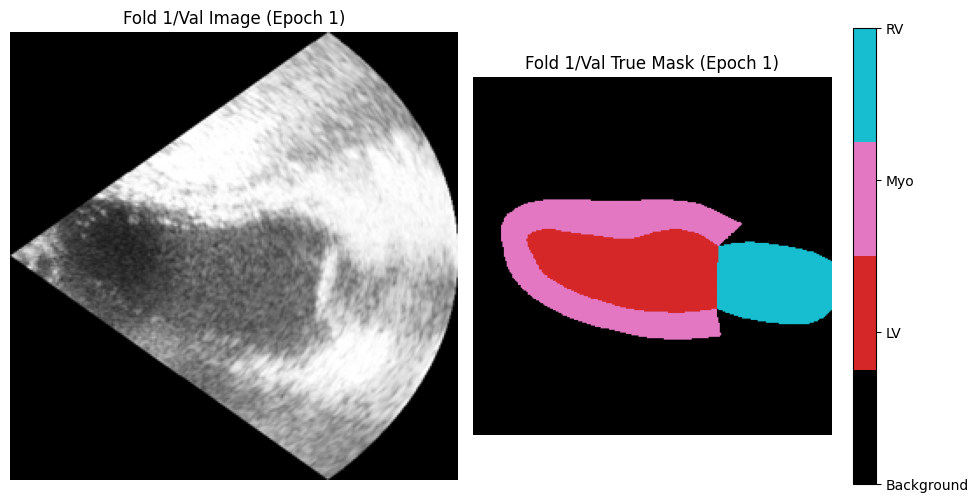

/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


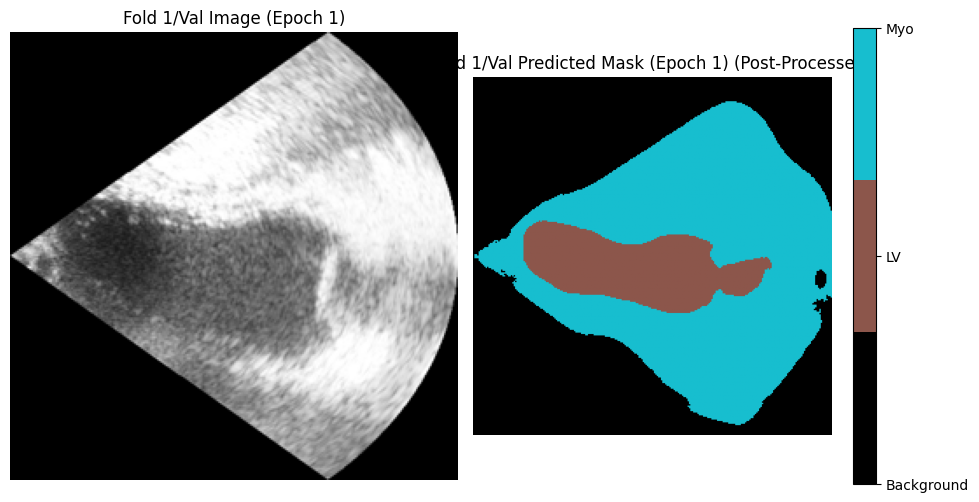

Fold 1/Epoch 1 Validation:   4%|▍         | 1/25 [00:06<02:41,  6.73s/it]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 1/Epoch 1 Validation: 100%|██████████| 25/25 [01:13<00:00,  2.93s/it]


Fold 1/Epoch 1 Validation finished. Average Val Loss: 0.8358
  Fold 1/Overall Avg Val Dice: 0.3811, Overall Avg Val IoU: 0.2776
    LV Dice: 0.6642, IoU: 0.5113
    Myo Dice: 0.4783, IoU: 0.3211
    RV Dice: 0.0007, IoU: 0.0003
New best model saved! (Overall Dice: 0.3811) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_1/best_unet_temporal_fold1_model.pth

Fold 1/Epoch 2/50 - Training


Fold 1/Epoch 2 Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:72: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 1/Epoch 2 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 1/Epoch 2 Training finished. Average Train Loss: 0.5456
Fold 1 - Epoch 2 - Validation


Fold 1/Epoch 2 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.42it/s]


Fold 1/Epoch 2 Validation finished. Average Val Loss: 0.6400
  Fold 1/Overall Avg Val Dice: 0.4162, Overall Avg Val IoU: 0.3068
    LV Dice: 0.7024, IoU: 0.5484
    Myo Dice: 0.5119, IoU: 0.3529
    RV Dice: 0.0344, IoU: 0.0191
New best model saved! (Overall Dice: 0.4162) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_1/best_unet_temporal_fold1_model.pth

Fold 1/Epoch 3/50 - Training


Fold 1/Epoch 3 Training: 100%|██████████| 100/100 [01:07<00:00,  1.49it/s]


Fold 1/Epoch 3 Training finished. Average Train Loss: 0.3991
Fold 1 - Epoch 3 - Validation


Fold 1/Epoch 3 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]


Fold 1/Epoch 3 Validation finished. Average Val Loss: 0.5146
  Fold 1/Overall Avg Val Dice: 0.5473, Overall Avg Val IoU: 0.4189
    LV Dice: 0.7407, IoU: 0.6103
    Myo Dice: 0.5653, IoU: 0.4044
    RV Dice: 0.3360, IoU: 0.2421
New best model saved! (Overall Dice: 0.5473) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_1/best_unet_temporal_fold1_model.pth

Fold 1/Epoch 4/50 - Training


Fold 1/Epoch 4 Training: 100%|██████████| 100/100 [01:08<00:00,  1.47it/s]


Fold 1/Epoch 4 Training finished. Average Train Loss: 0.3444
Fold 1 - Epoch 4 - Validation


Fold 1/Epoch 4 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.46it/s]


Fold 1/Epoch 4 Validation finished. Average Val Loss: 0.4509
  Fold 1/Overall Avg Val Dice: 0.5985, Overall Avg Val IoU: 0.4657
    LV Dice: 0.7917, IoU: 0.6712
    Myo Dice: 0.5853, IoU: 0.4226
    RV Dice: 0.4186, IoU: 0.3032
New best model saved! (Overall Dice: 0.5985) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_1/best_unet_temporal_fold1_model.pth

Fold 1/Epoch 5/50 - Training


Fold 1/Epoch 5 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 1/Epoch 5 Training finished. Average Train Loss: 0.3025
Fold 1 - Epoch 5 - Validation


Fold 1/Epoch 5 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]


Fold 1/Epoch 5 Validation finished. Average Val Loss: 0.3826
  Fold 1/Overall Avg Val Dice: 0.6948, Overall Avg Val IoU: 0.5663
    LV Dice: 0.7993, IoU: 0.6983
    Myo Dice: 0.6364, IoU: 0.4747
    RV Dice: 0.6488, IoU: 0.5260
New best model saved! (Overall Dice: 0.6948) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_1/best_unet_temporal_fold1_model.pth

Fold 1/Epoch 6/50 - Training


Fold 1/Epoch 6 Training: 100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Fold 1/Epoch 6 Training finished. Average Train Loss: 0.2913
Fold 1 - Epoch 6 - Validation


Fold 1/Epoch 6 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]


Fold 1/Epoch 6 Validation finished. Average Val Loss: 0.4392
  Fold 1/Overall Avg Val Dice: 0.6197, Overall Avg Val IoU: 0.4988
    LV Dice: 0.8019, IoU: 0.6878
    Myo Dice: 0.6619, IoU: 0.5042
    RV Dice: 0.3953, IoU: 0.3045

Fold 1/Epoch 7/50 - Training


Fold 1/Epoch 7 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 1/Epoch 7 Training finished. Average Train Loss: 0.2625
Fold 1 - Epoch 7 - Validation


Fold 1/Epoch 7 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]


Fold 1/Epoch 7 Validation finished. Average Val Loss: 0.4072
  Fold 1/Overall Avg Val Dice: 0.6658, Overall Avg Val IoU: 0.5358
    LV Dice: 0.8126, IoU: 0.7009
    Myo Dice: 0.6184, IoU: 0.4582
    RV Dice: 0.5663, IoU: 0.4481

Fold 1/Epoch 8/50 - Training


Fold 1/Epoch 8 Training: 100%|██████████| 100/100 [01:08<00:00,  1.47it/s]


Fold 1/Epoch 8 Training finished. Average Train Loss: 0.2595
Fold 1 - Epoch 8 - Validation


Fold 1/Epoch 8 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]


Fold 1/Epoch 8 Validation finished. Average Val Loss: 0.3381
  Fold 1/Overall Avg Val Dice: 0.7272, Overall Avg Val IoU: 0.6040
    LV Dice: 0.8402, IoU: 0.7399
    Myo Dice: 0.6833, IoU: 0.5315
    RV Dice: 0.6581, IoU: 0.5405
New best model saved! (Overall Dice: 0.7272) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_1/best_unet_temporal_fold1_model.pth

Fold 1/Epoch 9/50 - Training


Fold 1/Epoch 9 Training: 100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Fold 1/Epoch 9 Training finished. Average Train Loss: 0.2429
Fold 1 - Epoch 9 - Validation


Fold 1/Epoch 9 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]


Fold 1/Epoch 9 Validation finished. Average Val Loss: 0.3267
  Fold 1/Overall Avg Val Dice: 0.7284, Overall Avg Val IoU: 0.6107
    LV Dice: 0.8615, IoU: 0.7706
    Myo Dice: 0.7086, IoU: 0.5612
    RV Dice: 0.6150, IoU: 0.5004
New best model saved! (Overall Dice: 0.7284) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_1/best_unet_temporal_fold1_model.pth

Fold 1/Epoch 10/50 - Training


Fold 1/Epoch 10 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 1/Epoch 10 Training finished. Average Train Loss: 0.2474
Fold 1 - Epoch 10 - Validation


Fold 1/Epoch 10 Validation:   0%|          | 0/25 [00:00<?, ?it/s]


    Fold 1/Visualizing a validation sample from Epoch 10 (True Mask vs Predicted Mask)...


/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


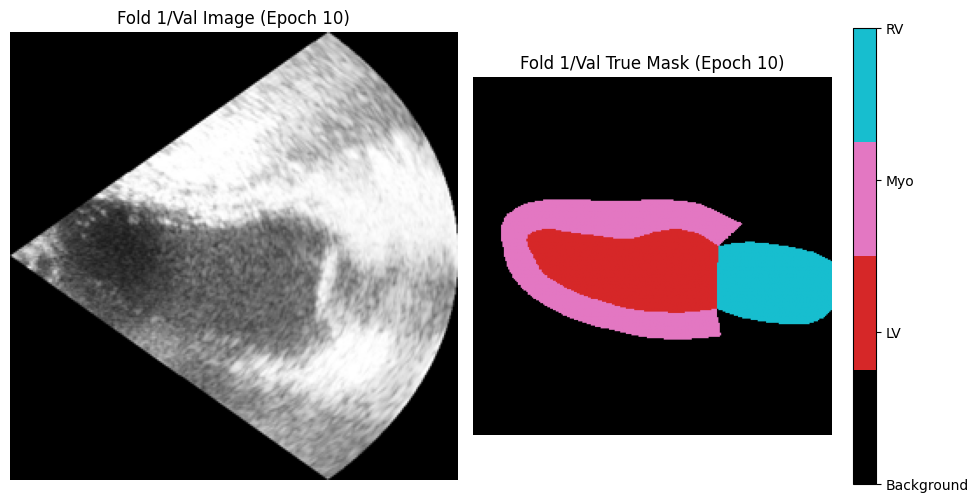

/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


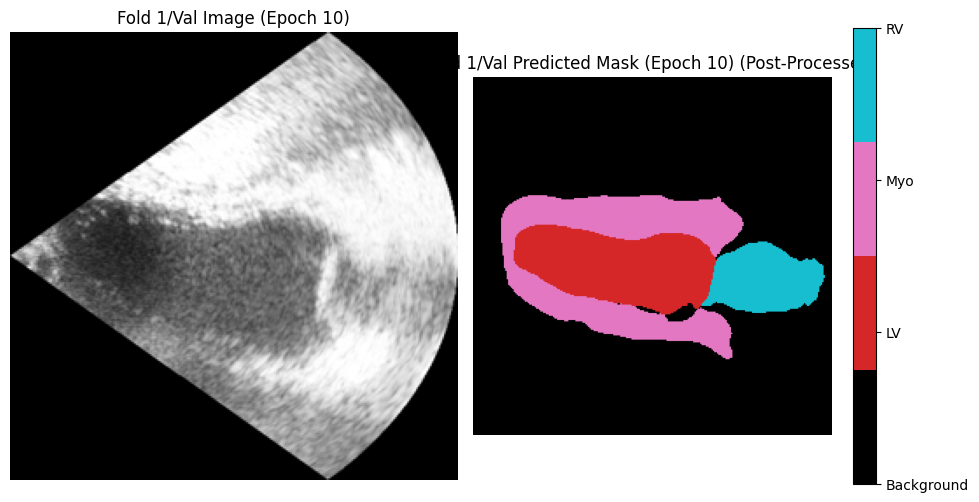

Fold 1/Epoch 10 Validation:   4%|▍         | 1/25 [00:02<00:51,  2.14s/it]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 1/Epoch 10 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.45it/s]


Fold 1/Epoch 10 Validation finished. Average Val Loss: 0.4425
  Fold 1/Overall Avg Val Dice: 0.6221, Overall Avg Val IoU: 0.5028
    LV Dice: 0.7901, IoU: 0.6800
    Myo Dice: 0.6148, IoU: 0.4565
    RV Dice: 0.4614, IoU: 0.3719

Fold 1/Epoch 11/50 - Training


Fold 1/Epoch 11 Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:72: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 1/Epoch 11 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 1/Epoch 11 Training finished. Average Train Loss: 0.2260
Fold 1 - Epoch 11 - Validation


Fold 1/Epoch 11 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]


Fold 1/Epoch 11 Validation finished. Average Val Loss: 0.3296
  Fold 1/Overall Avg Val Dice: 0.7383, Overall Avg Val IoU: 0.6229
    LV Dice: 0.8502, IoU: 0.7598
    Myo Dice: 0.6874, IoU: 0.5362
    RV Dice: 0.6771, IoU: 0.5728
New best model saved! (Overall Dice: 0.7383) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_1/best_unet_temporal_fold1_model.pth

Fold 1/Epoch 12/50 - Training


Fold 1/Epoch 12 Training: 100%|██████████| 100/100 [01:07<00:00,  1.49it/s]


Fold 1/Epoch 12 Training finished. Average Train Loss: 0.2157
Fold 1 - Epoch 12 - Validation


Fold 1/Epoch 12 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]


Fold 1/Epoch 12 Validation finished. Average Val Loss: 0.3157
  Fold 1/Overall Avg Val Dice: 0.7409, Overall Avg Val IoU: 0.6155
    LV Dice: 0.8231, IoU: 0.7223
    Myo Dice: 0.7127, IoU: 0.5618
    RV Dice: 0.6870, IoU: 0.5624
New best model saved! (Overall Dice: 0.7409) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_1/best_unet_temporal_fold1_model.pth

Fold 1/Epoch 13/50 - Training


Fold 1/Epoch 13 Training: 100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Fold 1/Epoch 13 Training finished. Average Train Loss: 0.2130
Fold 1 - Epoch 13 - Validation


Fold 1/Epoch 13 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]


Fold 1/Epoch 13 Validation finished. Average Val Loss: 0.3051
  Fold 1/Overall Avg Val Dice: 0.7500, Overall Avg Val IoU: 0.6321
    LV Dice: 0.8371, IoU: 0.7496
    Myo Dice: 0.6974, IoU: 0.5518
    RV Dice: 0.7154, IoU: 0.5947
New best model saved! (Overall Dice: 0.7500) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_1/best_unet_temporal_fold1_model.pth

Fold 1/Epoch 14/50 - Training


Fold 1/Epoch 14 Training: 100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Fold 1/Epoch 14 Training finished. Average Train Loss: 0.2114
Fold 1 - Epoch 14 - Validation


Fold 1/Epoch 14 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.45it/s]


Fold 1/Epoch 14 Validation finished. Average Val Loss: 0.2452
  Fold 1/Overall Avg Val Dice: 0.8074, Overall Avg Val IoU: 0.7018
    LV Dice: 0.8823, IoU: 0.8006
    Myo Dice: 0.7725, IoU: 0.6363
    RV Dice: 0.7673, IoU: 0.6687
New best model saved! (Overall Dice: 0.8074) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_1/best_unet_temporal_fold1_model.pth

Fold 1/Epoch 15/50 - Training


Fold 1/Epoch 15 Training: 100%|██████████| 100/100 [01:08<00:00,  1.47it/s]


Fold 1/Epoch 15 Training finished. Average Train Loss: 0.1956
Fold 1 - Epoch 15 - Validation


Fold 1/Epoch 15 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]


Fold 1/Epoch 15 Validation finished. Average Val Loss: 0.2494
  Fold 1/Overall Avg Val Dice: 0.7986, Overall Avg Val IoU: 0.6909
    LV Dice: 0.8791, IoU: 0.8014
    Myo Dice: 0.7397, IoU: 0.6004
    RV Dice: 0.7770, IoU: 0.6709

Fold 1/Epoch 16/50 - Training


Fold 1/Epoch 16 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 1/Epoch 16 Training finished. Average Train Loss: 0.1907
Fold 1 - Epoch 16 - Validation


Fold 1/Epoch 16 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]


Fold 1/Epoch 16 Validation finished. Average Val Loss: 0.2320
  Fold 1/Overall Avg Val Dice: 0.8074, Overall Avg Val IoU: 0.7028
    LV Dice: 0.8786, IoU: 0.7969
    Myo Dice: 0.7748, IoU: 0.6422
    RV Dice: 0.7687, IoU: 0.6692

Fold 1/Epoch 17/50 - Training


Fold 1/Epoch 17 Training: 100%|██████████| 100/100 [01:07<00:00,  1.49it/s]


Fold 1/Epoch 17 Training finished. Average Train Loss: 0.1910
Fold 1 - Epoch 17 - Validation


Fold 1/Epoch 17 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]


Fold 1/Epoch 17 Validation finished. Average Val Loss: 0.2358
  Fold 1/Overall Avg Val Dice: 0.8065, Overall Avg Val IoU: 0.7028
    LV Dice: 0.8658, IoU: 0.7818
    Myo Dice: 0.7746, IoU: 0.6448
    RV Dice: 0.7790, IoU: 0.6819

Fold 1/Epoch 18/50 - Training


Fold 1/Epoch 18 Training: 100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Fold 1/Epoch 18 Training finished. Average Train Loss: 0.1933
Fold 1 - Epoch 18 - Validation


Fold 1/Epoch 18 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]


Fold 1/Epoch 18 Validation finished. Average Val Loss: 0.4061
  Fold 1/Overall Avg Val Dice: 0.6335, Overall Avg Val IoU: 0.5151
    LV Dice: 0.7779, IoU: 0.6598
    Myo Dice: 0.7171, IoU: 0.5709
    RV Dice: 0.4054, IoU: 0.3148

Fold 1/Epoch 19/50 - Training


Fold 1/Epoch 19 Training: 100%|██████████| 100/100 [01:07<00:00,  1.49it/s]


Fold 1/Epoch 19 Training finished. Average Train Loss: 0.1866
Fold 1 - Epoch 19 - Validation


Fold 1/Epoch 19 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]


Fold 1/Epoch 19 Validation finished. Average Val Loss: 0.2256
  Fold 1/Overall Avg Val Dice: 0.8085, Overall Avg Val IoU: 0.7017
    LV Dice: 0.8791, IoU: 0.7971
    Myo Dice: 0.7909, IoU: 0.6626
    RV Dice: 0.7554, IoU: 0.6454
New best model saved! (Overall Dice: 0.8085) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_1/best_unet_temporal_fold1_model.pth

Fold 1/Epoch 20/50 - Training


Fold 1/Epoch 20 Training: 100%|██████████| 100/100 [01:08<00:00,  1.47it/s]


Fold 1/Epoch 20 Training finished. Average Train Loss: 0.1826
Fold 1 - Epoch 20 - Validation


Fold 1/Epoch 20 Validation:   0%|          | 0/25 [00:00<?, ?it/s]


    Fold 1/Visualizing a validation sample from Epoch 20 (True Mask vs Predicted Mask)...


/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


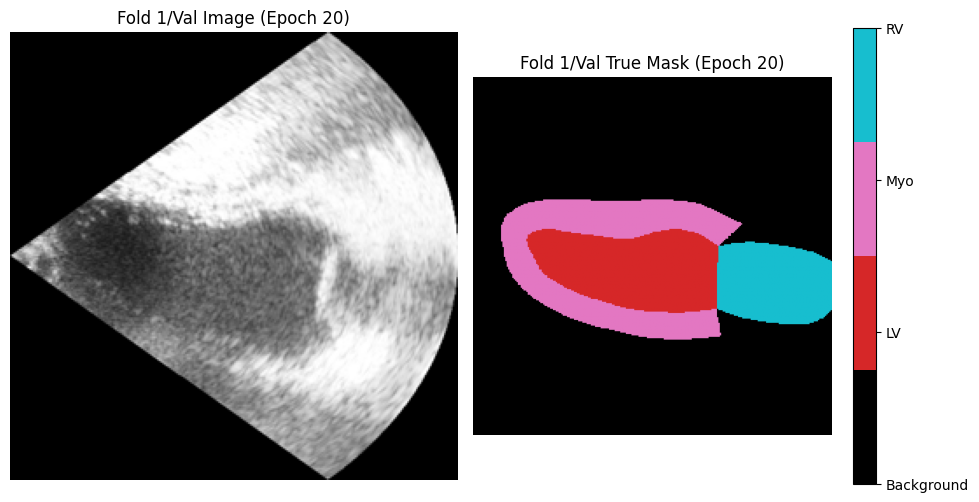

/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


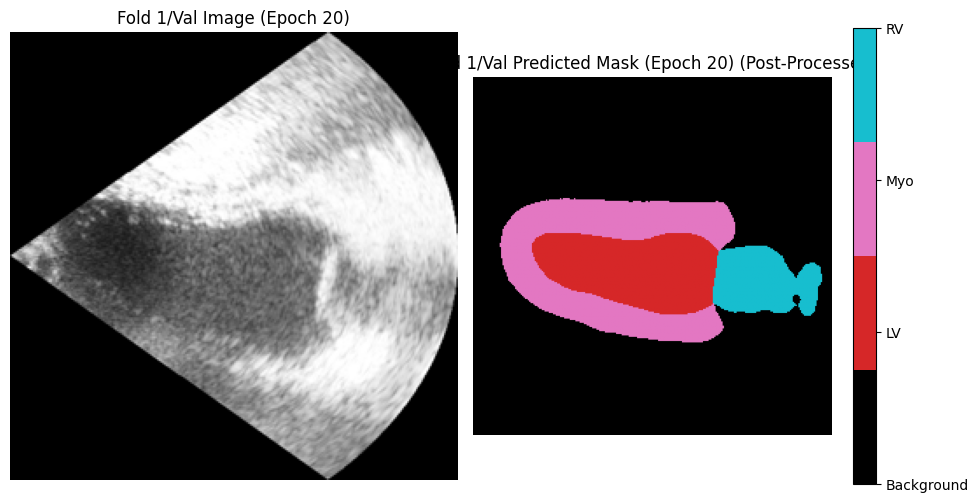

Fold 1/Epoch 20 Validation:   4%|▍         | 1/25 [00:02<00:49,  2.06s/it]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 1/Epoch 20 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]


Fold 1/Epoch 20 Validation finished. Average Val Loss: 0.2245
  Fold 1/Overall Avg Val Dice: 0.8028, Overall Avg Val IoU: 0.6960
    LV Dice: 0.8760, IoU: 0.7895
    Myo Dice: 0.8009, IoU: 0.6777
    RV Dice: 0.7314, IoU: 0.6207

Fold 1/Epoch 21/50 - Training


Fold 1/Epoch 21 Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:72: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 1/Epoch 21 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 1/Epoch 21 Training finished. Average Train Loss: 0.1828
Fold 1 - Epoch 21 - Validation


Fold 1/Epoch 21 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.42it/s]


Fold 1/Epoch 21 Validation finished. Average Val Loss: 0.2555
  Fold 1/Overall Avg Val Dice: 0.7901, Overall Avg Val IoU: 0.6858
    LV Dice: 0.8704, IoU: 0.7909
    Myo Dice: 0.7704, IoU: 0.6373
    RV Dice: 0.7296, IoU: 0.6291

Fold 1/Epoch 22/50 - Training


Fold 1/Epoch 22 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 1/Epoch 22 Training finished. Average Train Loss: 0.1795
Fold 1 - Epoch 22 - Validation


Fold 1/Epoch 22 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.42it/s]


Fold 1/Epoch 22 Validation finished. Average Val Loss: 0.2412
  Fold 1/Overall Avg Val Dice: 0.8077, Overall Avg Val IoU: 0.7030
    LV Dice: 0.8676, IoU: 0.7835
    Myo Dice: 0.7699, IoU: 0.6351
    RV Dice: 0.7856, IoU: 0.6905

Fold 1/Epoch 23/50 - Training


Fold 1/Epoch 23 Training: 100%|██████████| 100/100 [01:10<00:00,  1.43it/s]


Fold 1/Epoch 23 Training finished. Average Train Loss: 0.1810
Fold 1 - Epoch 23 - Validation


Fold 1/Epoch 23 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.42it/s]


Fold 1/Epoch 23 Validation finished. Average Val Loss: 0.2419
  Fold 1/Overall Avg Val Dice: 0.7986, Overall Avg Val IoU: 0.6944
    LV Dice: 0.8715, IoU: 0.7860
    Myo Dice: 0.7858, IoU: 0.6568
    RV Dice: 0.7385, IoU: 0.6403

Fold 1/Epoch 24/50 - Training


Fold 1/Epoch 24 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 1/Epoch 24 Training finished. Average Train Loss: 0.1703
Fold 1 - Epoch 24 - Validation


Fold 1/Epoch 24 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]


Fold 1/Epoch 24 Validation finished. Average Val Loss: 0.2271
  Fold 1/Overall Avg Val Dice: 0.8172, Overall Avg Val IoU: 0.7123
    LV Dice: 0.8865, IoU: 0.8073
    Myo Dice: 0.7741, IoU: 0.6417
    RV Dice: 0.7912, IoU: 0.6878
New best model saved! (Overall Dice: 0.8172) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_1/best_unet_temporal_fold1_model.pth

Fold 1/Epoch 25/50 - Training


Fold 1/Epoch 25 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 1/Epoch 25 Training finished. Average Train Loss: 0.1686
Fold 1 - Epoch 25 - Validation


Fold 1/Epoch 25 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.42it/s]


Fold 1/Epoch 25 Validation finished. Average Val Loss: 0.2588
  Fold 1/Overall Avg Val Dice: 0.7873, Overall Avg Val IoU: 0.6816
    LV Dice: 0.8797, IoU: 0.8001
    Myo Dice: 0.7669, IoU: 0.6306
    RV Dice: 0.7154, IoU: 0.6142

Fold 1/Epoch 26/50 - Training


Fold 1/Epoch 26 Training: 100%|██████████| 100/100 [01:10<00:00,  1.43it/s]


Fold 1/Epoch 26 Training finished. Average Train Loss: 0.1709
Fold 1 - Epoch 26 - Validation


Fold 1/Epoch 26 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.45it/s]


Fold 1/Epoch 26 Validation finished. Average Val Loss: 0.2475
  Fold 1/Overall Avg Val Dice: 0.7795, Overall Avg Val IoU: 0.6662
    LV Dice: 0.8427, IoU: 0.7466
    Myo Dice: 0.7301, IoU: 0.5892
    RV Dice: 0.7657, IoU: 0.6629

Fold 1/Epoch 27/50 - Training


Fold 1/Epoch 27 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 1/Epoch 27 Training finished. Average Train Loss: 0.1760
Fold 1 - Epoch 27 - Validation


Fold 1/Epoch 27 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]


Fold 1/Epoch 27 Validation finished. Average Val Loss: 0.3074
  Fold 1/Overall Avg Val Dice: 0.7470, Overall Avg Val IoU: 0.6304
    LV Dice: 0.8340, IoU: 0.7275
    Myo Dice: 0.7475, IoU: 0.6091
    RV Dice: 0.6595, IoU: 0.5545

Fold 1/Epoch 28/50 - Training


Fold 1/Epoch 28 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 1/Epoch 28 Training finished. Average Train Loss: 0.1686
Fold 1 - Epoch 28 - Validation


Fold 1/Epoch 28 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]


Fold 1/Epoch 28 Validation finished. Average Val Loss: 0.2591
  Fold 1/Overall Avg Val Dice: 0.7771, Overall Avg Val IoU: 0.6728
    LV Dice: 0.8645, IoU: 0.7737
    Myo Dice: 0.7883, IoU: 0.6605
    RV Dice: 0.6785, IoU: 0.5841

Fold 1/Epoch 29/50 - Training


Fold 1/Epoch 29 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 1/Epoch 29 Training finished. Average Train Loss: 0.1679
Fold 1 - Epoch 29 - Validation


Fold 1/Epoch 29 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]


Fold 1/Epoch 29 Validation finished. Average Val Loss: 0.2396
  Fold 1/Overall Avg Val Dice: 0.8055, Overall Avg Val IoU: 0.7037
    LV Dice: 0.8760, IoU: 0.7993
    Myo Dice: 0.7905, IoU: 0.6626
    RV Dice: 0.7501, IoU: 0.6493

Fold 1/Epoch 30/50 - Training


Fold 1/Epoch 30 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 1/Epoch 30 Training finished. Average Train Loss: 0.1598
Fold 1 - Epoch 30 - Validation


Fold 1/Epoch 30 Validation:   0%|          | 0/25 [00:00<?, ?it/s]


    Fold 1/Visualizing a validation sample from Epoch 30 (True Mask vs Predicted Mask)...


/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


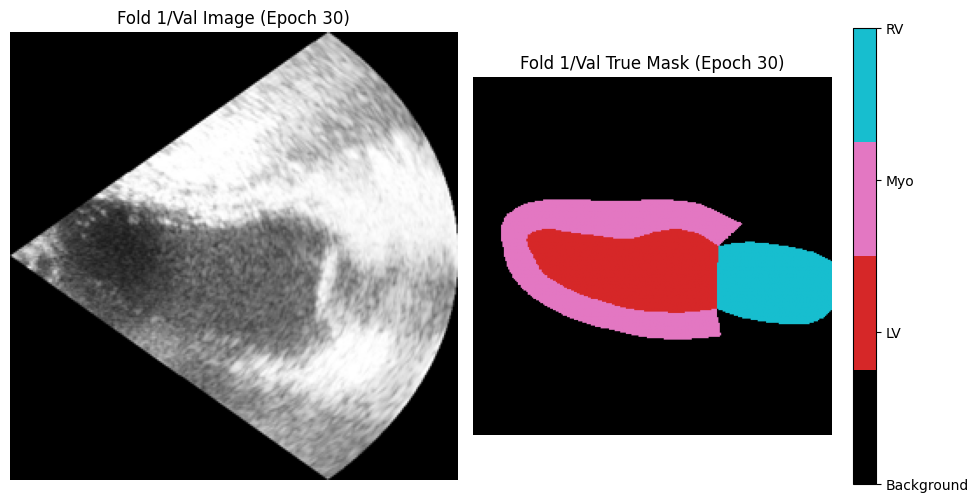

/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


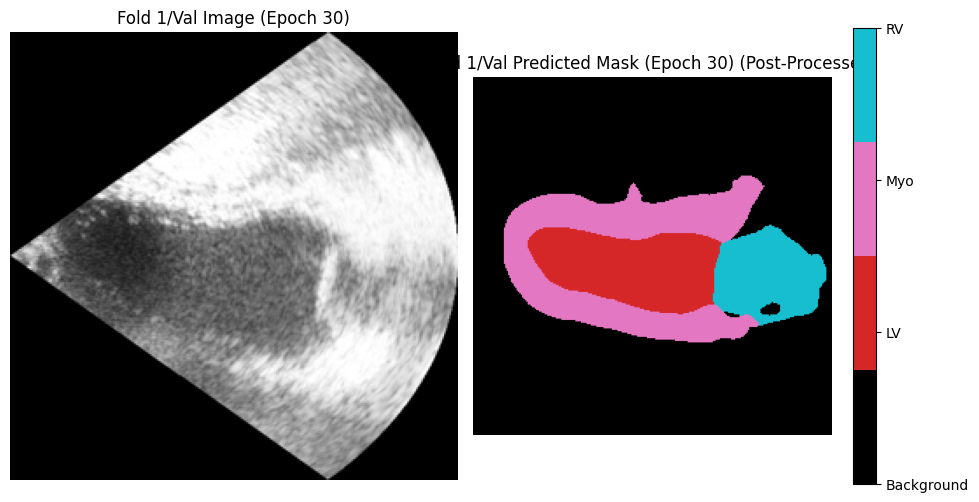

Fold 1/Epoch 30 Validation:   4%|▍         | 1/25 [00:02<00:50,  2.10s/it]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 1/Epoch 30 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]


Fold 1/Epoch 30 Validation finished. Average Val Loss: 0.2047
  Fold 1/Overall Avg Val Dice: 0.8263, Overall Avg Val IoU: 0.7268
    LV Dice: 0.8909, IoU: 0.8119
    Myo Dice: 0.8067, IoU: 0.6849
    RV Dice: 0.7812, IoU: 0.6836
New best model saved! (Overall Dice: 0.8263) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_1/best_unet_temporal_fold1_model.pth

Fold 1/Epoch 31/50 - Training


Fold 1/Epoch 31 Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:72: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 1/Epoch 31 Training: 100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Fold 1/Epoch 31 Training finished. Average Train Loss: 0.1628
Fold 1 - Epoch 31 - Validation


Fold 1/Epoch 31 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]


Fold 1/Epoch 31 Validation finished. Average Val Loss: 0.2064
  Fold 1/Overall Avg Val Dice: 0.8285, Overall Avg Val IoU: 0.7286
    LV Dice: 0.8945, IoU: 0.8160
    Myo Dice: 0.7995, IoU: 0.6736
    RV Dice: 0.7914, IoU: 0.6961
New best model saved! (Overall Dice: 0.8285) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_1/best_unet_temporal_fold1_model.pth

Fold 1/Epoch 32/50 - Training


Fold 1/Epoch 32 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 1/Epoch 32 Training finished. Average Train Loss: 0.1642
Fold 1 - Epoch 32 - Validation


Fold 1/Epoch 32 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.42it/s]


Fold 1/Epoch 32 Validation finished. Average Val Loss: 0.1908
  Fold 1/Overall Avg Val Dice: 0.8403, Overall Avg Val IoU: 0.7435
    LV Dice: 0.8885, IoU: 0.8107
    Myo Dice: 0.8089, IoU: 0.6868
    RV Dice: 0.8235, IoU: 0.7329
New best model saved! (Overall Dice: 0.8403) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_1/best_unet_temporal_fold1_model.pth

Fold 1/Epoch 33/50 - Training


Fold 1/Epoch 33 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 1/Epoch 33 Training finished. Average Train Loss: 0.1615
Fold 1 - Epoch 33 - Validation


Fold 1/Epoch 33 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]


Fold 1/Epoch 33 Validation finished. Average Val Loss: 0.2883
  Fold 1/Overall Avg Val Dice: 0.7620, Overall Avg Val IoU: 0.6530
    LV Dice: 0.8571, IoU: 0.7681
    Myo Dice: 0.7422, IoU: 0.6004
    RV Dice: 0.6869, IoU: 0.5905

Fold 1/Epoch 34/50 - Training


Fold 1/Epoch 34 Training: 100%|██████████| 100/100 [01:08<00:00,  1.47it/s]


Fold 1/Epoch 34 Training finished. Average Train Loss: 0.1650
Fold 1 - Epoch 34 - Validation


Fold 1/Epoch 34 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]


Fold 1/Epoch 34 Validation finished. Average Val Loss: 0.2140
  Fold 1/Overall Avg Val Dice: 0.8198, Overall Avg Val IoU: 0.7211
    LV Dice: 0.8889, IoU: 0.8089
    Myo Dice: 0.8022, IoU: 0.6797
    RV Dice: 0.7684, IoU: 0.6745

Fold 1/Epoch 35/50 - Training


Fold 1/Epoch 35 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 1/Epoch 35 Training finished. Average Train Loss: 0.1616
Fold 1 - Epoch 35 - Validation


Fold 1/Epoch 35 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]


Fold 1/Epoch 35 Validation finished. Average Val Loss: 0.2444
  Fold 1/Overall Avg Val Dice: 0.7934, Overall Avg Val IoU: 0.6851
    LV Dice: 0.8562, IoU: 0.7644
    Myo Dice: 0.7873, IoU: 0.6591
    RV Dice: 0.7369, IoU: 0.6318

Fold 1/Epoch 36/50 - Training


Fold 1/Epoch 36 Training: 100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Fold 1/Epoch 36 Training finished. Average Train Loss: 0.1568
Fold 1 - Epoch 36 - Validation


Fold 1/Epoch 36 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]


Fold 1/Epoch 36 Validation finished. Average Val Loss: 0.2136
  Fold 1/Overall Avg Val Dice: 0.8224, Overall Avg Val IoU: 0.7245
    LV Dice: 0.8813, IoU: 0.8031
    Myo Dice: 0.7968, IoU: 0.6730
    RV Dice: 0.7891, IoU: 0.6975

Fold 1/Epoch 37/50 - Training


Fold 1/Epoch 37 Training: 100%|██████████| 100/100 [01:08<00:00,  1.45it/s]


Fold 1/Epoch 37 Training finished. Average Train Loss: 0.1502
Fold 1 - Epoch 37 - Validation


Fold 1/Epoch 37 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]


Fold 1/Epoch 37 Validation finished. Average Val Loss: 0.2374
  Fold 1/Overall Avg Val Dice: 0.8006, Overall Avg Val IoU: 0.6945
    LV Dice: 0.8679, IoU: 0.7821
    Myo Dice: 0.7880, IoU: 0.6610
    RV Dice: 0.7460, IoU: 0.6404

Fold 1/Epoch 38/50 - Training


Fold 1/Epoch 38 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 1/Epoch 38 Training finished. Average Train Loss: 0.1495
Fold 1 - Epoch 38 - Validation


Fold 1/Epoch 38 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]


Fold 1/Epoch 38 Validation finished. Average Val Loss: 0.2460
  Fold 1/Overall Avg Val Dice: 0.7970, Overall Avg Val IoU: 0.6919
    LV Dice: 0.8719, IoU: 0.7839
    Myo Dice: 0.7866, IoU: 0.6606
    RV Dice: 0.7326, IoU: 0.6311

Fold 1/Epoch 39/50 - Training


Fold 1/Epoch 39 Training: 100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Fold 1/Epoch 39 Training finished. Average Train Loss: 0.1411
Fold 1 - Epoch 39 - Validation


Fold 1/Epoch 39 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]


Fold 1/Epoch 39 Validation finished. Average Val Loss: 0.1994
  Fold 1/Overall Avg Val Dice: 0.8316, Overall Avg Val IoU: 0.7375
    LV Dice: 0.8909, IoU: 0.8132
    Myo Dice: 0.8148, IoU: 0.6968
    RV Dice: 0.7892, IoU: 0.7026

Fold 1/Epoch 40/50 - Training


Fold 1/Epoch 40 Training: 100%|██████████| 100/100 [01:08<00:00,  1.47it/s]


Fold 1/Epoch 40 Training finished. Average Train Loss: 0.1382
Fold 1 - Epoch 40 - Validation


Fold 1/Epoch 40 Validation:   0%|          | 0/25 [00:00<?, ?it/s]


    Fold 1/Visualizing a validation sample from Epoch 40 (True Mask vs Predicted Mask)...


/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


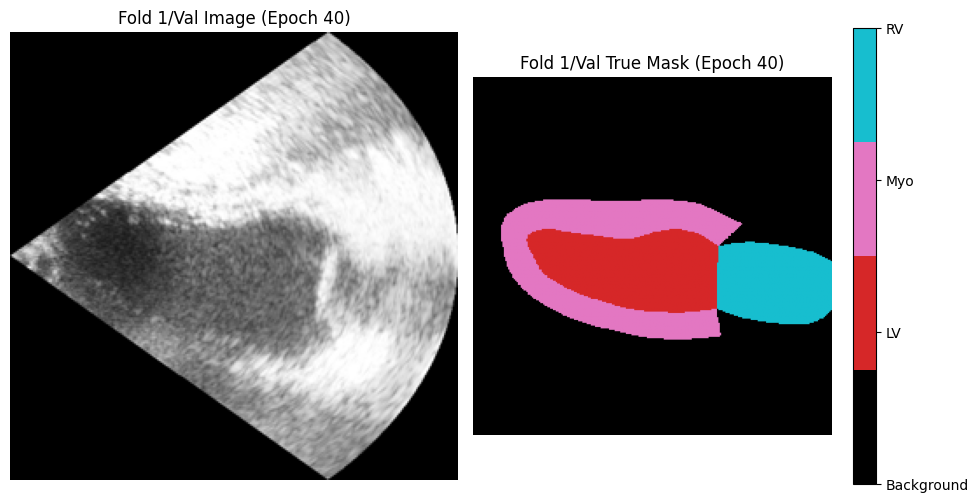

/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


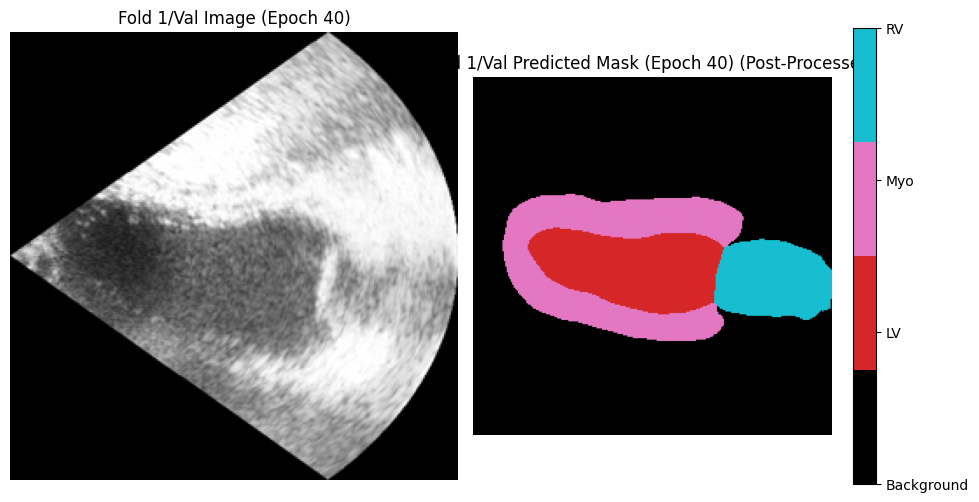

Fold 1/Epoch 40 Validation:   4%|▍         | 1/25 [00:02<00:48,  2.03s/it]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 1/Epoch 40 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]


Fold 1/Epoch 40 Validation finished. Average Val Loss: 0.1917
  Fold 1/Overall Avg Val Dice: 0.8346, Overall Avg Val IoU: 0.7409
    LV Dice: 0.8887, IoU: 0.8145
    Myo Dice: 0.8184, IoU: 0.7017
    RV Dice: 0.7967, IoU: 0.7064

Fold 1/Epoch 41/50 - Training


Fold 1/Epoch 41 Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:72: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 1/Epoch 41 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 1/Epoch 41 Training finished. Average Train Loss: 0.1325
Fold 1 - Epoch 41 - Validation


Fold 1/Epoch 41 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]


Fold 1/Epoch 41 Validation finished. Average Val Loss: 0.1930
  Fold 1/Overall Avg Val Dice: 0.8348, Overall Avg Val IoU: 0.7409
    LV Dice: 0.8951, IoU: 0.8196
    Myo Dice: 0.8184, IoU: 0.7014
    RV Dice: 0.7910, IoU: 0.7018

Fold 1/Epoch 42/50 - Training


Fold 1/Epoch 42 Training: 100%|██████████| 100/100 [01:08<00:00,  1.47it/s]


Fold 1/Epoch 42 Training finished. Average Train Loss: 0.1326
Fold 1 - Epoch 42 - Validation


Fold 1/Epoch 42 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]


Fold 1/Epoch 42 Validation finished. Average Val Loss: 0.1929
  Fold 1/Overall Avg Val Dice: 0.8335, Overall Avg Val IoU: 0.7395
    LV Dice: 0.8933, IoU: 0.8160
    Myo Dice: 0.8162, IoU: 0.6999
    RV Dice: 0.7910, IoU: 0.7025

Early stopping triggered after 42 epochs due to no improvement in validation Dice score for 10 epochs.

Fold 1/Training complete!

======== Starting Fold 2/5 ========
CamusTemporalDataset (Training): Initializing and scanning for sequences...
CamusTemporalDataset (Training): Found 500 valid 2CH_half_sequence samples.
CamusTemporalDataset (Validation/Test): Initializing and scanning for sequences...
CamusTemporalDataset (Validation/Test): Found 500 valid 2CH_half_sequence samples.
Fold 2: Training DataLoader has 100 batches (400 samples).
Fold 2: Validation DataLoader has 25 batches (100 samples).


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/tmp/ipython-input-15-1634110382.py:94: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = amp.GradScaler()


Checkpoints for Fold 2 will be saved to: /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_2

--- Fold 2/Starting Training and Validation Loop ---
Starting training for 50 epochs (actual epochs may vary due to early stopping criteria)...

Fold 2/Epoch 1/50 - Training


Fold 2/Epoch 1 Training: 100%|██████████| 100/100 [01:09<00:00,  1.43it/s]


Fold 2/Epoch 1 Training finished. Average Train Loss: 0.7568
Fold 2 - Epoch 1 - Validation


Fold 2/Epoch 1 Validation:   0%|          | 0/25 [00:00<?, ?it/s]


    Fold 2/Visualizing a validation sample from Epoch 1 (True Mask vs Predicted Mask)...


/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


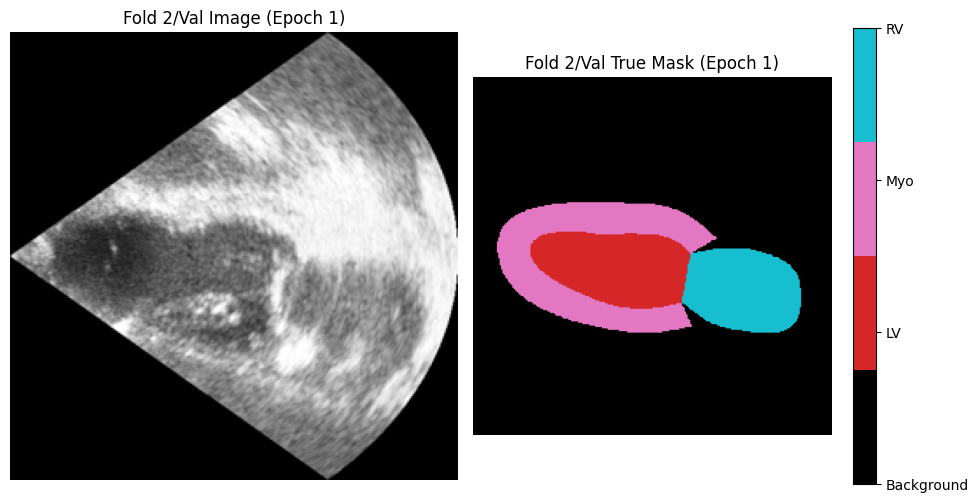

/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


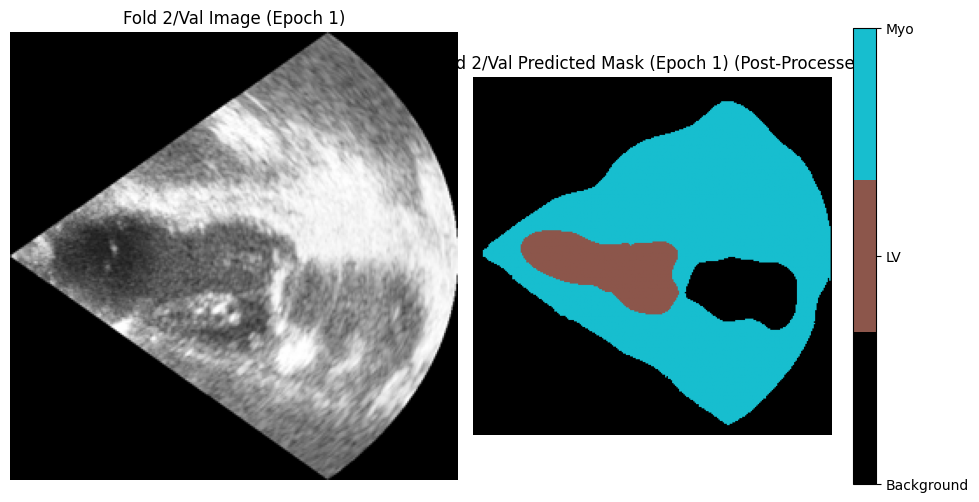

Fold 2/Epoch 1 Validation:   4%|▍         | 1/25 [00:02<01:04,  2.69s/it]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 2/Epoch 1 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]


Fold 2/Epoch 1 Validation finished. Average Val Loss: 0.8676
  Fold 2/Overall Avg Val Dice: 0.3340, Overall Avg Val IoU: 0.2331
    LV Dice: 0.5602, IoU: 0.4106
    Myo Dice: 0.4419, IoU: 0.2886
    RV Dice: 0.0000, IoU: 0.0000
New best model saved! (Overall Dice: 0.3340) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_2/best_unet_temporal_fold2_model.pth

Fold 2/Epoch 2/50 - Training


Fold 2/Epoch 2 Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:72: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 2/Epoch 2 Training: 100%|██████████| 100/100 [01:07<00:00,  1.49it/s]


Fold 2/Epoch 2 Training finished. Average Train Loss: 0.5199
Fold 2 - Epoch 2 - Validation


Fold 2/Epoch 2 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.45it/s]


Fold 2/Epoch 2 Validation finished. Average Val Loss: 0.6556
  Fold 2/Overall Avg Val Dice: 0.3793, Overall Avg Val IoU: 0.2740
    LV Dice: 0.6490, IoU: 0.4955
    Myo Dice: 0.4708, IoU: 0.3168
    RV Dice: 0.0180, IoU: 0.0099
New best model saved! (Overall Dice: 0.3793) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_2/best_unet_temporal_fold2_model.pth

Fold 2/Epoch 3/50 - Training


Fold 2/Epoch 3 Training: 100%|██████████| 100/100 [01:08<00:00,  1.47it/s]


Fold 2/Epoch 3 Training finished. Average Train Loss: 0.3998
Fold 2 - Epoch 3 - Validation


Fold 2/Epoch 3 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]


Fold 2/Epoch 3 Validation finished. Average Val Loss: 0.6543
  Fold 2/Overall Avg Val Dice: 0.3885, Overall Avg Val IoU: 0.2834
    LV Dice: 0.6506, IoU: 0.4981
    Myo Dice: 0.5039, IoU: 0.3455
    RV Dice: 0.0111, IoU: 0.0066
New best model saved! (Overall Dice: 0.3885) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_2/best_unet_temporal_fold2_model.pth

Fold 2/Epoch 4/50 - Training


Fold 2/Epoch 4 Training: 100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Fold 2/Epoch 4 Training finished. Average Train Loss: 0.3470
Fold 2 - Epoch 4 - Validation


Fold 2/Epoch 4 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]


Fold 2/Epoch 4 Validation finished. Average Val Loss: 0.6338
  Fold 2/Overall Avg Val Dice: 0.4373, Overall Avg Val IoU: 0.3239
    LV Dice: 0.6709, IoU: 0.5264
    Myo Dice: 0.5416, IoU: 0.3829
    RV Dice: 0.0992, IoU: 0.0624
New best model saved! (Overall Dice: 0.4373) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_2/best_unet_temporal_fold2_model.pth

Fold 2/Epoch 5/50 - Training


Fold 2/Epoch 5 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 2/Epoch 5 Training finished. Average Train Loss: 0.3147
Fold 2 - Epoch 5 - Validation


Fold 2/Epoch 5 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.45it/s]


Fold 2/Epoch 5 Validation finished. Average Val Loss: 0.6605
  Fold 2/Overall Avg Val Dice: 0.4081, Overall Avg Val IoU: 0.2983
    LV Dice: 0.6581, IoU: 0.5022
    Myo Dice: 0.5372, IoU: 0.3762
    RV Dice: 0.0289, IoU: 0.0164

Fold 2/Epoch 6/50 - Training


Fold 2/Epoch 6 Training: 100%|██████████| 100/100 [01:06<00:00,  1.49it/s]


Fold 2/Epoch 6 Training finished. Average Train Loss: 0.2966
Fold 2 - Epoch 6 - Validation


Fold 2/Epoch 6 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]


Fold 2/Epoch 6 Validation finished. Average Val Loss: 0.5965
  Fold 2/Overall Avg Val Dice: 0.4304, Overall Avg Val IoU: 0.3199
    LV Dice: 0.6638, IoU: 0.5087
    Myo Dice: 0.5929, IoU: 0.4291
    RV Dice: 0.0344, IoU: 0.0219

Fold 2/Epoch 7/50 - Training


Fold 2/Epoch 7 Training: 100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Fold 2/Epoch 7 Training finished. Average Train Loss: 0.2720
Fold 2 - Epoch 7 - Validation


Fold 2/Epoch 7 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.45it/s]


Fold 2/Epoch 7 Validation finished. Average Val Loss: 0.4850
  Fold 2/Overall Avg Val Dice: 0.5786, Overall Avg Val IoU: 0.4566
    LV Dice: 0.7248, IoU: 0.6140
    Myo Dice: 0.5749, IoU: 0.4156
    RV Dice: 0.4362, IoU: 0.3402
New best model saved! (Overall Dice: 0.5786) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_2/best_unet_temporal_fold2_model.pth

Fold 2/Epoch 8/50 - Training


Fold 2/Epoch 8 Training: 100%|██████████| 100/100 [01:08<00:00,  1.47it/s]


Fold 2/Epoch 8 Training finished. Average Train Loss: 0.2686
Fold 2 - Epoch 8 - Validation


Fold 2/Epoch 8 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]


Fold 2/Epoch 8 Validation finished. Average Val Loss: 0.5631
  Fold 2/Overall Avg Val Dice: 0.4845, Overall Avg Val IoU: 0.3693
    LV Dice: 0.6862, IoU: 0.5450
    Myo Dice: 0.6241, IoU: 0.4630
    RV Dice: 0.1433, IoU: 0.0999

Fold 2/Epoch 9/50 - Training


Fold 2/Epoch 9 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 2/Epoch 9 Training finished. Average Train Loss: 0.2555
Fold 2 - Epoch 9 - Validation


Fold 2/Epoch 9 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]


Fold 2/Epoch 9 Validation finished. Average Val Loss: 0.5133
  Fold 2/Overall Avg Val Dice: 0.5206, Overall Avg Val IoU: 0.4007
    LV Dice: 0.7216, IoU: 0.5812
    Myo Dice: 0.6462, IoU: 0.4861
    RV Dice: 0.1939, IoU: 0.1348

Fold 2/Epoch 10/50 - Training


Fold 2/Epoch 10 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 2/Epoch 10 Training finished. Average Train Loss: 0.2488
Fold 2 - Epoch 10 - Validation


Fold 2/Epoch 10 Validation:   0%|          | 0/25 [00:00<?, ?it/s]


    Fold 2/Visualizing a validation sample from Epoch 10 (True Mask vs Predicted Mask)...


/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


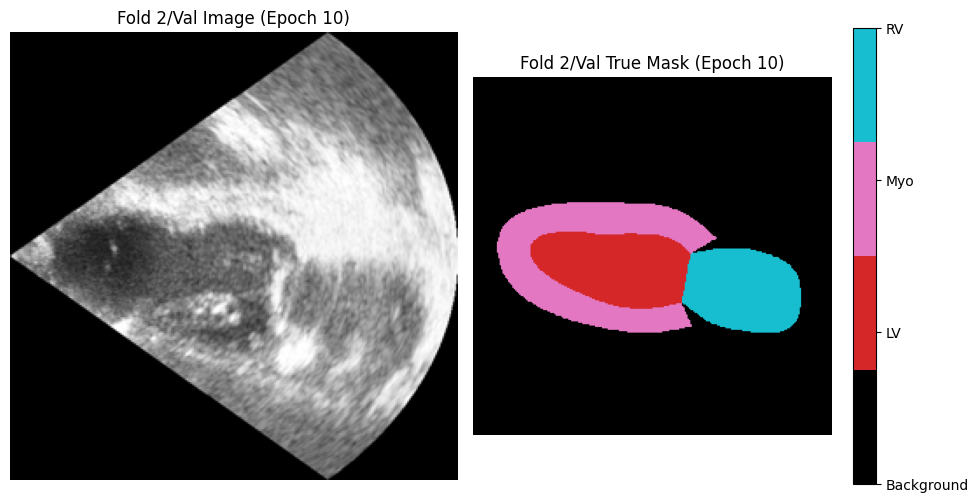

/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


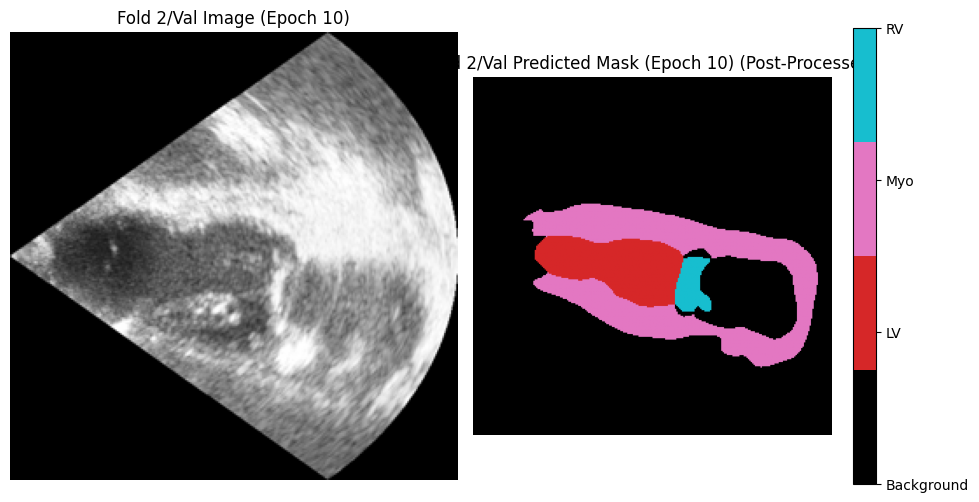

Fold 2/Epoch 10 Validation:   4%|▍         | 1/25 [00:02<01:00,  2.53s/it]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 2/Epoch 10 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]


Fold 2/Epoch 10 Validation finished. Average Val Loss: 0.5036
  Fold 2/Overall Avg Val Dice: 0.5498, Overall Avg Val IoU: 0.4251
    LV Dice: 0.7165, IoU: 0.5963
    Myo Dice: 0.5600, IoU: 0.4033
    RV Dice: 0.3731, IoU: 0.2758

Fold 2/Epoch 11/50 - Training


Fold 2/Epoch 11 Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:72: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 2/Epoch 11 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 2/Epoch 11 Training finished. Average Train Loss: 0.2412
Fold 2 - Epoch 11 - Validation


Fold 2/Epoch 11 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.45it/s]


Fold 2/Epoch 11 Validation finished. Average Val Loss: 0.5199
  Fold 2/Overall Avg Val Dice: 0.4838, Overall Avg Val IoU: 0.3680
    LV Dice: 0.7111, IoU: 0.5671
    Myo Dice: 0.5823, IoU: 0.4239
    RV Dice: 0.1579, IoU: 0.1130

Fold 2/Epoch 12/50 - Training


Fold 2/Epoch 12 Training: 100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Fold 2/Epoch 12 Training finished. Average Train Loss: 0.2270
Fold 2 - Epoch 12 - Validation


Fold 2/Epoch 12 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]


Fold 2/Epoch 12 Validation finished. Average Val Loss: 0.4189
  Fold 2/Overall Avg Val Dice: 0.6402, Overall Avg Val IoU: 0.5170
    LV Dice: 0.7346, IoU: 0.6345
    Myo Dice: 0.6530, IoU: 0.4946
    RV Dice: 0.5329, IoU: 0.4218
New best model saved! (Overall Dice: 0.6402) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_2/best_unet_temporal_fold2_model.pth

Fold 2/Epoch 13/50 - Training


Fold 2/Epoch 13 Training: 100%|██████████| 100/100 [01:07<00:00,  1.49it/s]


Fold 2/Epoch 13 Training finished. Average Train Loss: 0.2373
Fold 2 - Epoch 13 - Validation


Fold 2/Epoch 13 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.46it/s]


Fold 2/Epoch 13 Validation finished. Average Val Loss: 0.5226
  Fold 2/Overall Avg Val Dice: 0.5209, Overall Avg Val IoU: 0.4084
    LV Dice: 0.7400, IoU: 0.6195
    Myo Dice: 0.6252, IoU: 0.4684
    RV Dice: 0.1973, IoU: 0.1372

Fold 2/Epoch 14/50 - Training


Fold 2/Epoch 14 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 2/Epoch 14 Training finished. Average Train Loss: 0.2210
Fold 2 - Epoch 14 - Validation


Fold 2/Epoch 14 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]


Fold 2/Epoch 14 Validation finished. Average Val Loss: 0.3711
  Fold 2/Overall Avg Val Dice: 0.6779, Overall Avg Val IoU: 0.5620
    LV Dice: 0.7662, IoU: 0.6701
    Myo Dice: 0.6839, IoU: 0.5356
    RV Dice: 0.5836, IoU: 0.4802
New best model saved! (Overall Dice: 0.6779) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_2/best_unet_temporal_fold2_model.pth

Fold 2/Epoch 15/50 - Training


Fold 2/Epoch 15 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 2/Epoch 15 Training finished. Average Train Loss: 0.2262
Fold 2 - Epoch 15 - Validation


Fold 2/Epoch 15 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.45it/s]


Fold 2/Epoch 15 Validation finished. Average Val Loss: 0.5936
  Fold 2/Overall Avg Val Dice: 0.4679, Overall Avg Val IoU: 0.3539
    LV Dice: 0.6807, IoU: 0.5325
    Myo Dice: 0.6100, IoU: 0.4519
    RV Dice: 0.1131, IoU: 0.0772

Fold 2/Epoch 16/50 - Training


Fold 2/Epoch 16 Training: 100%|██████████| 100/100 [01:08<00:00,  1.47it/s]


Fold 2/Epoch 16 Training finished. Average Train Loss: 0.2120
Fold 2 - Epoch 16 - Validation


Fold 2/Epoch 16 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]


Fold 2/Epoch 16 Validation finished. Average Val Loss: 0.4707
  Fold 2/Overall Avg Val Dice: 0.5689, Overall Avg Val IoU: 0.4543
    LV Dice: 0.7361, IoU: 0.6203
    Myo Dice: 0.6760, IoU: 0.5254
    RV Dice: 0.2947, IoU: 0.2172

Fold 2/Epoch 17/50 - Training


Fold 2/Epoch 17 Training: 100%|██████████| 100/100 [01:08<00:00,  1.47it/s]


Fold 2/Epoch 17 Training finished. Average Train Loss: 0.2105
Fold 2 - Epoch 17 - Validation


Fold 2/Epoch 17 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.43it/s]


Fold 2/Epoch 17 Validation finished. Average Val Loss: 0.4073
  Fold 2/Overall Avg Val Dice: 0.6294, Overall Avg Val IoU: 0.5103
    LV Dice: 0.7791, IoU: 0.6701
    Myo Dice: 0.6978, IoU: 0.5495
    RV Dice: 0.4112, IoU: 0.3112

Fold 2/Epoch 18/50 - Training


Fold 2/Epoch 18 Training: 100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Fold 2/Epoch 18 Training finished. Average Train Loss: 0.2059
Fold 2 - Epoch 18 - Validation


Fold 2/Epoch 18 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]


Fold 2/Epoch 18 Validation finished. Average Val Loss: 0.4274
  Fold 2/Overall Avg Val Dice: 0.6202, Overall Avg Val IoU: 0.4982
    LV Dice: 0.7678, IoU: 0.6476
    Myo Dice: 0.6771, IoU: 0.5257
    RV Dice: 0.4156, IoU: 0.3214

Fold 2/Epoch 19/50 - Training


Fold 2/Epoch 19 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 2/Epoch 19 Training finished. Average Train Loss: 0.2001
Fold 2 - Epoch 19 - Validation


Fold 2/Epoch 19 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]


Fold 2/Epoch 19 Validation finished. Average Val Loss: 0.5121
  Fold 2/Overall Avg Val Dice: 0.5385, Overall Avg Val IoU: 0.4222
    LV Dice: 0.7268, IoU: 0.5899
    Myo Dice: 0.6819, IoU: 0.5295
    RV Dice: 0.2067, IoU: 0.1472

Fold 2/Epoch 20/50 - Training


Fold 2/Epoch 20 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 2/Epoch 20 Training finished. Average Train Loss: 0.2019
Fold 2 - Epoch 20 - Validation


Fold 2/Epoch 20 Validation:   0%|          | 0/25 [00:00<?, ?it/s]


    Fold 2/Visualizing a validation sample from Epoch 20 (True Mask vs Predicted Mask)...


/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


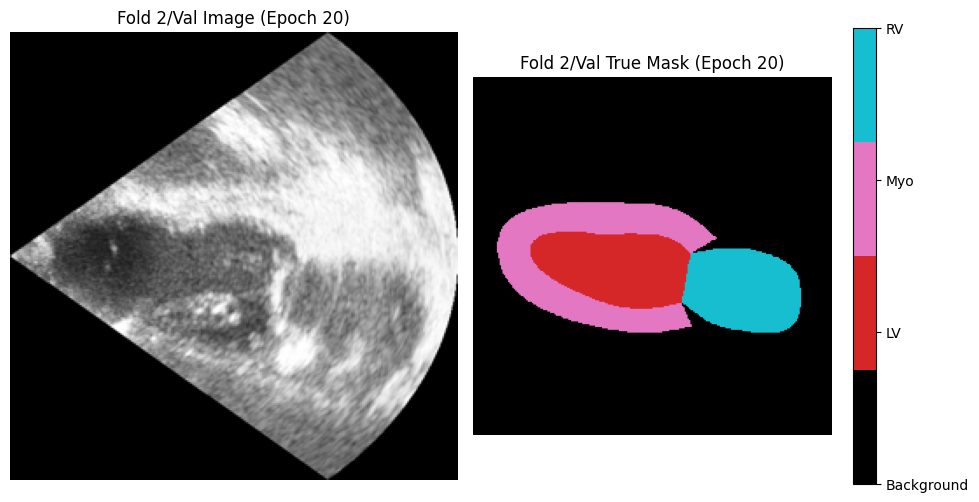

/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


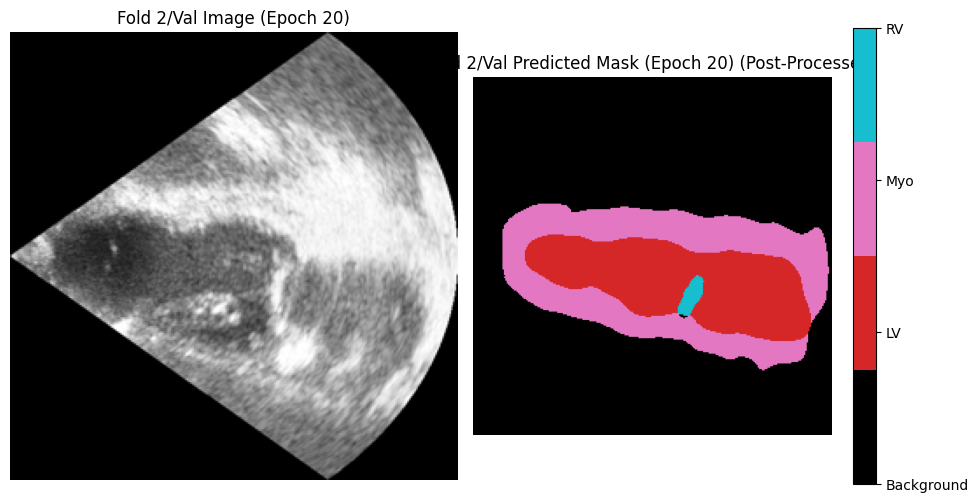

Fold 2/Epoch 20 Validation:   4%|▍         | 1/25 [00:02<01:04,  2.70s/it]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 2/Epoch 20 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]


Fold 2/Epoch 20 Validation finished. Average Val Loss: 0.4622
  Fold 2/Overall Avg Val Dice: 0.6123, Overall Avg Val IoU: 0.4915
    LV Dice: 0.7609, IoU: 0.6503
    Myo Dice: 0.6767, IoU: 0.5260
    RV Dice: 0.3992, IoU: 0.2982

Fold 2/Epoch 21/50 - Training


Fold 2/Epoch 21 Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:72: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 2/Epoch 21 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 2/Epoch 21 Training finished. Average Train Loss: 0.1728
Fold 2 - Epoch 21 - Validation


Fold 2/Epoch 21 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.45it/s]


Fold 2/Epoch 21 Validation finished. Average Val Loss: 0.4642
  Fold 2/Overall Avg Val Dice: 0.5881, Overall Avg Val IoU: 0.4681
    LV Dice: 0.7511, IoU: 0.6245
    Myo Dice: 0.6851, IoU: 0.5332
    RV Dice: 0.3282, IoU: 0.2464

Fold 2/Epoch 22/50 - Training


Fold 2/Epoch 22 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 2/Epoch 22 Training finished. Average Train Loss: 0.1739
Fold 2 - Epoch 22 - Validation


Fold 2/Epoch 22 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.46it/s]


Fold 2/Epoch 22 Validation finished. Average Val Loss: 0.4415
  Fold 2/Overall Avg Val Dice: 0.6129, Overall Avg Val IoU: 0.4958
    LV Dice: 0.7563, IoU: 0.6443
    Myo Dice: 0.7002, IoU: 0.5527
    RV Dice: 0.3822, IoU: 0.2903

Fold 2/Epoch 23/50 - Training


Fold 2/Epoch 23 Training: 100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Fold 2/Epoch 23 Training finished. Average Train Loss: 0.1699
Fold 2 - Epoch 23 - Validation


Fold 2/Epoch 23 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.46it/s]


Fold 2/Epoch 23 Validation finished. Average Val Loss: 0.4580
  Fold 2/Overall Avg Val Dice: 0.5936, Overall Avg Val IoU: 0.4770
    LV Dice: 0.7619, IoU: 0.6394
    Myo Dice: 0.6912, IoU: 0.5416
    RV Dice: 0.3276, IoU: 0.2502

Fold 2/Epoch 24/50 - Training


Fold 2/Epoch 24 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 2/Epoch 24 Training finished. Average Train Loss: 0.1671
Fold 2 - Epoch 24 - Validation


Fold 2/Epoch 24 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s]


Fold 2/Epoch 24 Validation finished. Average Val Loss: 0.4759
  Fold 2/Overall Avg Val Dice: 0.5707, Overall Avg Val IoU: 0.4537
    LV Dice: 0.7390, IoU: 0.6120
    Myo Dice: 0.6807, IoU: 0.5286
    RV Dice: 0.2925, IoU: 0.2206

Early stopping triggered after 24 epochs due to no improvement in validation Dice score for 10 epochs.

Fold 2/Training complete!

======== Starting Fold 3/5 ========
CamusTemporalDataset (Training): Initializing and scanning for sequences...
CamusTemporalDataset (Training): Found 500 valid 2CH_half_sequence samples.
CamusTemporalDataset (Validation/Test): Initializing and scanning for sequences...


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/tmp/ipython-input-15-1634110382.py:94: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = amp.GradScaler()


CamusTemporalDataset (Validation/Test): Found 500 valid 2CH_half_sequence samples.
Fold 3: Training DataLoader has 100 batches (400 samples).
Fold 3: Validation DataLoader has 25 batches (100 samples).
Checkpoints for Fold 3 will be saved to: /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_3

--- Fold 3/Starting Training and Validation Loop ---
Starting training for 50 epochs (actual epochs may vary due to early stopping criteria)...

Fold 3/Epoch 1/50 - Training


Fold 3/Epoch 1 Training: 100%|██████████| 100/100 [01:08<00:00,  1.47it/s]


Fold 3/Epoch 1 Training finished. Average Train Loss: 0.7952
Fold 3 - Epoch 1 - Validation


Fold 3/Epoch 1 Validation:   0%|          | 0/25 [00:00<?, ?it/s]


    Fold 3/Visualizing a validation sample from Epoch 1 (True Mask vs Predicted Mask)...


/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


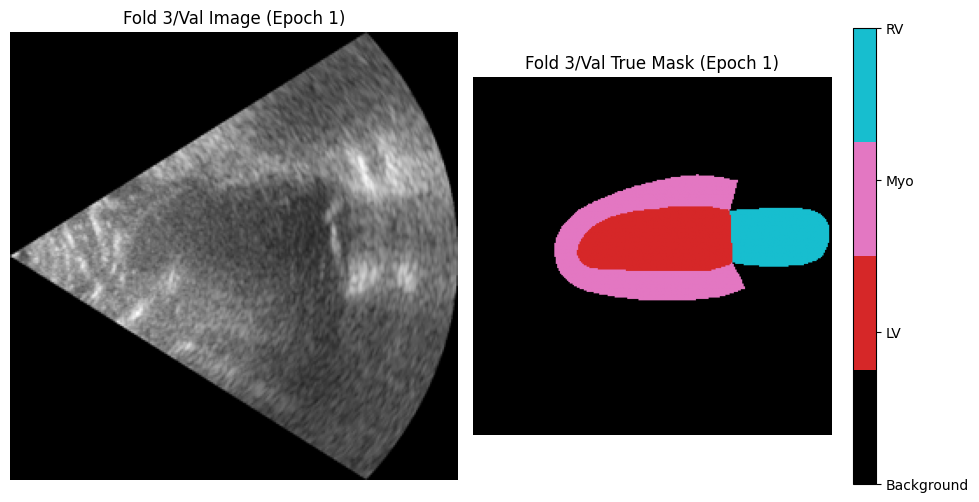

/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


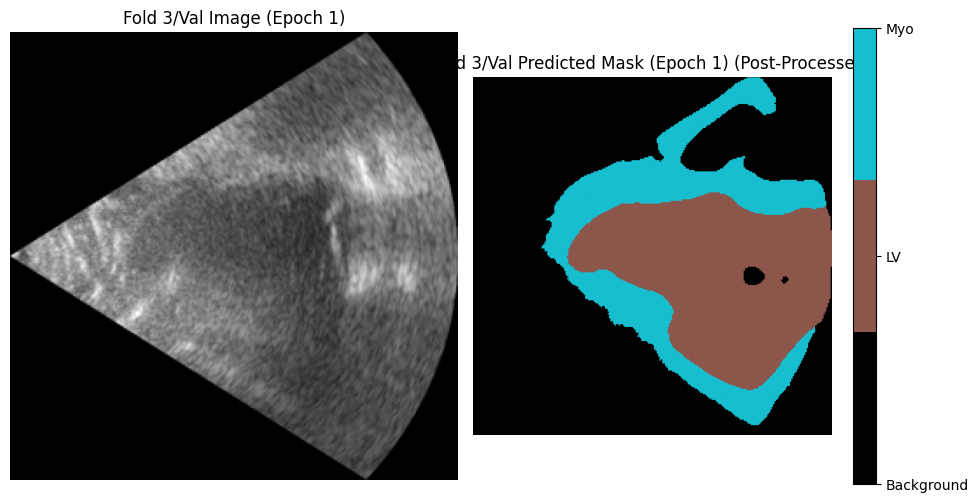

Fold 3/Epoch 1 Validation:   4%|▍         | 1/25 [00:02<01:10,  2.95s/it]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 3/Epoch 1 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]


Fold 3/Epoch 1 Validation finished. Average Val Loss: 0.8762
  Fold 3/Overall Avg Val Dice: 0.3263, Overall Avg Val IoU: 0.2259
    LV Dice: 0.4685, IoU: 0.3259
    Myo Dice: 0.5105, IoU: 0.3517
    RV Dice: 0.0000, IoU: 0.0000
New best model saved! (Overall Dice: 0.3263) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_3/best_unet_temporal_fold3_model.pth

Fold 3/Epoch 2/50 - Training


Fold 3/Epoch 2 Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:72: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 3/Epoch 2 Training: 100%|██████████| 100/100 [01:08<00:00,  1.45it/s]


Fold 3/Epoch 2 Training finished. Average Train Loss: 0.5225
Fold 3 - Epoch 2 - Validation


Fold 3/Epoch 2 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]


Fold 3/Epoch 2 Validation finished. Average Val Loss: 0.6279
  Fold 3/Overall Avg Val Dice: 0.5135, Overall Avg Val IoU: 0.3885
    LV Dice: 0.6239, IoU: 0.5002
    Myo Dice: 0.5390, IoU: 0.3846
    RV Dice: 0.3777, IoU: 0.2807
New best model saved! (Overall Dice: 0.5135) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_3/best_unet_temporal_fold3_model.pth

Fold 3/Epoch 3/50 - Training


Fold 3/Epoch 3 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 3/Epoch 3 Training finished. Average Train Loss: 0.3964
Fold 3 - Epoch 3 - Validation


Fold 3/Epoch 3 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]


Fold 3/Epoch 3 Validation finished. Average Val Loss: 0.7303
  Fold 3/Overall Avg Val Dice: 0.3784, Overall Avg Val IoU: 0.2748
    LV Dice: 0.6060, IoU: 0.4570
    Myo Dice: 0.5148, IoU: 0.3583
    RV Dice: 0.0143, IoU: 0.0092

Fold 3/Epoch 4/50 - Training


Fold 3/Epoch 4 Training: 100%|██████████| 100/100 [01:08<00:00,  1.45it/s]


Fold 3/Epoch 4 Training finished. Average Train Loss: 0.3532
Fold 3 - Epoch 4 - Validation


Fold 3/Epoch 4 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]


Fold 3/Epoch 4 Validation finished. Average Val Loss: 0.4772
  Fold 3/Overall Avg Val Dice: 0.6016, Overall Avg Val IoU: 0.4767
    LV Dice: 0.7339, IoU: 0.6256
    Myo Dice: 0.5937, IoU: 0.4363
    RV Dice: 0.4772, IoU: 0.3683
New best model saved! (Overall Dice: 0.6016) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_3/best_unet_temporal_fold3_model.pth

Fold 3/Epoch 5/50 - Training


Fold 3/Epoch 5 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 3/Epoch 5 Training finished. Average Train Loss: 0.3113
Fold 3 - Epoch 5 - Validation


Fold 3/Epoch 5 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]


Fold 3/Epoch 5 Validation finished. Average Val Loss: 0.4664
  Fold 3/Overall Avg Val Dice: 0.5586, Overall Avg Val IoU: 0.4390
    LV Dice: 0.7075, IoU: 0.5969
    Myo Dice: 0.5247, IoU: 0.3830
    RV Dice: 0.4437, IoU: 0.3372

Fold 3/Epoch 6/50 - Training


Fold 3/Epoch 6 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 3/Epoch 6 Training finished. Average Train Loss: 0.2910
Fold 3 - Epoch 6 - Validation


Fold 3/Epoch 6 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]


Fold 3/Epoch 6 Validation finished. Average Val Loss: 0.5632
  Fold 3/Overall Avg Val Dice: 0.5502, Overall Avg Val IoU: 0.4301
    LV Dice: 0.6805, IoU: 0.5687
    Myo Dice: 0.6345, IoU: 0.4756
    RV Dice: 0.3357, IoU: 0.2461

Fold 3/Epoch 7/50 - Training


Fold 3/Epoch 7 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 3/Epoch 7 Training finished. Average Train Loss: 0.2657
Fold 3 - Epoch 7 - Validation


Fold 3/Epoch 7 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]


Fold 3/Epoch 7 Validation finished. Average Val Loss: 0.4648
  Fold 3/Overall Avg Val Dice: 0.6613, Overall Avg Val IoU: 0.5386
    LV Dice: 0.7383, IoU: 0.6477
    Myo Dice: 0.6585, IoU: 0.5026
    RV Dice: 0.5872, IoU: 0.4654
New best model saved! (Overall Dice: 0.6613) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_3/best_unet_temporal_fold3_model.pth

Fold 3/Epoch 8/50 - Training


Fold 3/Epoch 8 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 3/Epoch 8 Training finished. Average Train Loss: 0.2477
Fold 3 - Epoch 8 - Validation


Fold 3/Epoch 8 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]


Fold 3/Epoch 8 Validation finished. Average Val Loss: 0.4239
  Fold 3/Overall Avg Val Dice: 0.6972, Overall Avg Val IoU: 0.5764
    LV Dice: 0.7700, IoU: 0.6776
    Myo Dice: 0.6740, IoU: 0.5199
    RV Dice: 0.6476, IoU: 0.5316
New best model saved! (Overall Dice: 0.6972) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_3/best_unet_temporal_fold3_model.pth

Fold 3/Epoch 9/50 - Training


Fold 3/Epoch 9 Training: 100%|██████████| 100/100 [01:10<00:00,  1.42it/s]


Fold 3/Epoch 9 Training finished. Average Train Loss: 0.2501
Fold 3 - Epoch 9 - Validation


Fold 3/Epoch 9 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]


Fold 3/Epoch 9 Validation finished. Average Val Loss: 0.3523
  Fold 3/Overall Avg Val Dice: 0.7256, Overall Avg Val IoU: 0.6072
    LV Dice: 0.7985, IoU: 0.7130
    Myo Dice: 0.6667, IoU: 0.5151
    RV Dice: 0.7116, IoU: 0.5934
New best model saved! (Overall Dice: 0.7256) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_3/best_unet_temporal_fold3_model.pth

Fold 3/Epoch 10/50 - Training


Fold 3/Epoch 10 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 3/Epoch 10 Training finished. Average Train Loss: 0.2379
Fold 3 - Epoch 10 - Validation


Fold 3/Epoch 10 Validation:   0%|          | 0/25 [00:00<?, ?it/s]


    Fold 3/Visualizing a validation sample from Epoch 10 (True Mask vs Predicted Mask)...


/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


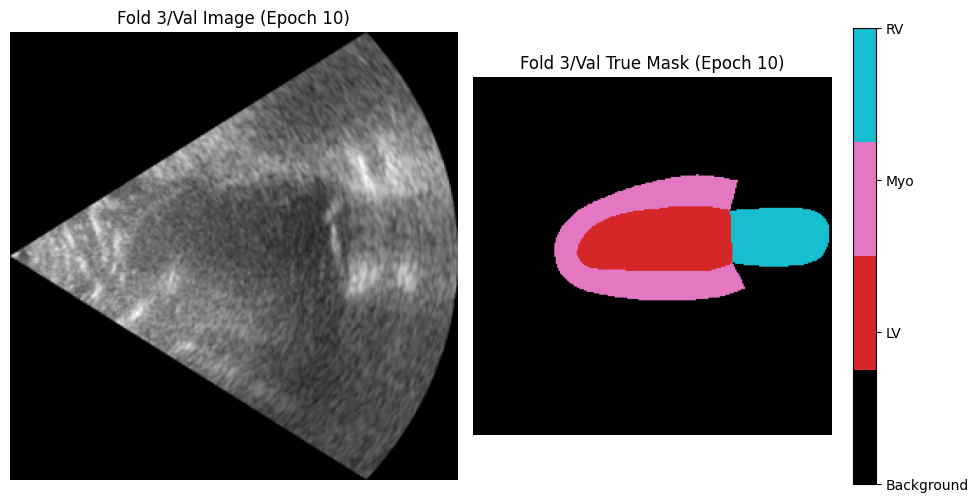

/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


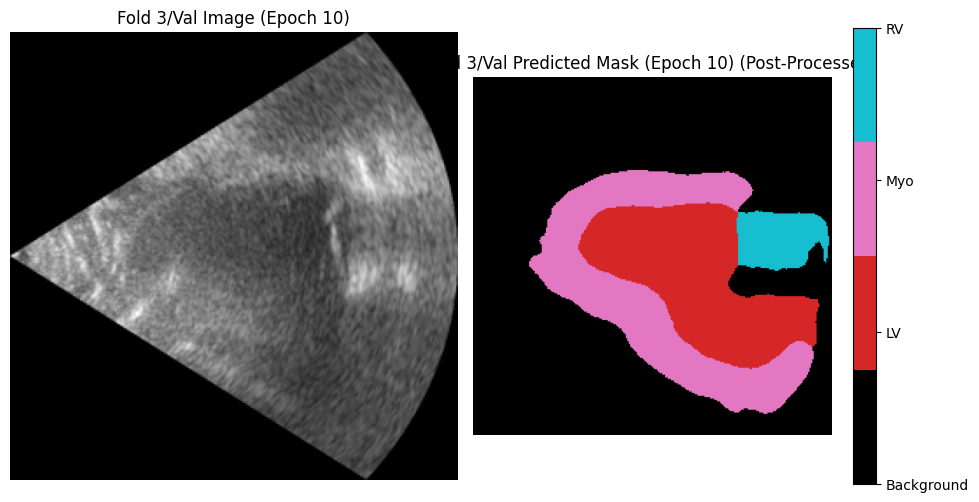

Fold 3/Epoch 10 Validation:   4%|▍         | 1/25 [00:02<01:10,  2.94s/it]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 3/Epoch 10 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]


Fold 3/Epoch 10 Validation finished. Average Val Loss: 0.3958
  Fold 3/Overall Avg Val Dice: 0.6913, Overall Avg Val IoU: 0.5699
    LV Dice: 0.7555, IoU: 0.6652
    Myo Dice: 0.6696, IoU: 0.5184
    RV Dice: 0.6488, IoU: 0.5261

Fold 3/Epoch 11/50 - Training


Fold 3/Epoch 11 Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:72: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 3/Epoch 11 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 3/Epoch 11 Training finished. Average Train Loss: 0.2222
Fold 3 - Epoch 11 - Validation


Fold 3/Epoch 11 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]


Fold 3/Epoch 11 Validation finished. Average Val Loss: 0.3050
  Fold 3/Overall Avg Val Dice: 0.7494, Overall Avg Val IoU: 0.6240
    LV Dice: 0.8094, IoU: 0.7072
    Myo Dice: 0.7079, IoU: 0.5616
    RV Dice: 0.7308, IoU: 0.6032
New best model saved! (Overall Dice: 0.7494) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_3/best_unet_temporal_fold3_model.pth

Fold 3/Epoch 12/50 - Training


Fold 3/Epoch 12 Training: 100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Fold 3/Epoch 12 Training finished. Average Train Loss: 0.2254
Fold 3 - Epoch 12 - Validation


Fold 3/Epoch 12 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]


Fold 3/Epoch 12 Validation finished. Average Val Loss: 0.3787
  Fold 3/Overall Avg Val Dice: 0.6939, Overall Avg Val IoU: 0.5676
    LV Dice: 0.7915, IoU: 0.6919
    Myo Dice: 0.6515, IoU: 0.4976
    RV Dice: 0.6386, IoU: 0.5135

Fold 3/Epoch 13/50 - Training


Fold 3/Epoch 13 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 3/Epoch 13 Training finished. Average Train Loss: 0.2212
Fold 3 - Epoch 13 - Validation


Fold 3/Epoch 13 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]


Fold 3/Epoch 13 Validation finished. Average Val Loss: 0.3259
  Fold 3/Overall Avg Val Dice: 0.7481, Overall Avg Val IoU: 0.6353
    LV Dice: 0.8301, IoU: 0.7417
    Myo Dice: 0.7210, IoU: 0.5782
    RV Dice: 0.6932, IoU: 0.5859

Fold 3/Epoch 14/50 - Training


Fold 3/Epoch 14 Training: 100%|██████████| 100/100 [01:08<00:00,  1.47it/s]


Fold 3/Epoch 14 Training finished. Average Train Loss: 0.2043
Fold 3 - Epoch 14 - Validation


Fold 3/Epoch 14 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]


Fold 3/Epoch 14 Validation finished. Average Val Loss: 0.3329
  Fold 3/Overall Avg Val Dice: 0.7240, Overall Avg Val IoU: 0.6136
    LV Dice: 0.8236, IoU: 0.7411
    Myo Dice: 0.7402, IoU: 0.6011
    RV Dice: 0.6082, IoU: 0.4986

Fold 3/Epoch 15/50 - Training


Fold 3/Epoch 15 Training: 100%|██████████| 100/100 [01:07<00:00,  1.49it/s]


Fold 3/Epoch 15 Training finished. Average Train Loss: 0.1985
Fold 3 - Epoch 15 - Validation


Fold 3/Epoch 15 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]


Fold 3/Epoch 15 Validation finished. Average Val Loss: 0.3323
  Fold 3/Overall Avg Val Dice: 0.7577, Overall Avg Val IoU: 0.6437
    LV Dice: 0.8200, IoU: 0.7395
    Myo Dice: 0.7368, IoU: 0.5942
    RV Dice: 0.7163, IoU: 0.5973
New best model saved! (Overall Dice: 0.7577) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_3/best_unet_temporal_fold3_model.pth

Fold 3/Epoch 16/50 - Training


Fold 3/Epoch 16 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 3/Epoch 16 Training finished. Average Train Loss: 0.1916
Fold 3 - Epoch 16 - Validation


Fold 3/Epoch 16 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]


Fold 3/Epoch 16 Validation finished. Average Val Loss: 0.3471
  Fold 3/Overall Avg Val Dice: 0.7389, Overall Avg Val IoU: 0.6237
    LV Dice: 0.8193, IoU: 0.7318
    Myo Dice: 0.7278, IoU: 0.5823
    RV Dice: 0.6698, IoU: 0.5571

Fold 3/Epoch 17/50 - Training


Fold 3/Epoch 17 Training: 100%|██████████| 100/100 [01:09<00:00,  1.43it/s]


Fold 3/Epoch 17 Training finished. Average Train Loss: 0.1860
Fold 3 - Epoch 17 - Validation


Fold 3/Epoch 17 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.39it/s]


Fold 3/Epoch 17 Validation finished. Average Val Loss: 0.2672
  Fold 3/Overall Avg Val Dice: 0.7850, Overall Avg Val IoU: 0.6732
    LV Dice: 0.8527, IoU: 0.7652
    Myo Dice: 0.7619, IoU: 0.6271
    RV Dice: 0.7403, IoU: 0.6272
New best model saved! (Overall Dice: 0.7850) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_3/best_unet_temporal_fold3_model.pth

Fold 3/Epoch 18/50 - Training


Fold 3/Epoch 18 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 3/Epoch 18 Training finished. Average Train Loss: 0.1909
Fold 3 - Epoch 18 - Validation


Fold 3/Epoch 18 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]


Fold 3/Epoch 18 Validation finished. Average Val Loss: 0.2771
  Fold 3/Overall Avg Val Dice: 0.7645, Overall Avg Val IoU: 0.6527
    LV Dice: 0.8468, IoU: 0.7553
    Myo Dice: 0.7342, IoU: 0.5951
    RV Dice: 0.7126, IoU: 0.6078

Fold 3/Epoch 19/50 - Training


Fold 3/Epoch 19 Training: 100%|██████████| 100/100 [01:09<00:00,  1.43it/s]


Fold 3/Epoch 19 Training finished. Average Train Loss: 0.1891
Fold 3 - Epoch 19 - Validation


Fold 3/Epoch 19 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]


Fold 3/Epoch 19 Validation finished. Average Val Loss: 0.2761
  Fold 3/Overall Avg Val Dice: 0.7836, Overall Avg Val IoU: 0.6779
    LV Dice: 0.8559, IoU: 0.7714
    Myo Dice: 0.7372, IoU: 0.6046
    RV Dice: 0.7577, IoU: 0.6576

Fold 3/Epoch 20/50 - Training


Fold 3/Epoch 20 Training: 100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Fold 3/Epoch 20 Training finished. Average Train Loss: 0.1781
Fold 3 - Epoch 20 - Validation


Fold 3/Epoch 20 Validation:   0%|          | 0/25 [00:00<?, ?it/s]


    Fold 3/Visualizing a validation sample from Epoch 20 (True Mask vs Predicted Mask)...


/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


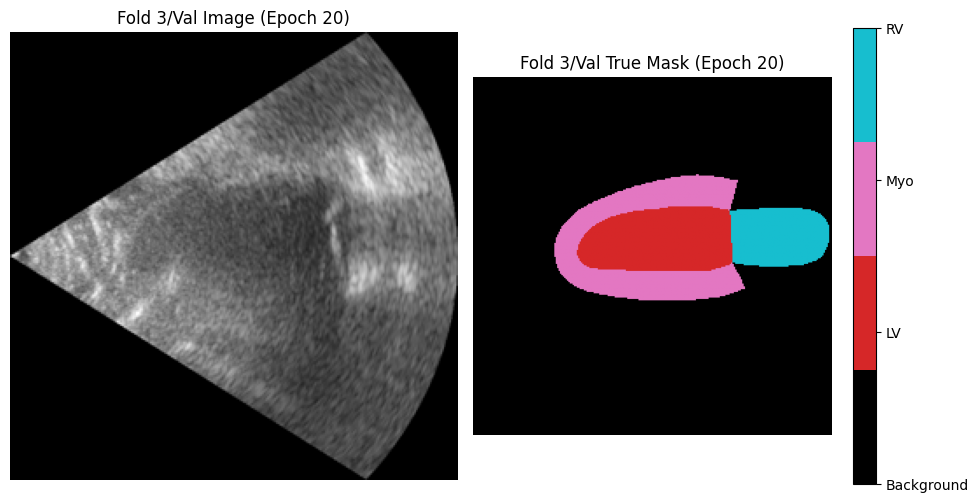

/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


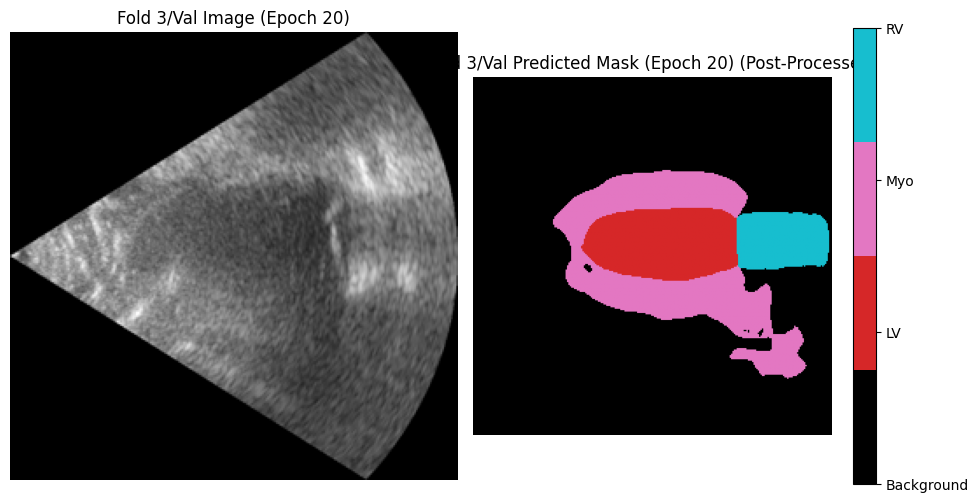

Fold 3/Epoch 20 Validation:   4%|▍         | 1/25 [00:02<01:09,  2.90s/it]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 3/Epoch 20 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]


Fold 3/Epoch 20 Validation finished. Average Val Loss: 0.2415
  Fold 3/Overall Avg Val Dice: 0.8042, Overall Avg Val IoU: 0.7003
    LV Dice: 0.8765, IoU: 0.7978
    Myo Dice: 0.7795, IoU: 0.6528
    RV Dice: 0.7567, IoU: 0.6503
New best model saved! (Overall Dice: 0.8042) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_3/best_unet_temporal_fold3_model.pth

Fold 3/Epoch 21/50 - Training


Fold 3/Epoch 21 Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:72: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 3/Epoch 21 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 3/Epoch 21 Training finished. Average Train Loss: 0.1790
Fold 3 - Epoch 21 - Validation


Fold 3/Epoch 21 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.39it/s]


Fold 3/Epoch 21 Validation finished. Average Val Loss: 0.2858
  Fold 3/Overall Avg Val Dice: 0.7888, Overall Avg Val IoU: 0.6837
    LV Dice: 0.8582, IoU: 0.7785
    Myo Dice: 0.7916, IoU: 0.6654
    RV Dice: 0.7166, IoU: 0.6071

Fold 3/Epoch 22/50 - Training


Fold 3/Epoch 22 Training: 100%|██████████| 100/100 [01:08<00:00,  1.47it/s]


Fold 3/Epoch 22 Training finished. Average Train Loss: 0.1756
Fold 3 - Epoch 22 - Validation


Fold 3/Epoch 22 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]


Fold 3/Epoch 22 Validation finished. Average Val Loss: 0.2629
  Fold 3/Overall Avg Val Dice: 0.7777, Overall Avg Val IoU: 0.6690
    LV Dice: 0.8580, IoU: 0.7715
    Myo Dice: 0.7384, IoU: 0.6012
    RV Dice: 0.7367, IoU: 0.6342

Fold 3/Epoch 23/50 - Training


Fold 3/Epoch 23 Training: 100%|██████████| 100/100 [01:09<00:00,  1.43it/s]


Fold 3/Epoch 23 Training finished. Average Train Loss: 0.1832
Fold 3 - Epoch 23 - Validation


Fold 3/Epoch 23 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.39it/s]


Fold 3/Epoch 23 Validation finished. Average Val Loss: 0.2605
  Fold 3/Overall Avg Val Dice: 0.7929, Overall Avg Val IoU: 0.6907
    LV Dice: 0.8560, IoU: 0.7783
    Myo Dice: 0.7919, IoU: 0.6682
    RV Dice: 0.7308, IoU: 0.6256

Fold 3/Epoch 24/50 - Training


Fold 3/Epoch 24 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 3/Epoch 24 Training finished. Average Train Loss: 0.1791
Fold 3 - Epoch 24 - Validation


Fold 3/Epoch 24 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.39it/s]


Fold 3/Epoch 24 Validation finished. Average Val Loss: 0.3021
  Fold 3/Overall Avg Val Dice: 0.7464, Overall Avg Val IoU: 0.6339
    LV Dice: 0.8405, IoU: 0.7503
    Myo Dice: 0.7317, IoU: 0.5903
    RV Dice: 0.6671, IoU: 0.5613

Fold 3/Epoch 25/50 - Training


Fold 3/Epoch 25 Training: 100%|██████████| 100/100 [01:09<00:00,  1.45it/s]


Fold 3/Epoch 25 Training finished. Average Train Loss: 0.1797
Fold 3 - Epoch 25 - Validation


Fold 3/Epoch 25 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]


Fold 3/Epoch 25 Validation finished. Average Val Loss: 0.3186
  Fold 3/Overall Avg Val Dice: 0.7437, Overall Avg Val IoU: 0.6362
    LV Dice: 0.8290, IoU: 0.7468
    Myo Dice: 0.7604, IoU: 0.6312
    RV Dice: 0.6416, IoU: 0.5306

Fold 3/Epoch 26/50 - Training


Fold 3/Epoch 26 Training: 100%|██████████| 100/100 [01:09<00:00,  1.43it/s]


Fold 3/Epoch 26 Training finished. Average Train Loss: 0.1752
Fold 3 - Epoch 26 - Validation


Fold 3/Epoch 26 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]


Fold 3/Epoch 26 Validation finished. Average Val Loss: 0.2939
  Fold 3/Overall Avg Val Dice: 0.7744, Overall Avg Val IoU: 0.6620
    LV Dice: 0.8462, IoU: 0.7603
    Myo Dice: 0.7397, IoU: 0.6039
    RV Dice: 0.7374, IoU: 0.6217

Fold 3/Epoch 27/50 - Training


Fold 3/Epoch 27 Training: 100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Fold 3/Epoch 27 Training finished. Average Train Loss: 0.1612
Fold 3 - Epoch 27 - Validation


Fold 3/Epoch 27 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]


Fold 3/Epoch 27 Validation finished. Average Val Loss: 0.2423
  Fold 3/Overall Avg Val Dice: 0.8060, Overall Avg Val IoU: 0.6999
    LV Dice: 0.8776, IoU: 0.7986
    Myo Dice: 0.7856, IoU: 0.6600
    RV Dice: 0.7547, IoU: 0.6412
New best model saved! (Overall Dice: 0.8060) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_3/best_unet_temporal_fold3_model.pth

Fold 3/Epoch 28/50 - Training


Fold 3/Epoch 28 Training: 100%|██████████| 100/100 [01:10<00:00,  1.41it/s]


Fold 3/Epoch 28 Training finished. Average Train Loss: 0.1505
Fold 3 - Epoch 28 - Validation


Fold 3/Epoch 28 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]


Fold 3/Epoch 28 Validation finished. Average Val Loss: 0.2602
  Fold 3/Overall Avg Val Dice: 0.7793, Overall Avg Val IoU: 0.6723
    LV Dice: 0.8569, IoU: 0.7720
    Myo Dice: 0.7770, IoU: 0.6496
    RV Dice: 0.7040, IoU: 0.5953

Fold 3/Epoch 29/50 - Training


Fold 3/Epoch 29 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 3/Epoch 29 Training finished. Average Train Loss: 0.1473
Fold 3 - Epoch 29 - Validation


Fold 3/Epoch 29 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]


Fold 3/Epoch 29 Validation finished. Average Val Loss: 0.2489
  Fold 3/Overall Avg Val Dice: 0.7823, Overall Avg Val IoU: 0.6779
    LV Dice: 0.8683, IoU: 0.7877
    Myo Dice: 0.7774, IoU: 0.6516
    RV Dice: 0.7011, IoU: 0.5943

Fold 3/Epoch 30/50 - Training


Fold 3/Epoch 30 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 3/Epoch 30 Training finished. Average Train Loss: 0.1473
Fold 3 - Epoch 30 - Validation


Fold 3/Epoch 30 Validation:   0%|          | 0/25 [00:00<?, ?it/s]


    Fold 3/Visualizing a validation sample from Epoch 30 (True Mask vs Predicted Mask)...


/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


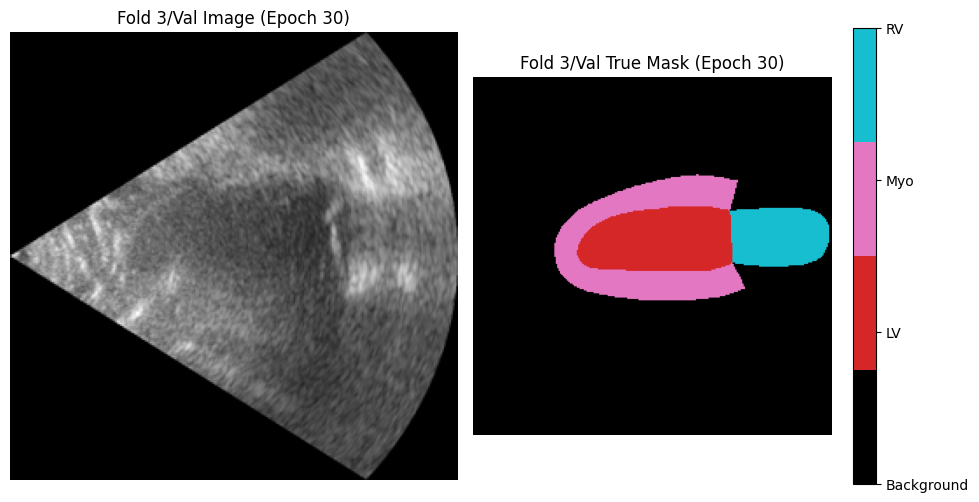

/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


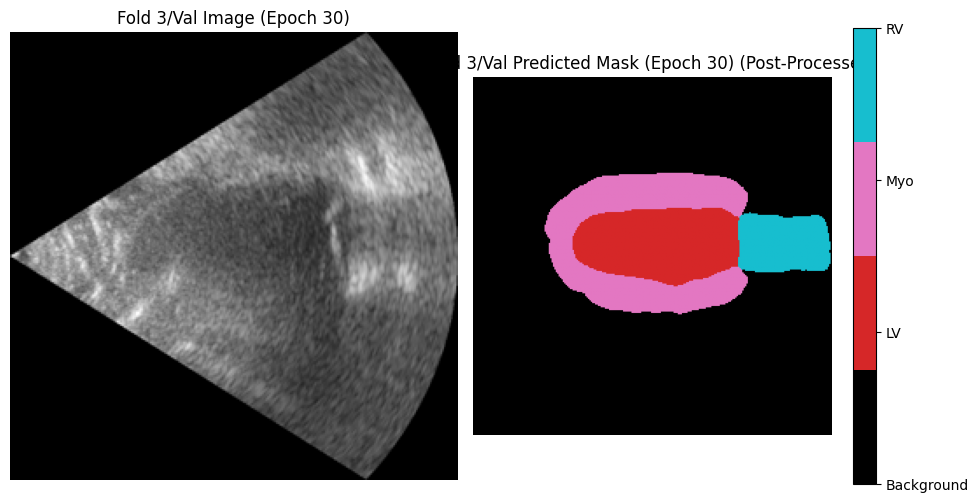

Fold 3/Epoch 30 Validation:   4%|▍         | 1/25 [00:02<01:10,  2.93s/it]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 3/Epoch 30 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]


Fold 3/Epoch 30 Validation finished. Average Val Loss: 0.2336
  Fold 3/Overall Avg Val Dice: 0.8082, Overall Avg Val IoU: 0.7042
    LV Dice: 0.8800, IoU: 0.8043
    Myo Dice: 0.7902, IoU: 0.6669
    RV Dice: 0.7543, IoU: 0.6412
New best model saved! (Overall Dice: 0.8082) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_3/best_unet_temporal_fold3_model.pth

Fold 3/Epoch 31/50 - Training


Fold 3/Epoch 31 Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:72: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 3/Epoch 31 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 3/Epoch 31 Training finished. Average Train Loss: 0.1492
Fold 3 - Epoch 31 - Validation


Fold 3/Epoch 31 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.42it/s]


Fold 3/Epoch 31 Validation finished. Average Val Loss: 0.2568
  Fold 3/Overall Avg Val Dice: 0.7886, Overall Avg Val IoU: 0.6840
    LV Dice: 0.8700, IoU: 0.7878
    Myo Dice: 0.7871, IoU: 0.6626
    RV Dice: 0.7087, IoU: 0.6015

Fold 3/Epoch 32/50 - Training


Fold 3/Epoch 32 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 3/Epoch 32 Training finished. Average Train Loss: 0.1504
Fold 3 - Epoch 32 - Validation


Fold 3/Epoch 32 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]


Fold 3/Epoch 32 Validation finished. Average Val Loss: 0.2219
  Fold 3/Overall Avg Val Dice: 0.8172, Overall Avg Val IoU: 0.7149
    LV Dice: 0.8711, IoU: 0.7955
    Myo Dice: 0.7914, IoU: 0.6682
    RV Dice: 0.7891, IoU: 0.6810
New best model saved! (Overall Dice: 0.8172) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_3/best_unet_temporal_fold3_model.pth

Fold 3/Epoch 33/50 - Training


Fold 3/Epoch 33 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 3/Epoch 33 Training finished. Average Train Loss: 0.1440
Fold 3 - Epoch 33 - Validation


Fold 3/Epoch 33 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.39it/s]


Fold 3/Epoch 33 Validation finished. Average Val Loss: 0.2074
  Fold 3/Overall Avg Val Dice: 0.8226, Overall Avg Val IoU: 0.7210
    LV Dice: 0.8846, IoU: 0.8077
    Myo Dice: 0.7945, IoU: 0.6728
    RV Dice: 0.7887, IoU: 0.6826
New best model saved! (Overall Dice: 0.8226) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_3/best_unet_temporal_fold3_model.pth

Fold 3/Epoch 34/50 - Training


Fold 3/Epoch 34 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 3/Epoch 34 Training finished. Average Train Loss: 0.1416
Fold 3 - Epoch 34 - Validation


Fold 3/Epoch 34 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]


Fold 3/Epoch 34 Validation finished. Average Val Loss: 0.2184
  Fold 3/Overall Avg Val Dice: 0.8203, Overall Avg Val IoU: 0.7172
    LV Dice: 0.8805, IoU: 0.8020
    Myo Dice: 0.8001, IoU: 0.6789
    RV Dice: 0.7804, IoU: 0.6707

Fold 3/Epoch 35/50 - Training


Fold 3/Epoch 35 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 3/Epoch 35 Training finished. Average Train Loss: 0.1427
Fold 3 - Epoch 35 - Validation


Fold 3/Epoch 35 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.39it/s]


Fold 3/Epoch 35 Validation finished. Average Val Loss: 0.2449
  Fold 3/Overall Avg Val Dice: 0.7895, Overall Avg Val IoU: 0.6853
    LV Dice: 0.8691, IoU: 0.7872
    Myo Dice: 0.7979, IoU: 0.6754
    RV Dice: 0.7016, IoU: 0.5934

Fold 3/Epoch 36/50 - Training


Fold 3/Epoch 36 Training: 100%|██████████| 100/100 [01:08<00:00,  1.45it/s]


Fold 3/Epoch 36 Training finished. Average Train Loss: 0.1417
Fold 3 - Epoch 36 - Validation


Fold 3/Epoch 36 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.42it/s]


Fold 3/Epoch 36 Validation finished. Average Val Loss: 0.2108
  Fold 3/Overall Avg Val Dice: 0.8246, Overall Avg Val IoU: 0.7216
    LV Dice: 0.8772, IoU: 0.8023
    Myo Dice: 0.8066, IoU: 0.6867
    RV Dice: 0.7899, IoU: 0.6757
New best model saved! (Overall Dice: 0.8246) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_3/best_unet_temporal_fold3_model.pth

Fold 3/Epoch 37/50 - Training


Fold 3/Epoch 37 Training: 100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Fold 3/Epoch 37 Training finished. Average Train Loss: 0.1399
Fold 3 - Epoch 37 - Validation


Fold 3/Epoch 37 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]


Fold 3/Epoch 37 Validation finished. Average Val Loss: 0.2070
  Fold 3/Overall Avg Val Dice: 0.8269, Overall Avg Val IoU: 0.7253
    LV Dice: 0.8811, IoU: 0.8065
    Myo Dice: 0.8052, IoU: 0.6856
    RV Dice: 0.7943, IoU: 0.6838
New best model saved! (Overall Dice: 0.8269) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_3/best_unet_temporal_fold3_model.pth

Fold 3/Epoch 38/50 - Training


Fold 3/Epoch 38 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 3/Epoch 38 Training finished. Average Train Loss: 0.1387
Fold 3 - Epoch 38 - Validation


Fold 3/Epoch 38 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.42it/s]


Fold 3/Epoch 38 Validation finished. Average Val Loss: 0.2027
  Fold 3/Overall Avg Val Dice: 0.8267, Overall Avg Val IoU: 0.7252
    LV Dice: 0.8785, IoU: 0.8051
    Myo Dice: 0.8054, IoU: 0.6861
    RV Dice: 0.7961, IoU: 0.6843

Fold 3/Epoch 39/50 - Training


Fold 3/Epoch 39 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 3/Epoch 39 Training finished. Average Train Loss: 0.1355
Fold 3 - Epoch 39 - Validation


Fold 3/Epoch 39 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]


Fold 3/Epoch 39 Validation finished. Average Val Loss: 0.2198
  Fold 3/Overall Avg Val Dice: 0.8090, Overall Avg Val IoU: 0.7038
    LV Dice: 0.8750, IoU: 0.7962
    Myo Dice: 0.7913, IoU: 0.6689
    RV Dice: 0.7606, IoU: 0.6462

Fold 3/Epoch 40/50 - Training


Fold 3/Epoch 40 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 3/Epoch 40 Training finished. Average Train Loss: 0.1360
Fold 3 - Epoch 40 - Validation


Fold 3/Epoch 40 Validation:   0%|          | 0/25 [00:00<?, ?it/s]


    Fold 3/Visualizing a validation sample from Epoch 40 (True Mask vs Predicted Mask)...


/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


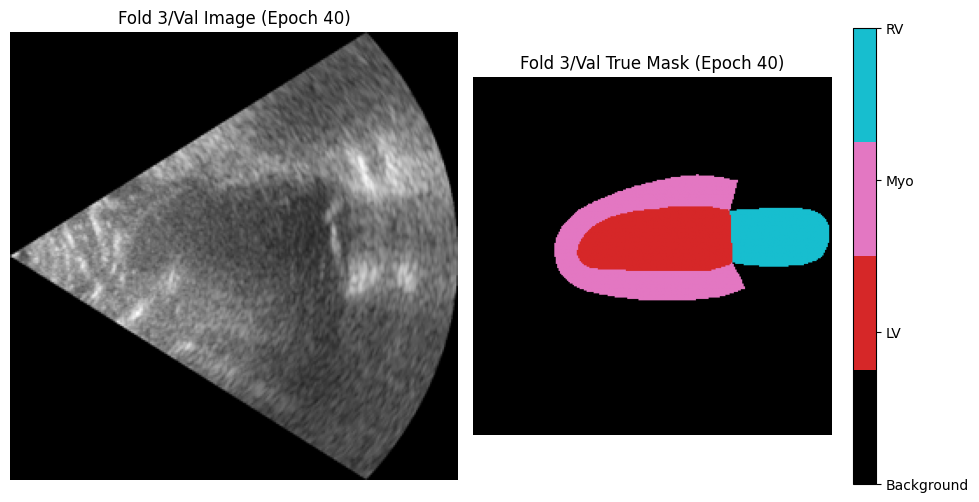

/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


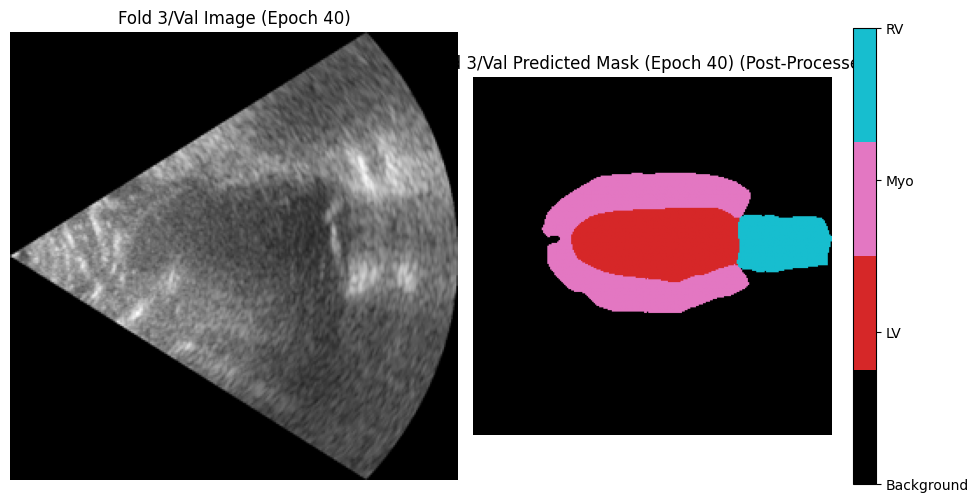

Fold 3/Epoch 40 Validation:   4%|▍         | 1/25 [00:03<01:20,  3.33s/it]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 3/Epoch 40 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.39it/s]


Fold 3/Epoch 40 Validation finished. Average Val Loss: 0.2115
  Fold 3/Overall Avg Val Dice: 0.8197, Overall Avg Val IoU: 0.7168
    LV Dice: 0.8768, IoU: 0.7982
    Myo Dice: 0.8033, IoU: 0.6838
    RV Dice: 0.7790, IoU: 0.6684

Fold 3/Epoch 41/50 - Training


Fold 3/Epoch 41 Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:72: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 3/Epoch 41 Training: 100%|██████████| 100/100 [01:09<00:00,  1.43it/s]


Fold 3/Epoch 41 Training finished. Average Train Loss: 0.1394
Fold 3 - Epoch 41 - Validation


Fold 3/Epoch 41 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]


Fold 3/Epoch 41 Validation finished. Average Val Loss: 0.2155
  Fold 3/Overall Avg Val Dice: 0.8142, Overall Avg Val IoU: 0.7109
    LV Dice: 0.8770, IoU: 0.7990
    Myo Dice: 0.8002, IoU: 0.6805
    RV Dice: 0.7655, IoU: 0.6530

Fold 3/Epoch 42/50 - Training


Fold 3/Epoch 42 Training: 100%|██████████| 100/100 [01:10<00:00,  1.41it/s]


Fold 3/Epoch 42 Training finished. Average Train Loss: 0.1413
Fold 3 - Epoch 42 - Validation


Fold 3/Epoch 42 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.42it/s]


Fold 3/Epoch 42 Validation finished. Average Val Loss: 0.2178
  Fold 3/Overall Avg Val Dice: 0.8145, Overall Avg Val IoU: 0.7125
    LV Dice: 0.8721, IoU: 0.7976
    Myo Dice: 0.8039, IoU: 0.6845
    RV Dice: 0.7674, IoU: 0.6553

Fold 3/Epoch 43/50 - Training


Fold 3/Epoch 43 Training: 100%|██████████| 100/100 [01:08<00:00,  1.47it/s]


Fold 3/Epoch 43 Training finished. Average Train Loss: 0.1417
Fold 3 - Epoch 43 - Validation


Fold 3/Epoch 43 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]


Fold 3/Epoch 43 Validation finished. Average Val Loss: 0.2245
  Fold 3/Overall Avg Val Dice: 0.8112, Overall Avg Val IoU: 0.7084
    LV Dice: 0.8801, IoU: 0.8048
    Myo Dice: 0.8013, IoU: 0.6803
    RV Dice: 0.7523, IoU: 0.6401

Fold 3/Epoch 44/50 - Training


Fold 3/Epoch 44 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 3/Epoch 44 Training finished. Average Train Loss: 0.1389
Fold 3 - Epoch 44 - Validation


Fold 3/Epoch 44 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]


Fold 3/Epoch 44 Validation finished. Average Val Loss: 0.2366
  Fold 3/Overall Avg Val Dice: 0.7943, Overall Avg Val IoU: 0.6922
    LV Dice: 0.8763, IoU: 0.7982
    Myo Dice: 0.7953, IoU: 0.6746
    RV Dice: 0.7112, IoU: 0.6038

Fold 3/Epoch 45/50 - Training


Fold 3/Epoch 45 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 3/Epoch 45 Training finished. Average Train Loss: 0.1335
Fold 3 - Epoch 45 - Validation


Fold 3/Epoch 45 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.39it/s]


Fold 3/Epoch 45 Validation finished. Average Val Loss: 0.2175
  Fold 3/Overall Avg Val Dice: 0.8103, Overall Avg Val IoU: 0.7077
    LV Dice: 0.8719, IoU: 0.7956
    Myo Dice: 0.8024, IoU: 0.6831
    RV Dice: 0.7566, IoU: 0.6444

Fold 3/Epoch 46/50 - Training


Fold 3/Epoch 46 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 3/Epoch 46 Training finished. Average Train Loss: 0.1363
Fold 3 - Epoch 46 - Validation


Fold 3/Epoch 46 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]


Fold 3/Epoch 46 Validation finished. Average Val Loss: 0.2271
  Fold 3/Overall Avg Val Dice: 0.8061, Overall Avg Val IoU: 0.7041
    LV Dice: 0.8765, IoU: 0.8002
    Myo Dice: 0.7995, IoU: 0.6797
    RV Dice: 0.7422, IoU: 0.6324

Fold 3/Epoch 47/50 - Training


Fold 3/Epoch 47 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 3/Epoch 47 Training finished. Average Train Loss: 0.1395
Fold 3 - Epoch 47 - Validation


Fold 3/Epoch 47 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.41it/s]


Fold 3/Epoch 47 Validation finished. Average Val Loss: 0.2246
  Fold 3/Overall Avg Val Dice: 0.8065, Overall Avg Val IoU: 0.7045
    LV Dice: 0.8810, IoU: 0.8037
    Myo Dice: 0.7976, IoU: 0.6778
    RV Dice: 0.7409, IoU: 0.6319

Early stopping triggered after 47 epochs due to no improvement in validation Dice score for 10 epochs.

Fold 3/Training complete!

======== Starting Fold 4/5 ========
CamusTemporalDataset (Training): Initializing and scanning for sequences...
CamusTemporalDataset (Training): Found 500 valid 2CH_half_sequence samples.
CamusTemporalDataset (Validation/Test): Initializing and scanning for sequences...
CamusTemporalDataset (Validation/Test): Found 500 valid 2CH_half_sequence samples.
Fold 4: Training DataLoader has 100 batches (400 samples).
Fold 4: Validation DataLoader has 25 batches (100 samples).


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/tmp/ipython-input-15-1634110382.py:94: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = amp.GradScaler()


Checkpoints for Fold 4 will be saved to: /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_4

--- Fold 4/Starting Training and Validation Loop ---
Starting training for 50 epochs (actual epochs may vary due to early stopping criteria)...

Fold 4/Epoch 1/50 - Training


Fold 4/Epoch 1 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 4/Epoch 1 Training finished. Average Train Loss: 0.7738
Fold 4 - Epoch 1 - Validation


Fold 4/Epoch 1 Validation:   0%|          | 0/25 [00:00<?, ?it/s]


    Fold 4/Visualizing a validation sample from Epoch 1 (True Mask vs Predicted Mask)...


/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


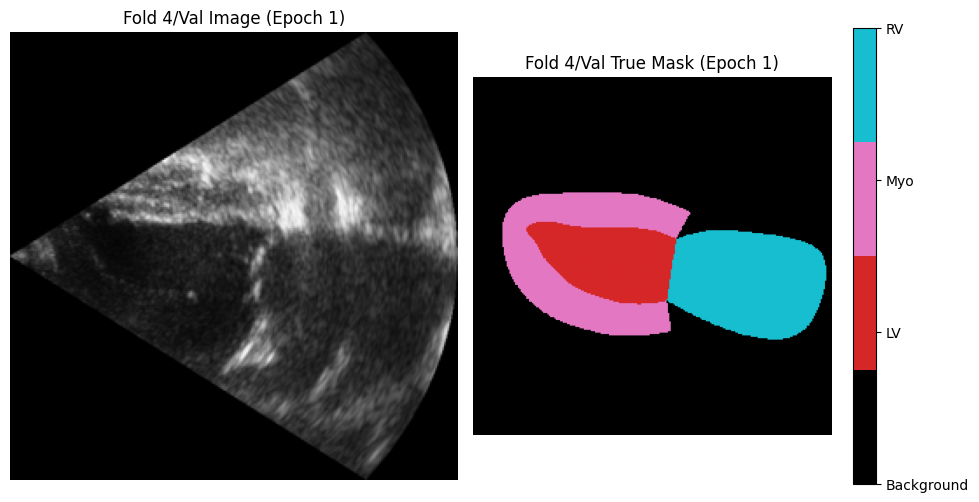

/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


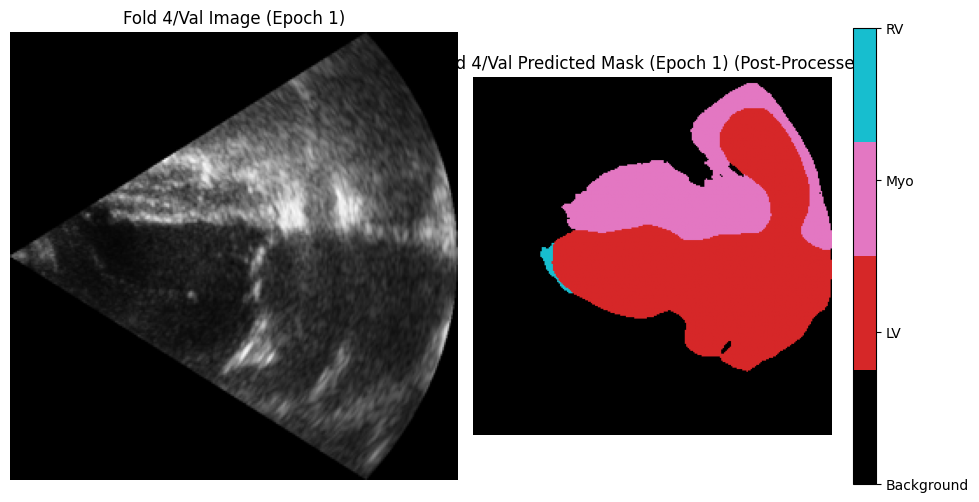

Fold 4/Epoch 1 Validation:   4%|▍         | 1/25 [00:02<00:50,  2.11s/it]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 4/Epoch 1 Validation: 100%|██████████| 25/25 [00:17<00:00,  1.40it/s]


Fold 4/Epoch 1 Validation finished. Average Val Loss: 0.9317
  Fold 4/Overall Avg Val Dice: 0.3558, Overall Avg Val IoU: 0.2528
    LV Dice: 0.5507, IoU: 0.4136
    Myo Dice: 0.4737, IoU: 0.3170
    RV Dice: 0.0430, IoU: 0.0278
New best model saved! (Overall Dice: 0.3558) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_4/best_unet_temporal_fold4_model.pth

Fold 4/Epoch 2/50 - Training


Fold 4/Epoch 2 Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:72: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 4/Epoch 2 Training: 100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Fold 4/Epoch 2 Training finished. Average Train Loss: 0.4960
Fold 4 - Epoch 2 - Validation


Fold 4/Epoch 2 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]


Fold 4/Epoch 2 Validation finished. Average Val Loss: 0.7204
  Fold 4/Overall Avg Val Dice: 0.3982, Overall Avg Val IoU: 0.2864
    LV Dice: 0.6101, IoU: 0.4491
    Myo Dice: 0.5551, IoU: 0.3929
    RV Dice: 0.0294, IoU: 0.0172
New best model saved! (Overall Dice: 0.3982) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_4/best_unet_temporal_fold4_model.pth

Fold 4/Epoch 3/50 - Training


Fold 4/Epoch 3 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 4/Epoch 3 Training finished. Average Train Loss: 0.3908
Fold 4 - Epoch 3 - Validation


Fold 4/Epoch 3 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]


Fold 4/Epoch 3 Validation finished. Average Val Loss: 0.4943
  Fold 4/Overall Avg Val Dice: 0.6297, Overall Avg Val IoU: 0.5004
    LV Dice: 0.6982, IoU: 0.5862
    Myo Dice: 0.6242, IoU: 0.4618
    RV Dice: 0.5666, IoU: 0.4532
New best model saved! (Overall Dice: 0.6297) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_4/best_unet_temporal_fold4_model.pth

Fold 4/Epoch 4/50 - Training


Fold 4/Epoch 4 Training: 100%|██████████| 100/100 [01:08<00:00,  1.45it/s]


Fold 4/Epoch 4 Training finished. Average Train Loss: 0.3341
Fold 4 - Epoch 4 - Validation


Fold 4/Epoch 4 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.33it/s]


Fold 4/Epoch 4 Validation finished. Average Val Loss: 0.5196
  Fold 4/Overall Avg Val Dice: 0.4969, Overall Avg Val IoU: 0.3702
    LV Dice: 0.6744, IoU: 0.5311
    Myo Dice: 0.5923, IoU: 0.4307
    RV Dice: 0.2241, IoU: 0.1488

Fold 4/Epoch 5/50 - Training


Fold 4/Epoch 5 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 4/Epoch 5 Training finished. Average Train Loss: 0.3079
Fold 4 - Epoch 5 - Validation


Fold 4/Epoch 5 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.35it/s]


Fold 4/Epoch 5 Validation finished. Average Val Loss: 0.4642
  Fold 4/Overall Avg Val Dice: 0.5720, Overall Avg Val IoU: 0.4381
    LV Dice: 0.7131, IoU: 0.5842
    Myo Dice: 0.6168, IoU: 0.4576
    RV Dice: 0.3862, IoU: 0.2727

Fold 4/Epoch 6/50 - Training


Fold 4/Epoch 6 Training: 100%|██████████| 100/100 [01:08<00:00,  1.45it/s]


Fold 4/Epoch 6 Training finished. Average Train Loss: 0.2861
Fold 4 - Epoch 6 - Validation


Fold 4/Epoch 6 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.35it/s]


Fold 4/Epoch 6 Validation finished. Average Val Loss: 0.3658
  Fold 4/Overall Avg Val Dice: 0.6700, Overall Avg Val IoU: 0.5440
    LV Dice: 0.7678, IoU: 0.6682
    Myo Dice: 0.6246, IoU: 0.4705
    RV Dice: 0.6175, IoU: 0.4934
New best model saved! (Overall Dice: 0.6700) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_4/best_unet_temporal_fold4_model.pth

Fold 4/Epoch 7/50 - Training


Fold 4/Epoch 7 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 4/Epoch 7 Training finished. Average Train Loss: 0.2660
Fold 4 - Epoch 7 - Validation


Fold 4/Epoch 7 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.35it/s]


Fold 4/Epoch 7 Validation finished. Average Val Loss: 0.5253
  Fold 4/Overall Avg Val Dice: 0.5306, Overall Avg Val IoU: 0.4100
    LV Dice: 0.6927, IoU: 0.5666
    Myo Dice: 0.6709, IoU: 0.5167
    RV Dice: 0.2283, IoU: 0.1465

Fold 4/Epoch 8/50 - Training


Fold 4/Epoch 8 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 4/Epoch 8 Training finished. Average Train Loss: 0.2569
Fold 4 - Epoch 8 - Validation


Fold 4/Epoch 8 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]


Fold 4/Epoch 8 Validation finished. Average Val Loss: 0.3284
  Fold 4/Overall Avg Val Dice: 0.7389, Overall Avg Val IoU: 0.6151
    LV Dice: 0.8381, IoU: 0.7475
    Myo Dice: 0.6653, IoU: 0.5112
    RV Dice: 0.7134, IoU: 0.5865
New best model saved! (Overall Dice: 0.7389) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_4/best_unet_temporal_fold4_model.pth

Fold 4/Epoch 9/50 - Training


Fold 4/Epoch 9 Training: 100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Fold 4/Epoch 9 Training finished. Average Train Loss: 0.2420
Fold 4 - Epoch 9 - Validation


Fold 4/Epoch 9 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]


Fold 4/Epoch 9 Validation finished. Average Val Loss: 0.3338
  Fold 4/Overall Avg Val Dice: 0.7435, Overall Avg Val IoU: 0.6221
    LV Dice: 0.8429, IoU: 0.7536
    Myo Dice: 0.6981, IoU: 0.5472
    RV Dice: 0.6895, IoU: 0.5654
New best model saved! (Overall Dice: 0.7435) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_4/best_unet_temporal_fold4_model.pth

Fold 4/Epoch 10/50 - Training


Fold 4/Epoch 10 Training: 100%|██████████| 100/100 [01:08<00:00,  1.45it/s]


Fold 4/Epoch 10 Training finished. Average Train Loss: 0.2314
Fold 4 - Epoch 10 - Validation


Fold 4/Epoch 10 Validation:   0%|          | 0/25 [00:00<?, ?it/s]


    Fold 4/Visualizing a validation sample from Epoch 10 (True Mask vs Predicted Mask)...


/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


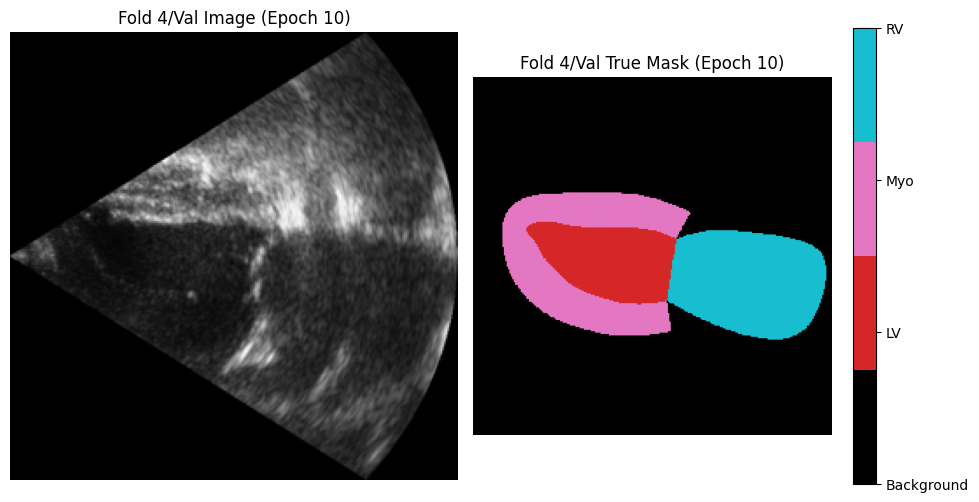

/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


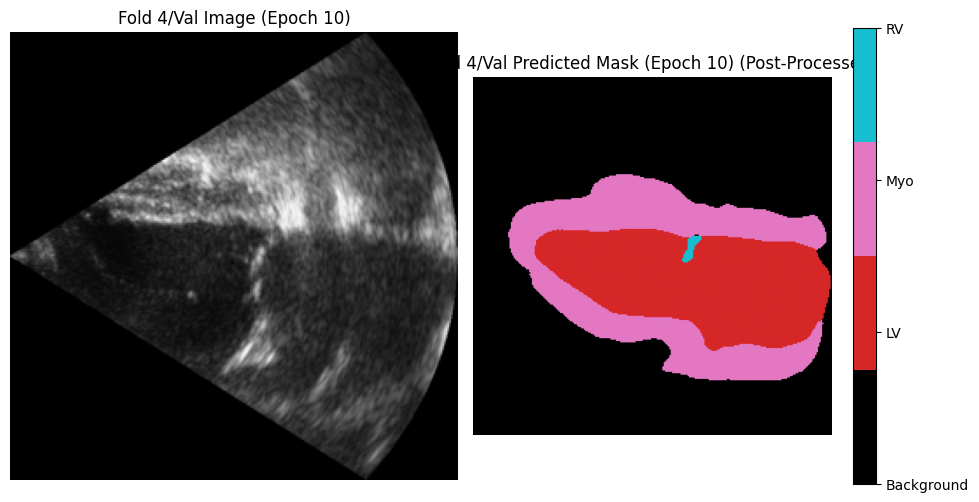

Fold 4/Epoch 10 Validation:   4%|▍         | 1/25 [00:02<00:55,  2.30s/it]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 4/Epoch 10 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.35it/s]


Fold 4/Epoch 10 Validation finished. Average Val Loss: 0.4350
  Fold 4/Overall Avg Val Dice: 0.6365, Overall Avg Val IoU: 0.5134
    LV Dice: 0.7657, IoU: 0.6644
    Myo Dice: 0.6926, IoU: 0.5392
    RV Dice: 0.4513, IoU: 0.3367

Fold 4/Epoch 11/50 - Training


Fold 4/Epoch 11 Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:72: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 4/Epoch 11 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 4/Epoch 11 Training finished. Average Train Loss: 0.2354
Fold 4 - Epoch 11 - Validation


Fold 4/Epoch 11 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.35it/s]


Fold 4/Epoch 11 Validation finished. Average Val Loss: 0.4006
  Fold 4/Overall Avg Val Dice: 0.6702, Overall Avg Val IoU: 0.5473
    LV Dice: 0.8119, IoU: 0.7173
    Myo Dice: 0.6828, IoU: 0.5288
    RV Dice: 0.5160, IoU: 0.3959

Fold 4/Epoch 12/50 - Training


Fold 4/Epoch 12 Training: 100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Fold 4/Epoch 12 Training finished. Average Train Loss: 0.2232
Fold 4 - Epoch 12 - Validation


Fold 4/Epoch 12 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]


Fold 4/Epoch 12 Validation finished. Average Val Loss: 0.3508
  Fold 4/Overall Avg Val Dice: 0.6910, Overall Avg Val IoU: 0.5653
    LV Dice: 0.8231, IoU: 0.7227
    Myo Dice: 0.7130, IoU: 0.5661
    RV Dice: 0.5370, IoU: 0.4071

Fold 4/Epoch 13/50 - Training


Fold 4/Epoch 13 Training: 100%|██████████| 100/100 [01:07<00:00,  1.49it/s]


Fold 4/Epoch 13 Training finished. Average Train Loss: 0.2126
Fold 4 - Epoch 13 - Validation


Fold 4/Epoch 13 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.34it/s]


Fold 4/Epoch 13 Validation finished. Average Val Loss: 0.3551
  Fold 4/Overall Avg Val Dice: 0.7121, Overall Avg Val IoU: 0.5929
    LV Dice: 0.8174, IoU: 0.7319
    Myo Dice: 0.7346, IoU: 0.5917
    RV Dice: 0.5845, IoU: 0.4550

Fold 4/Epoch 14/50 - Training


Fold 4/Epoch 14 Training: 100%|██████████| 100/100 [01:08<00:00,  1.47it/s]


Fold 4/Epoch 14 Training finished. Average Train Loss: 0.2106
Fold 4 - Epoch 14 - Validation


Fold 4/Epoch 14 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.35it/s]


Fold 4/Epoch 14 Validation finished. Average Val Loss: 0.3667
  Fold 4/Overall Avg Val Dice: 0.7020, Overall Avg Val IoU: 0.5725
    LV Dice: 0.7941, IoU: 0.6826
    Myo Dice: 0.6859, IoU: 0.5340
    RV Dice: 0.6260, IoU: 0.5007

Fold 4/Epoch 15/50 - Training


Fold 4/Epoch 15 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 4/Epoch 15 Training finished. Average Train Loss: 0.2100
Fold 4 - Epoch 15 - Validation


Fold 4/Epoch 15 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.33it/s]


Fold 4/Epoch 15 Validation finished. Average Val Loss: 0.3808
  Fold 4/Overall Avg Val Dice: 0.6339, Overall Avg Val IoU: 0.5089
    LV Dice: 0.7654, IoU: 0.6492
    Myo Dice: 0.6872, IoU: 0.5345
    RV Dice: 0.4491, IoU: 0.3429

Fold 4/Epoch 16/50 - Training


Fold 4/Epoch 16 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 4/Epoch 16 Training finished. Average Train Loss: 0.1878
Fold 4 - Epoch 16 - Validation


Fold 4/Epoch 16 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.33it/s]


Fold 4/Epoch 16 Validation finished. Average Val Loss: 0.3132
  Fold 4/Overall Avg Val Dice: 0.7180, Overall Avg Val IoU: 0.5982
    LV Dice: 0.8308, IoU: 0.7307
    Myo Dice: 0.7058, IoU: 0.5588
    RV Dice: 0.6173, IoU: 0.5050

Fold 4/Epoch 17/50 - Training


Fold 4/Epoch 17 Training: 100%|██████████| 100/100 [01:09<00:00,  1.45it/s]


Fold 4/Epoch 17 Training finished. Average Train Loss: 0.1768
Fold 4 - Epoch 17 - Validation


Fold 4/Epoch 17 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.34it/s]


Fold 4/Epoch 17 Validation finished. Average Val Loss: 0.2976
  Fold 4/Overall Avg Val Dice: 0.7356, Overall Avg Val IoU: 0.6176
    LV Dice: 0.8436, IoU: 0.7490
    Myo Dice: 0.7086, IoU: 0.5633
    RV Dice: 0.6547, IoU: 0.5404

Fold 4/Epoch 18/50 - Training


Fold 4/Epoch 18 Training: 100%|██████████| 100/100 [01:09<00:00,  1.43it/s]


Fold 4/Epoch 18 Training finished. Average Train Loss: 0.1739
Fold 4 - Epoch 18 - Validation


Fold 4/Epoch 18 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.33it/s]


Fold 4/Epoch 18 Validation finished. Average Val Loss: 0.3012
  Fold 4/Overall Avg Val Dice: 0.7329, Overall Avg Val IoU: 0.6146
    LV Dice: 0.8315, IoU: 0.7354
    Myo Dice: 0.7165, IoU: 0.5729
    RV Dice: 0.6507, IoU: 0.5354

Fold 4/Epoch 19/50 - Training


Fold 4/Epoch 19 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 4/Epoch 19 Training finished. Average Train Loss: 0.1760
Fold 4 - Epoch 19 - Validation


Fold 4/Epoch 19 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.33it/s]


Fold 4/Epoch 19 Validation finished. Average Val Loss: 0.2654
  Fold 4/Overall Avg Val Dice: 0.7662, Overall Avg Val IoU: 0.6529
    LV Dice: 0.8559, IoU: 0.7681
    Myo Dice: 0.7328, IoU: 0.5925
    RV Dice: 0.7097, IoU: 0.5982
New best model saved! (Overall Dice: 0.7662) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_4/best_unet_temporal_fold4_model.pth

Fold 4/Epoch 20/50 - Training


Fold 4/Epoch 20 Training: 100%|██████████| 100/100 [01:09<00:00,  1.43it/s]


Fold 4/Epoch 20 Training finished. Average Train Loss: 0.1719
Fold 4 - Epoch 20 - Validation


Fold 4/Epoch 20 Validation:   0%|          | 0/25 [00:00<?, ?it/s]


    Fold 4/Visualizing a validation sample from Epoch 20 (True Mask vs Predicted Mask)...


/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


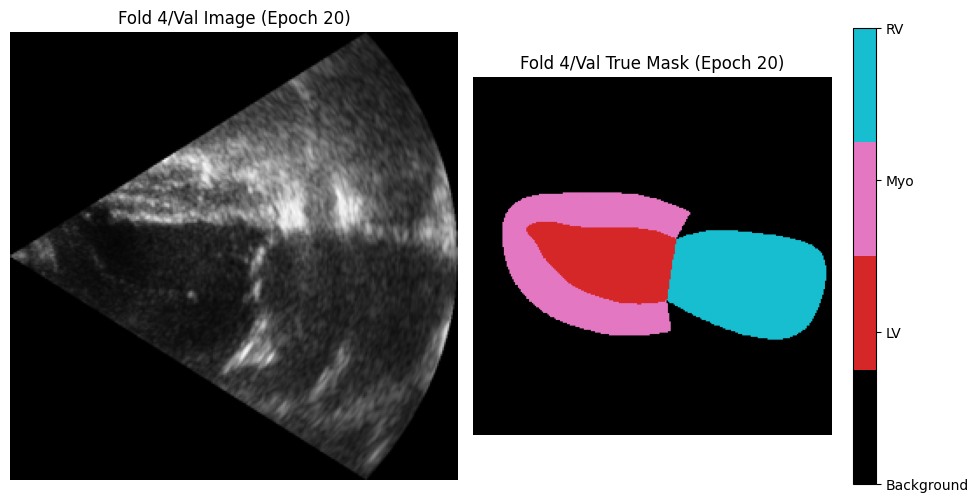

/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


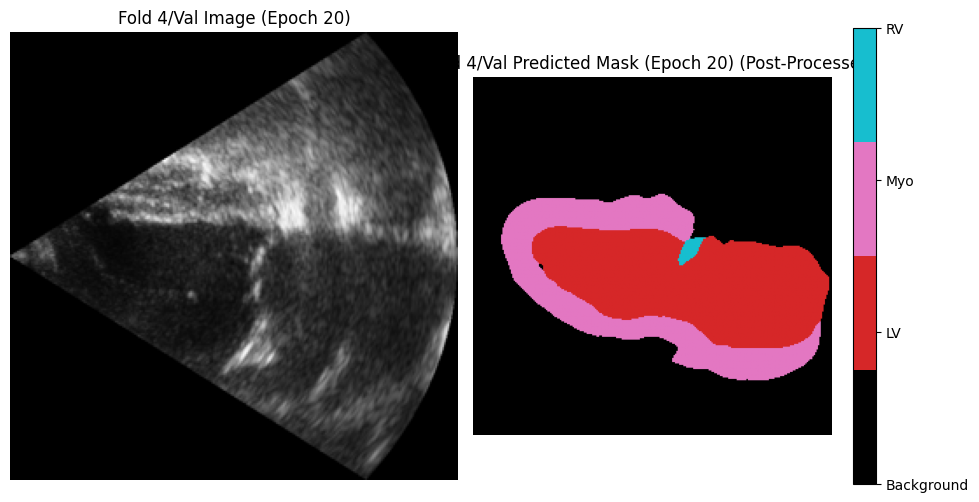

Fold 4/Epoch 20 Validation:   4%|▍         | 1/25 [00:02<00:54,  2.26s/it]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 4/Epoch 20 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.33it/s]


Fold 4/Epoch 20 Validation finished. Average Val Loss: 0.3268
  Fold 4/Overall Avg Val Dice: 0.7116, Overall Avg Val IoU: 0.5922
    LV Dice: 0.8430, IoU: 0.7447
    Myo Dice: 0.7112, IoU: 0.5666
    RV Dice: 0.5806, IoU: 0.4654

Fold 4/Epoch 21/50 - Training


Fold 4/Epoch 21 Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:72: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 4/Epoch 21 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 4/Epoch 21 Training finished. Average Train Loss: 0.1708
Fold 4 - Epoch 21 - Validation


Fold 4/Epoch 21 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.32it/s]


Fold 4/Epoch 21 Validation finished. Average Val Loss: 0.2692
  Fold 4/Overall Avg Val Dice: 0.7601, Overall Avg Val IoU: 0.6466
    LV Dice: 0.8528, IoU: 0.7634
    Myo Dice: 0.7340, IoU: 0.5947
    RV Dice: 0.6934, IoU: 0.5817

Fold 4/Epoch 22/50 - Training


Fold 4/Epoch 22 Training: 100%|██████████| 100/100 [01:09<00:00,  1.43it/s]


Fold 4/Epoch 22 Training finished. Average Train Loss: 0.1695
Fold 4 - Epoch 22 - Validation


Fold 4/Epoch 22 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.33it/s]


Fold 4/Epoch 22 Validation finished. Average Val Loss: 0.2878
  Fold 4/Overall Avg Val Dice: 0.7517, Overall Avg Val IoU: 0.6343
    LV Dice: 0.8588, IoU: 0.7654
    Myo Dice: 0.7302, IoU: 0.5869
    RV Dice: 0.6659, IoU: 0.5507

Fold 4/Epoch 23/50 - Training


Fold 4/Epoch 23 Training: 100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Fold 4/Epoch 23 Training finished. Average Train Loss: 0.1666
Fold 4 - Epoch 23 - Validation


Fold 4/Epoch 23 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.33it/s]


Fold 4/Epoch 23 Validation finished. Average Val Loss: 0.2755
  Fold 4/Overall Avg Val Dice: 0.7538, Overall Avg Val IoU: 0.6406
    LV Dice: 0.8504, IoU: 0.7607
    Myo Dice: 0.7352, IoU: 0.5957
    RV Dice: 0.6758, IoU: 0.5654

Fold 4/Epoch 24/50 - Training


Fold 4/Epoch 24 Training: 100%|██████████| 100/100 [01:09<00:00,  1.45it/s]


Fold 4/Epoch 24 Training finished. Average Train Loss: 0.1705
Fold 4 - Epoch 24 - Validation


Fold 4/Epoch 24 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]


Fold 4/Epoch 24 Validation finished. Average Val Loss: 0.2892
  Fold 4/Overall Avg Val Dice: 0.7484, Overall Avg Val IoU: 0.6322
    LV Dice: 0.8570, IoU: 0.7634
    Myo Dice: 0.7440, IoU: 0.6042
    RV Dice: 0.6442, IoU: 0.5289

Fold 4/Epoch 25/50 - Training


Fold 4/Epoch 25 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 4/Epoch 25 Training finished. Average Train Loss: 0.1633
Fold 4 - Epoch 25 - Validation


Fold 4/Epoch 25 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]


Fold 4/Epoch 25 Validation finished. Average Val Loss: 0.2917
  Fold 4/Overall Avg Val Dice: 0.7422, Overall Avg Val IoU: 0.6258
    LV Dice: 0.8439, IoU: 0.7498
    Myo Dice: 0.7309, IoU: 0.5906
    RV Dice: 0.6519, IoU: 0.5369

Fold 4/Epoch 26/50 - Training


Fold 4/Epoch 26 Training: 100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Fold 4/Epoch 26 Training finished. Average Train Loss: 0.1598
Fold 4 - Epoch 26 - Validation


Fold 4/Epoch 26 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]


Fold 4/Epoch 26 Validation finished. Average Val Loss: 0.2662
  Fold 4/Overall Avg Val Dice: 0.7717, Overall Avg Val IoU: 0.6579
    LV Dice: 0.8583, IoU: 0.7726
    Myo Dice: 0.7311, IoU: 0.5919
    RV Dice: 0.7257, IoU: 0.6093
New best model saved! (Overall Dice: 0.7717) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_4/best_unet_temporal_fold4_model.pth

Fold 4/Epoch 27/50 - Training


Fold 4/Epoch 27 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 4/Epoch 27 Training finished. Average Train Loss: 0.1587
Fold 4 - Epoch 27 - Validation


Fold 4/Epoch 27 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.35it/s]


Fold 4/Epoch 27 Validation finished. Average Val Loss: 0.2566
  Fold 4/Overall Avg Val Dice: 0.7818, Overall Avg Val IoU: 0.6699
    LV Dice: 0.8691, IoU: 0.7870
    Myo Dice: 0.7386, IoU: 0.6002
    RV Dice: 0.7377, IoU: 0.6224
New best model saved! (Overall Dice: 0.7818) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_4/best_unet_temporal_fold4_model.pth

Fold 4/Epoch 28/50 - Training


Fold 4/Epoch 28 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 4/Epoch 28 Training finished. Average Train Loss: 0.1621
Fold 4 - Epoch 28 - Validation


Fold 4/Epoch 28 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]


Fold 4/Epoch 28 Validation finished. Average Val Loss: 0.2665
  Fold 4/Overall Avg Val Dice: 0.7679, Overall Avg Val IoU: 0.6543
    LV Dice: 0.8573, IoU: 0.7702
    Myo Dice: 0.7378, IoU: 0.5988
    RV Dice: 0.7087, IoU: 0.5939

Fold 4/Epoch 29/50 - Training


Fold 4/Epoch 29 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 4/Epoch 29 Training finished. Average Train Loss: 0.1605
Fold 4 - Epoch 29 - Validation


Fold 4/Epoch 29 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.35it/s]


Fold 4/Epoch 29 Validation finished. Average Val Loss: 0.2645
  Fold 4/Overall Avg Val Dice: 0.7702, Overall Avg Val IoU: 0.6577
    LV Dice: 0.8636, IoU: 0.7778
    Myo Dice: 0.7434, IoU: 0.6054
    RV Dice: 0.7037, IoU: 0.5899

Fold 4/Epoch 30/50 - Training


Fold 4/Epoch 30 Training: 100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Fold 4/Epoch 30 Training finished. Average Train Loss: 0.1622
Fold 4 - Epoch 30 - Validation


Fold 4/Epoch 30 Validation:   0%|          | 0/25 [00:00<?, ?it/s]


    Fold 4/Visualizing a validation sample from Epoch 30 (True Mask vs Predicted Mask)...


/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


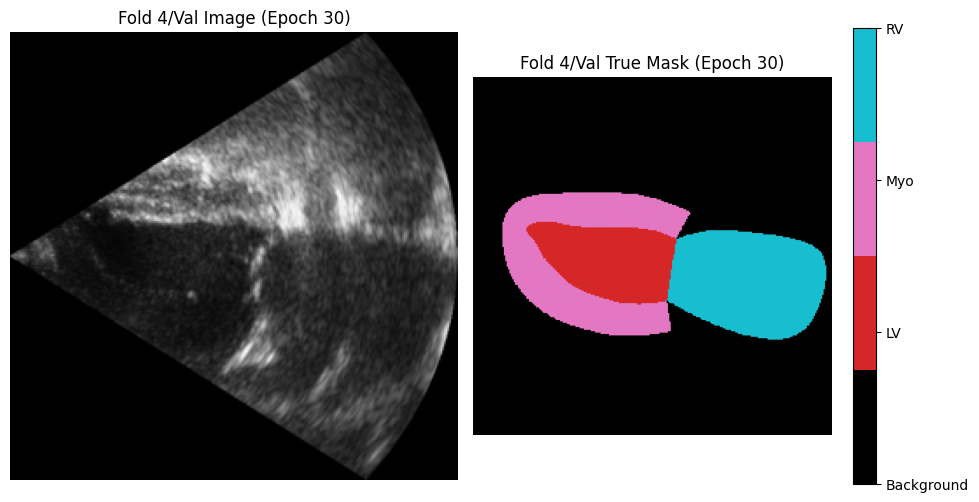

/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


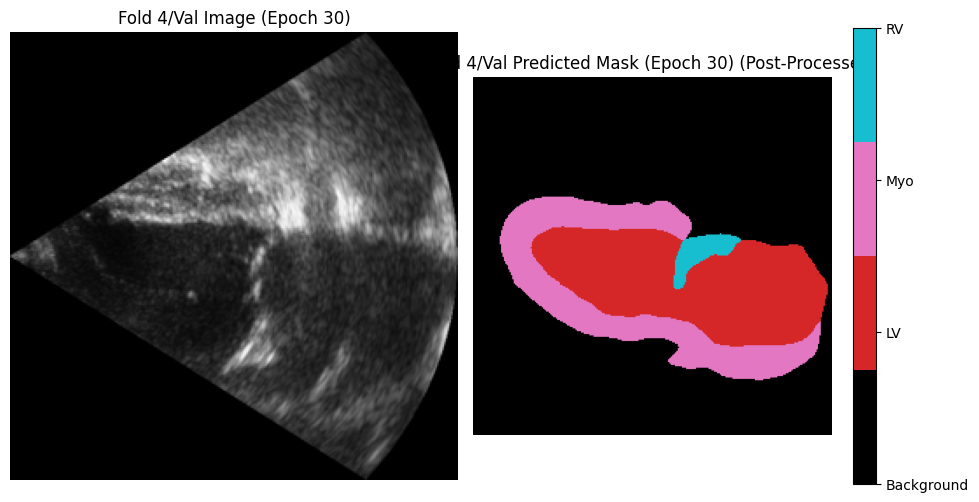

Fold 4/Epoch 30 Validation:   4%|▍         | 1/25 [00:02<00:52,  2.19s/it]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 4/Epoch 30 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.35it/s]


Fold 4/Epoch 30 Validation finished. Average Val Loss: 0.2520
  Fold 4/Overall Avg Val Dice: 0.7858, Overall Avg Val IoU: 0.6730
    LV Dice: 0.8692, IoU: 0.7848
    Myo Dice: 0.7535, IoU: 0.6155
    RV Dice: 0.7347, IoU: 0.6186
New best model saved! (Overall Dice: 0.7858) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_4/best_unet_temporal_fold4_model.pth

Fold 4/Epoch 31/50 - Training


Fold 4/Epoch 31 Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:72: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 4/Epoch 31 Training: 100%|██████████| 100/100 [01:07<00:00,  1.49it/s]


Fold 4/Epoch 31 Training finished. Average Train Loss: 0.1643
Fold 4 - Epoch 31 - Validation


Fold 4/Epoch 31 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.35it/s]


Fold 4/Epoch 31 Validation finished. Average Val Loss: 0.2854
  Fold 4/Overall Avg Val Dice: 0.7555, Overall Avg Val IoU: 0.6406
    LV Dice: 0.8544, IoU: 0.7647
    Myo Dice: 0.7465, IoU: 0.6069
    RV Dice: 0.6655, IoU: 0.5504

Fold 4/Epoch 32/50 - Training


Fold 4/Epoch 32 Training: 100%|██████████| 100/100 [01:08<00:00,  1.47it/s]


Fold 4/Epoch 32 Training finished. Average Train Loss: 0.1617
Fold 4 - Epoch 32 - Validation


Fold 4/Epoch 32 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.34it/s]


Fold 4/Epoch 32 Validation finished. Average Val Loss: 0.2848
  Fold 4/Overall Avg Val Dice: 0.7538, Overall Avg Val IoU: 0.6399
    LV Dice: 0.8558, IoU: 0.7674
    Myo Dice: 0.7403, IoU: 0.5998
    RV Dice: 0.6652, IoU: 0.5526

Fold 4/Epoch 33/50 - Training


Fold 4/Epoch 33 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 4/Epoch 33 Training finished. Average Train Loss: 0.1625
Fold 4 - Epoch 33 - Validation


Fold 4/Epoch 33 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.35it/s]


Fold 4/Epoch 33 Validation finished. Average Val Loss: 0.2884
  Fold 4/Overall Avg Val Dice: 0.7484, Overall Avg Val IoU: 0.6327
    LV Dice: 0.8428, IoU: 0.7493
    Myo Dice: 0.7359, IoU: 0.5950
    RV Dice: 0.6665, IoU: 0.5539

Fold 4/Epoch 34/50 - Training


Fold 4/Epoch 34 Training: 100%|██████████| 100/100 [01:08<00:00,  1.47it/s]


Fold 4/Epoch 34 Training finished. Average Train Loss: 0.1602
Fold 4 - Epoch 34 - Validation


Fold 4/Epoch 34 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.35it/s]


Fold 4/Epoch 34 Validation finished. Average Val Loss: 0.2602
  Fold 4/Overall Avg Val Dice: 0.7718, Overall Avg Val IoU: 0.6588
    LV Dice: 0.8598, IoU: 0.7736
    Myo Dice: 0.7480, IoU: 0.6091
    RV Dice: 0.7075, IoU: 0.5938

Fold 4/Epoch 35/50 - Training


Fold 4/Epoch 35 Training: 100%|██████████| 100/100 [01:08<00:00,  1.47it/s]


Fold 4/Epoch 35 Training finished. Average Train Loss: 0.1580
Fold 4 - Epoch 35 - Validation


Fold 4/Epoch 35 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]


Fold 4/Epoch 35 Validation finished. Average Val Loss: 0.2636
  Fold 4/Overall Avg Val Dice: 0.7667, Overall Avg Val IoU: 0.6536
    LV Dice: 0.8580, IoU: 0.7707
    Myo Dice: 0.7449, IoU: 0.6075
    RV Dice: 0.6973, IoU: 0.5826

Fold 4/Epoch 36/50 - Training


Fold 4/Epoch 36 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 4/Epoch 36 Training finished. Average Train Loss: 0.1587
Fold 4 - Epoch 36 - Validation


Fold 4/Epoch 36 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]


Fold 4/Epoch 36 Validation finished. Average Val Loss: 0.2402
  Fold 4/Overall Avg Val Dice: 0.7988, Overall Avg Val IoU: 0.6885
    LV Dice: 0.8710, IoU: 0.7901
    Myo Dice: 0.7572, IoU: 0.6210
    RV Dice: 0.7682, IoU: 0.6544
New best model saved! (Overall Dice: 0.7988) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_4/best_unet_temporal_fold4_model.pth

Fold 4/Epoch 37/50 - Training


Fold 4/Epoch 37 Training: 100%|██████████| 100/100 [01:09<00:00,  1.45it/s]


Fold 4/Epoch 37 Training finished. Average Train Loss: 0.1634
Fold 4 - Epoch 37 - Validation


Fold 4/Epoch 37 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]


Fold 4/Epoch 37 Validation finished. Average Val Loss: 0.2559
  Fold 4/Overall Avg Val Dice: 0.7816, Overall Avg Val IoU: 0.6688
    LV Dice: 0.8688, IoU: 0.7840
    Myo Dice: 0.7521, IoU: 0.6137
    RV Dice: 0.7238, IoU: 0.6085

Fold 4/Epoch 38/50 - Training


Fold 4/Epoch 38 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 4/Epoch 38 Training finished. Average Train Loss: 0.1581
Fold 4 - Epoch 38 - Validation


Fold 4/Epoch 38 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.39it/s]


Fold 4/Epoch 38 Validation finished. Average Val Loss: 0.2522
  Fold 4/Overall Avg Val Dice: 0.7832, Overall Avg Val IoU: 0.6709
    LV Dice: 0.8768, IoU: 0.7919
    Myo Dice: 0.7440, IoU: 0.6066
    RV Dice: 0.7289, IoU: 0.6141

Fold 4/Epoch 39/50 - Training


Fold 4/Epoch 39 Training: 100%|██████████| 100/100 [01:06<00:00,  1.50it/s]


Fold 4/Epoch 39 Training finished. Average Train Loss: 0.1618
Fold 4 - Epoch 39 - Validation


Fold 4/Epoch 39 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]


Fold 4/Epoch 39 Validation finished. Average Val Loss: 0.2688
  Fold 4/Overall Avg Val Dice: 0.7652, Overall Avg Val IoU: 0.6516
    LV Dice: 0.8564, IoU: 0.7685
    Myo Dice: 0.7373, IoU: 0.5985
    RV Dice: 0.7019, IoU: 0.5878

Fold 4/Epoch 40/50 - Training


Fold 4/Epoch 40 Training: 100%|██████████| 100/100 [01:07<00:00,  1.49it/s]


Fold 4/Epoch 40 Training finished. Average Train Loss: 0.1577
Fold 4 - Epoch 40 - Validation


Fold 4/Epoch 40 Validation:   0%|          | 0/25 [00:00<?, ?it/s]


    Fold 4/Visualizing a validation sample from Epoch 40 (True Mask vs Predicted Mask)...


/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


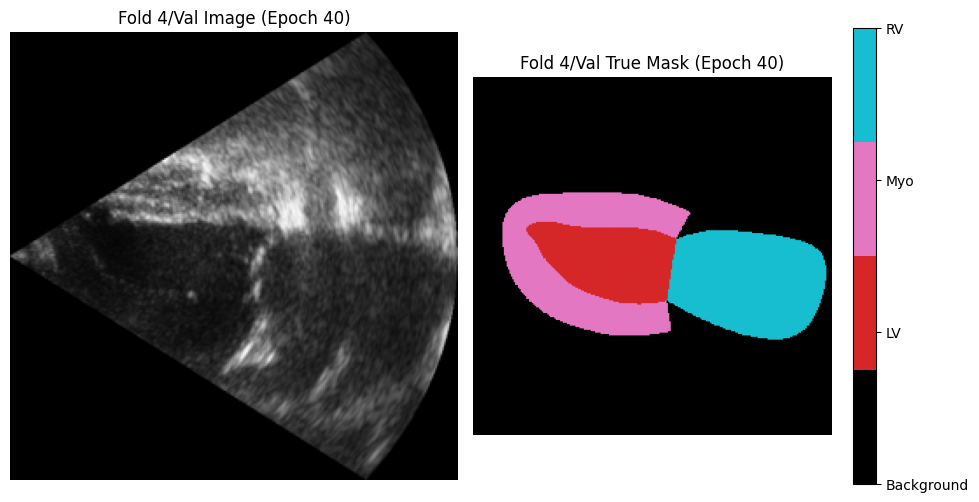

/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


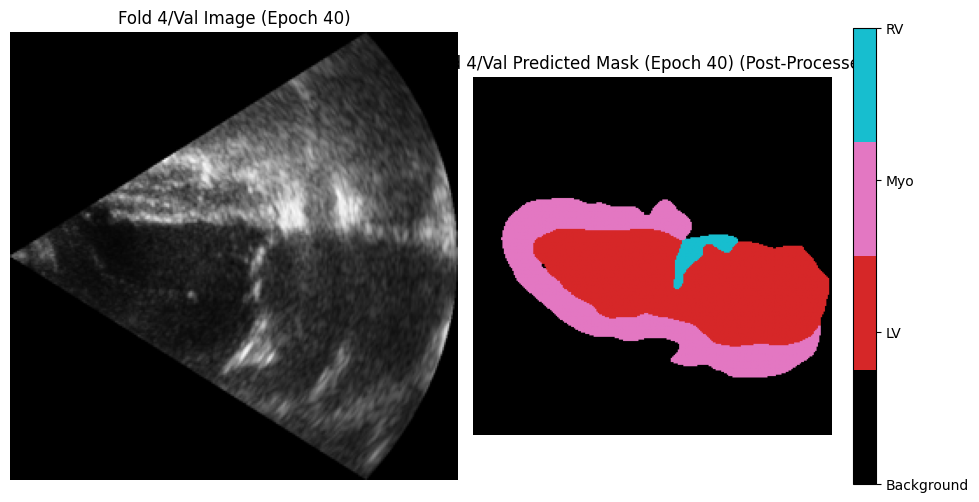

Fold 4/Epoch 40 Validation:   4%|▍         | 1/25 [00:02<00:53,  2.22s/it]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 4/Epoch 40 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]


Fold 4/Epoch 40 Validation finished. Average Val Loss: 0.2782
  Fold 4/Overall Avg Val Dice: 0.7564, Overall Avg Val IoU: 0.6391
    LV Dice: 0.8616, IoU: 0.7691
    Myo Dice: 0.7451, IoU: 0.6063
    RV Dice: 0.6625, IoU: 0.5420

Fold 4/Epoch 41/50 - Training


Fold 4/Epoch 41 Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:72: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 4/Epoch 41 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 4/Epoch 41 Training finished. Average Train Loss: 0.1601
Fold 4 - Epoch 41 - Validation


Fold 4/Epoch 41 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]


Fold 4/Epoch 41 Validation finished. Average Val Loss: 0.2772
  Fold 4/Overall Avg Val Dice: 0.7533, Overall Avg Val IoU: 0.6382
    LV Dice: 0.8541, IoU: 0.7645
    Myo Dice: 0.7376, IoU: 0.5983
    RV Dice: 0.6682, IoU: 0.5519

Fold 4/Epoch 42/50 - Training


Fold 4/Epoch 42 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 4/Epoch 42 Training finished. Average Train Loss: 0.1568
Fold 4 - Epoch 42 - Validation


Fold 4/Epoch 42 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]


Fold 4/Epoch 42 Validation finished. Average Val Loss: 0.2791
  Fold 4/Overall Avg Val Dice: 0.7590, Overall Avg Val IoU: 0.6427
    LV Dice: 0.8611, IoU: 0.7696
    Myo Dice: 0.7513, IoU: 0.6122
    RV Dice: 0.6648, IoU: 0.5463

Fold 4/Epoch 43/50 - Training


Fold 4/Epoch 43 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 4/Epoch 43 Training finished. Average Train Loss: 0.1639
Fold 4 - Epoch 43 - Validation


Fold 4/Epoch 43 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.35it/s]


Fold 4/Epoch 43 Validation finished. Average Val Loss: 0.2736
  Fold 4/Overall Avg Val Dice: 0.7623, Overall Avg Val IoU: 0.6474
    LV Dice: 0.8574, IoU: 0.7690
    Myo Dice: 0.7466, IoU: 0.6067
    RV Dice: 0.6829, IoU: 0.5666

Fold 4/Epoch 44/50 - Training


Fold 4/Epoch 44 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 4/Epoch 44 Training finished. Average Train Loss: 0.1570
Fold 4 - Epoch 44 - Validation


Fold 4/Epoch 44 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]


Fold 4/Epoch 44 Validation finished. Average Val Loss: 0.2659
  Fold 4/Overall Avg Val Dice: 0.7674, Overall Avg Val IoU: 0.6539
    LV Dice: 0.8576, IoU: 0.7706
    Myo Dice: 0.7434, IoU: 0.6042
    RV Dice: 0.7013, IoU: 0.5870

Fold 4/Epoch 45/50 - Training


Fold 4/Epoch 45 Training: 100%|██████████| 100/100 [01:09<00:00,  1.43it/s]


Fold 4/Epoch 45 Training finished. Average Train Loss: 0.1619
Fold 4 - Epoch 45 - Validation


Fold 4/Epoch 45 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.35it/s]


Fold 4/Epoch 45 Validation finished. Average Val Loss: 0.2547
  Fold 4/Overall Avg Val Dice: 0.7807, Overall Avg Val IoU: 0.6670
    LV Dice: 0.8607, IoU: 0.7755
    Myo Dice: 0.7307, IoU: 0.5904
    RV Dice: 0.7506, IoU: 0.6352

Fold 4/Epoch 46/50 - Training


Fold 4/Epoch 46 Training: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Fold 4/Epoch 46 Training finished. Average Train Loss: 0.1581
Fold 4 - Epoch 46 - Validation


Fold 4/Epoch 46 Validation: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]


Fold 4/Epoch 46 Validation finished. Average Val Loss: 0.2701
  Fold 4/Overall Avg Val Dice: 0.7649, Overall Avg Val IoU: 0.6504
    LV Dice: 0.8581, IoU: 0.7701
    Myo Dice: 0.7447, IoU: 0.6048
    RV Dice: 0.6919, IoU: 0.5763

Early stopping triggered after 46 epochs due to no improvement in validation Dice score for 10 epochs.

Fold 4/Training complete!

======== Starting Fold 5/5 ========
CamusTemporalDataset (Training): Initializing and scanning for sequences...
CamusTemporalDataset (Training): Found 500 valid 2CH_half_sequence samples.
CamusTemporalDataset (Validation/Test): Initializing and scanning for sequences...


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/tmp/ipython-input-15-1634110382.py:94: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = amp.GradScaler()


CamusTemporalDataset (Validation/Test): Found 500 valid 2CH_half_sequence samples.
Fold 5: Training DataLoader has 100 batches (400 samples).
Fold 5: Validation DataLoader has 25 batches (100 samples).
Checkpoints for Fold 5 will be saved to: /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_5

--- Fold 5/Starting Training and Validation Loop ---
Starting training for 50 epochs (actual epochs may vary due to early stopping criteria)...

Fold 5/Epoch 1/50 - Training


Fold 5/Epoch 1 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 5/Epoch 1 Training finished. Average Train Loss: 0.9066
Fold 5 - Epoch 1 - Validation


Fold 5/Epoch 1 Validation:   0%|          | 0/25 [00:00<?, ?it/s]


    Fold 5/Visualizing a validation sample from Epoch 1 (True Mask vs Predicted Mask)...


/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


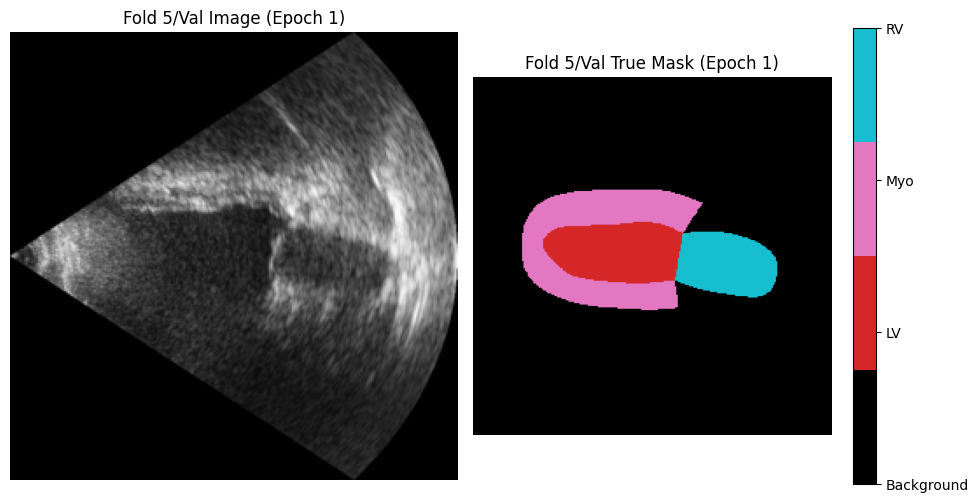

/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


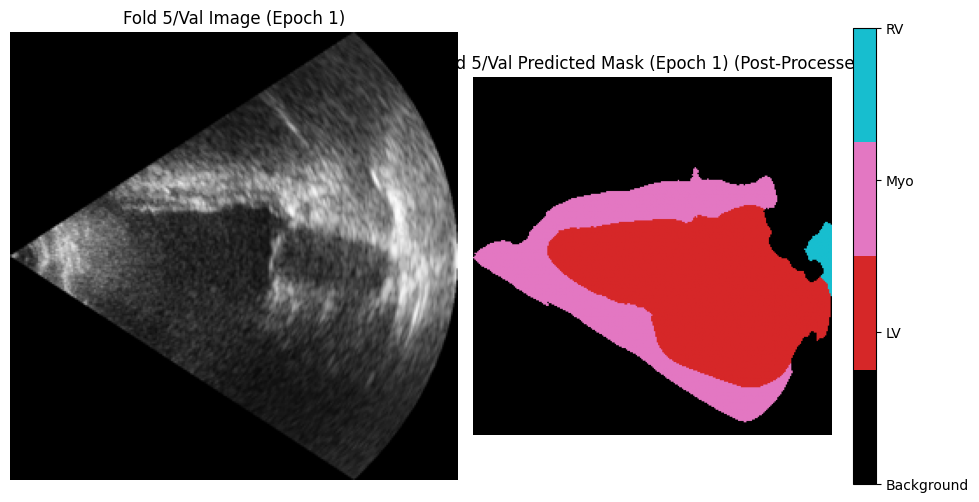

Fold 5/Epoch 1 Validation:   4%|▍         | 1/25 [00:02<00:59,  2.48s/it]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 5/Epoch 1 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.54it/s]


Fold 5/Epoch 1 Validation finished. Average Val Loss: 0.9031
  Fold 5/Overall Avg Val Dice: 0.3444, Overall Avg Val IoU: 0.2394
    LV Dice: 0.5587, IoU: 0.4095
    Myo Dice: 0.4171, IoU: 0.2740
    RV Dice: 0.0573, IoU: 0.0347
New best model saved! (Overall Dice: 0.3444) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_5/best_unet_temporal_fold5_model.pth

Fold 5/Epoch 2/50 - Training


Fold 5/Epoch 2 Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:72: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 5/Epoch 2 Training: 100%|██████████| 100/100 [01:10<00:00,  1.41it/s]


Fold 5/Epoch 2 Training finished. Average Train Loss: 0.5646
Fold 5 - Epoch 2 - Validation


Fold 5/Epoch 2 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.54it/s]


Fold 5/Epoch 2 Validation finished. Average Val Loss: 0.6088
  Fold 5/Overall Avg Val Dice: 0.4485, Overall Avg Val IoU: 0.3289
    LV Dice: 0.6297, IoU: 0.4815
    Myo Dice: 0.5620, IoU: 0.4044
    RV Dice: 0.1537, IoU: 0.1009
New best model saved! (Overall Dice: 0.4485) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_5/best_unet_temporal_fold5_model.pth

Fold 5/Epoch 3/50 - Training


Fold 5/Epoch 3 Training: 100%|██████████| 100/100 [01:09<00:00,  1.45it/s]


Fold 5/Epoch 3 Training finished. Average Train Loss: 0.4061
Fold 5 - Epoch 3 - Validation


Fold 5/Epoch 3 Validation: 100%|██████████| 25/25 [00:15<00:00,  1.57it/s]


Fold 5/Epoch 3 Validation finished. Average Val Loss: 0.6098
  Fold 5/Overall Avg Val Dice: 0.4240, Overall Avg Val IoU: 0.3110
    LV Dice: 0.6422, IoU: 0.4931
    Myo Dice: 0.5550, IoU: 0.3922
    RV Dice: 0.0749, IoU: 0.0477

Fold 5/Epoch 4/50 - Training


Fold 5/Epoch 4 Training: 100%|██████████| 100/100 [01:10<00:00,  1.41it/s]


Fold 5/Epoch 4 Training finished. Average Train Loss: 0.3418
Fold 5 - Epoch 4 - Validation


Fold 5/Epoch 4 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.54it/s]


Fold 5/Epoch 4 Validation finished. Average Val Loss: 0.6482
  Fold 5/Overall Avg Val Dice: 0.4215, Overall Avg Val IoU: 0.3127
    LV Dice: 0.6583, IoU: 0.5058
    Myo Dice: 0.5770, IoU: 0.4150
    RV Dice: 0.0293, IoU: 0.0172

Fold 5/Epoch 5/50 - Training


Fold 5/Epoch 5 Training: 100%|██████████| 100/100 [01:10<00:00,  1.43it/s]


Fold 5/Epoch 5 Training finished. Average Train Loss: 0.3185
Fold 5 - Epoch 5 - Validation


Fold 5/Epoch 5 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.54it/s]


Fold 5/Epoch 5 Validation finished. Average Val Loss: 0.5007
  Fold 5/Overall Avg Val Dice: 0.5248, Overall Avg Val IoU: 0.4014
    LV Dice: 0.7131, IoU: 0.5718
    Myo Dice: 0.6158, IoU: 0.4543
    RV Dice: 0.2455, IoU: 0.1780
New best model saved! (Overall Dice: 0.5248) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_5/best_unet_temporal_fold5_model.pth

Fold 5/Epoch 6/50 - Training


Fold 5/Epoch 6 Training: 100%|██████████| 100/100 [01:09<00:00,  1.43it/s]


Fold 5/Epoch 6 Training finished. Average Train Loss: 0.2885
Fold 5 - Epoch 6 - Validation


Fold 5/Epoch 6 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.53it/s]


Fold 5/Epoch 6 Validation finished. Average Val Loss: 0.4835
  Fold 5/Overall Avg Val Dice: 0.5725, Overall Avg Val IoU: 0.4377
    LV Dice: 0.7292, IoU: 0.5984
    Myo Dice: 0.5957, IoU: 0.4361
    RV Dice: 0.3927, IoU: 0.2787
New best model saved! (Overall Dice: 0.5725) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_5/best_unet_temporal_fold5_model.pth

Fold 5/Epoch 7/50 - Training


Fold 5/Epoch 7 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 5/Epoch 7 Training finished. Average Train Loss: 0.2709
Fold 5 - Epoch 7 - Validation


Fold 5/Epoch 7 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.54it/s]


Fold 5/Epoch 7 Validation finished. Average Val Loss: 0.4013
  Fold 5/Overall Avg Val Dice: 0.6713, Overall Avg Val IoU: 0.5399
    LV Dice: 0.7661, IoU: 0.6522
    Myo Dice: 0.6399, IoU: 0.4809
    RV Dice: 0.6078, IoU: 0.4866
New best model saved! (Overall Dice: 0.6713) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_5/best_unet_temporal_fold5_model.pth

Fold 5/Epoch 8/50 - Training


Fold 5/Epoch 8 Training: 100%|██████████| 100/100 [01:09<00:00,  1.45it/s]


Fold 5/Epoch 8 Training finished. Average Train Loss: 0.2585
Fold 5 - Epoch 8 - Validation


Fold 5/Epoch 8 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.54it/s]


Fold 5/Epoch 8 Validation finished. Average Val Loss: 0.4742
  Fold 5/Overall Avg Val Dice: 0.5939, Overall Avg Val IoU: 0.4611
    LV Dice: 0.7502, IoU: 0.6292
    Myo Dice: 0.5749, IoU: 0.4130
    RV Dice: 0.4565, IoU: 0.3410

Fold 5/Epoch 9/50 - Training


Fold 5/Epoch 9 Training: 100%|██████████| 100/100 [01:09<00:00,  1.45it/s]


Fold 5/Epoch 9 Training finished. Average Train Loss: 0.2388
Fold 5 - Epoch 9 - Validation


Fold 5/Epoch 9 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.55it/s]


Fold 5/Epoch 9 Validation finished. Average Val Loss: 0.3346
  Fold 5/Overall Avg Val Dice: 0.7304, Overall Avg Val IoU: 0.6124
    LV Dice: 0.8182, IoU: 0.7324
    Myo Dice: 0.7181, IoU: 0.5701
    RV Dice: 0.6551, IoU: 0.5346
New best model saved! (Overall Dice: 0.7304) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_5/best_unet_temporal_fold5_model.pth

Fold 5/Epoch 10/50 - Training


Fold 5/Epoch 10 Training: 100%|██████████| 100/100 [01:11<00:00,  1.41it/s]


Fold 5/Epoch 10 Training finished. Average Train Loss: 0.2351
Fold 5 - Epoch 10 - Validation


Fold 5/Epoch 10 Validation:   0%|          | 0/25 [00:00<?, ?it/s]


    Fold 5/Visualizing a validation sample from Epoch 10 (True Mask vs Predicted Mask)...


/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


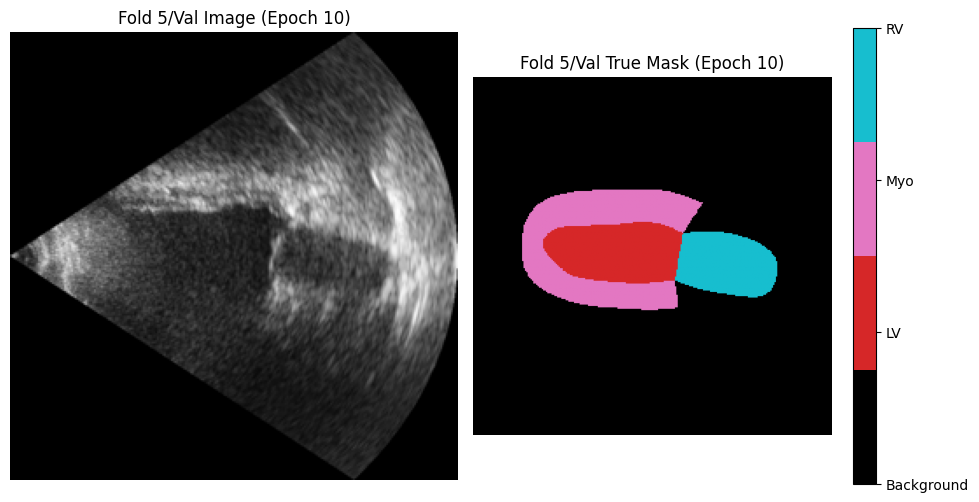

/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


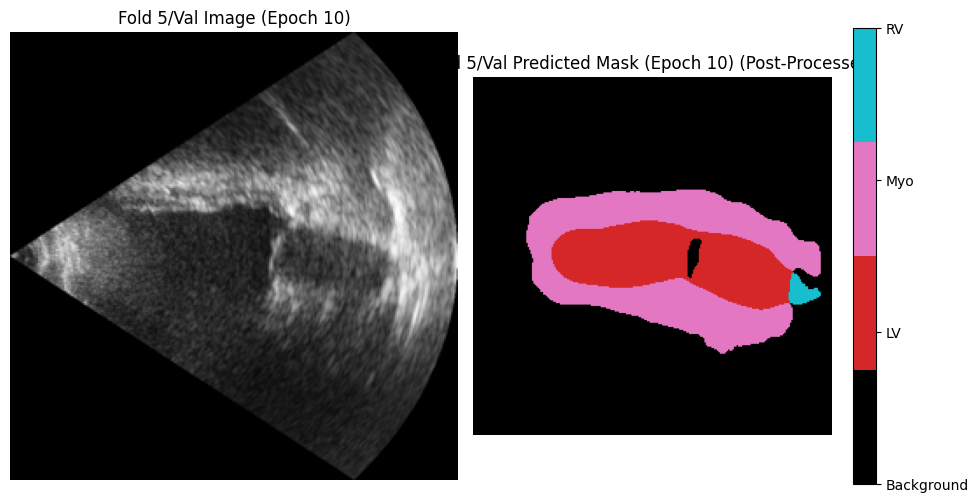

Fold 5/Epoch 10 Validation:   4%|▍         | 1/25 [00:02<01:00,  2.52s/it]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 5/Epoch 10 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.54it/s]


Fold 5/Epoch 10 Validation finished. Average Val Loss: 0.4121
  Fold 5/Overall Avg Val Dice: 0.6809, Overall Avg Val IoU: 0.5622
    LV Dice: 0.7978, IoU: 0.7107
    Myo Dice: 0.6618, IoU: 0.5084
    RV Dice: 0.5830, IoU: 0.4675

Fold 5/Epoch 11/50 - Training


Fold 5/Epoch 11 Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:72: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 5/Epoch 11 Training: 100%|██████████| 100/100 [01:09<00:00,  1.45it/s]


Fold 5/Epoch 11 Training finished. Average Train Loss: 0.2340
Fold 5 - Epoch 11 - Validation


Fold 5/Epoch 11 Validation: 100%|██████████| 25/25 [00:15<00:00,  1.56it/s]


Fold 5/Epoch 11 Validation finished. Average Val Loss: 0.3294
  Fold 5/Overall Avg Val Dice: 0.7284, Overall Avg Val IoU: 0.6060
    LV Dice: 0.8214, IoU: 0.7231
    Myo Dice: 0.6722, IoU: 0.5168
    RV Dice: 0.6915, IoU: 0.5780

Fold 5/Epoch 12/50 - Training


Fold 5/Epoch 12 Training: 100%|██████████| 100/100 [01:09<00:00,  1.43it/s]


Fold 5/Epoch 12 Training finished. Average Train Loss: 0.2182
Fold 5 - Epoch 12 - Validation


Fold 5/Epoch 12 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.54it/s]


Fold 5/Epoch 12 Validation finished. Average Val Loss: 0.3338
  Fold 5/Overall Avg Val Dice: 0.7216, Overall Avg Val IoU: 0.6074
    LV Dice: 0.8094, IoU: 0.7244
    Myo Dice: 0.7190, IoU: 0.5799
    RV Dice: 0.6362, IoU: 0.5177

Fold 5/Epoch 13/50 - Training


Fold 5/Epoch 13 Training: 100%|██████████| 100/100 [01:08<00:00,  1.45it/s]


Fold 5/Epoch 13 Training finished. Average Train Loss: 0.2214
Fold 5 - Epoch 13 - Validation


Fold 5/Epoch 13 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.55it/s]


Fold 5/Epoch 13 Validation finished. Average Val Loss: 0.3034
  Fold 5/Overall Avg Val Dice: 0.7311, Overall Avg Val IoU: 0.6127
    LV Dice: 0.7967, IoU: 0.7083
    Myo Dice: 0.6519, IoU: 0.5050
    RV Dice: 0.7446, IoU: 0.6249
New best model saved! (Overall Dice: 0.7311) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_5/best_unet_temporal_fold5_model.pth

Fold 5/Epoch 14/50 - Training


Fold 5/Epoch 14 Training: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Fold 5/Epoch 14 Training finished. Average Train Loss: 0.2067
Fold 5 - Epoch 14 - Validation


Fold 5/Epoch 14 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.55it/s]


Fold 5/Epoch 14 Validation finished. Average Val Loss: 0.3357
  Fold 5/Overall Avg Val Dice: 0.7289, Overall Avg Val IoU: 0.6106
    LV Dice: 0.8119, IoU: 0.7245
    Myo Dice: 0.6912, IoU: 0.5422
    RV Dice: 0.6836, IoU: 0.5652

Fold 5/Epoch 15/50 - Training


Fold 5/Epoch 15 Training: 100%|██████████| 100/100 [01:10<00:00,  1.42it/s]


Fold 5/Epoch 15 Training finished. Average Train Loss: 0.2024
Fold 5 - Epoch 15 - Validation


Fold 5/Epoch 15 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.55it/s]


Fold 5/Epoch 15 Validation finished. Average Val Loss: 0.2726
  Fold 5/Overall Avg Val Dice: 0.7607, Overall Avg Val IoU: 0.6481
    LV Dice: 0.8262, IoU: 0.7469
    Myo Dice: 0.6931, IoU: 0.5468
    RV Dice: 0.7629, IoU: 0.6507
New best model saved! (Overall Dice: 0.7607) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_5/best_unet_temporal_fold5_model.pth

Fold 5/Epoch 16/50 - Training


Fold 5/Epoch 16 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 5/Epoch 16 Training finished. Average Train Loss: 0.1976
Fold 5 - Epoch 16 - Validation


Fold 5/Epoch 16 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.56it/s]


Fold 5/Epoch 16 Validation finished. Average Val Loss: 0.2585
  Fold 5/Overall Avg Val Dice: 0.7821, Overall Avg Val IoU: 0.6710
    LV Dice: 0.8377, IoU: 0.7526
    Myo Dice: 0.7216, IoU: 0.5788
    RV Dice: 0.7869, IoU: 0.6814
New best model saved! (Overall Dice: 0.7821) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_5/best_unet_temporal_fold5_model.pth

Fold 5/Epoch 17/50 - Training


Fold 5/Epoch 17 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 5/Epoch 17 Training finished. Average Train Loss: 0.1947
Fold 5 - Epoch 17 - Validation


Fold 5/Epoch 17 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.54it/s]


Fold 5/Epoch 17 Validation finished. Average Val Loss: 0.2865
  Fold 5/Overall Avg Val Dice: 0.7744, Overall Avg Val IoU: 0.6608
    LV Dice: 0.8657, IoU: 0.7861
    Myo Dice: 0.6952, IoU: 0.5458
    RV Dice: 0.7623, IoU: 0.6504

Fold 5/Epoch 18/50 - Training


Fold 5/Epoch 18 Training: 100%|██████████| 100/100 [01:09<00:00,  1.43it/s]


Fold 5/Epoch 18 Training finished. Average Train Loss: 0.1974
Fold 5 - Epoch 18 - Validation


Fold 5/Epoch 18 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.52it/s]


Fold 5/Epoch 18 Validation finished. Average Val Loss: 0.4065
  Fold 5/Overall Avg Val Dice: 0.6867, Overall Avg Val IoU: 0.5723
    LV Dice: 0.7686, IoU: 0.6897
    Myo Dice: 0.6113, IoU: 0.4713
    RV Dice: 0.6802, IoU: 0.5558

Fold 5/Epoch 19/50 - Training


Fold 5/Epoch 19 Training: 100%|██████████| 100/100 [01:10<00:00,  1.43it/s]


Fold 5/Epoch 19 Training finished. Average Train Loss: 0.1948
Fold 5 - Epoch 19 - Validation


Fold 5/Epoch 19 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.55it/s]


Fold 5/Epoch 19 Validation finished. Average Val Loss: 0.2715
  Fold 5/Overall Avg Val Dice: 0.7886, Overall Avg Val IoU: 0.6794
    LV Dice: 0.8523, IoU: 0.7713
    Myo Dice: 0.6987, IoU: 0.5514
    RV Dice: 0.8149, IoU: 0.7155
New best model saved! (Overall Dice: 0.7886) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_5/best_unet_temporal_fold5_model.pth

Fold 5/Epoch 20/50 - Training


Fold 5/Epoch 20 Training: 100%|██████████| 100/100 [01:10<00:00,  1.43it/s]


Fold 5/Epoch 20 Training finished. Average Train Loss: 0.1839
Fold 5 - Epoch 20 - Validation


Fold 5/Epoch 20 Validation:   0%|          | 0/25 [00:00<?, ?it/s]


    Fold 5/Visualizing a validation sample from Epoch 20 (True Mask vs Predicted Mask)...


/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


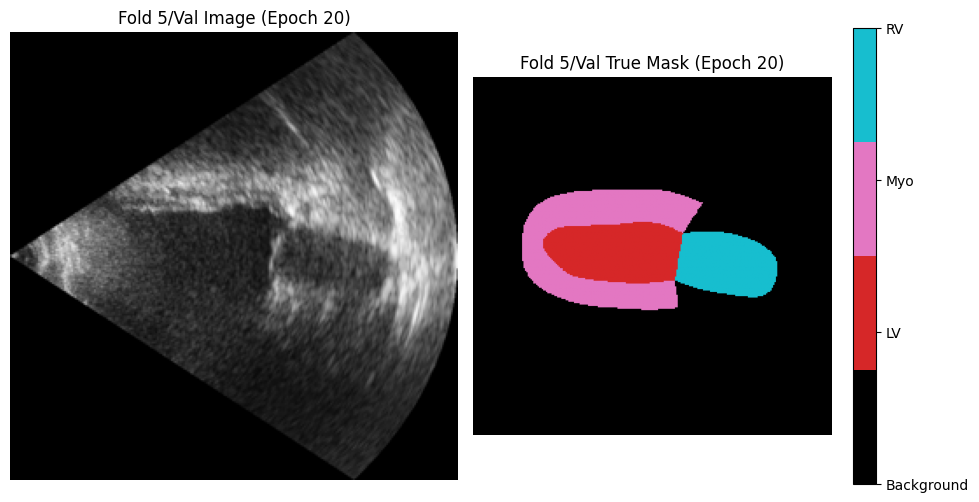

/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


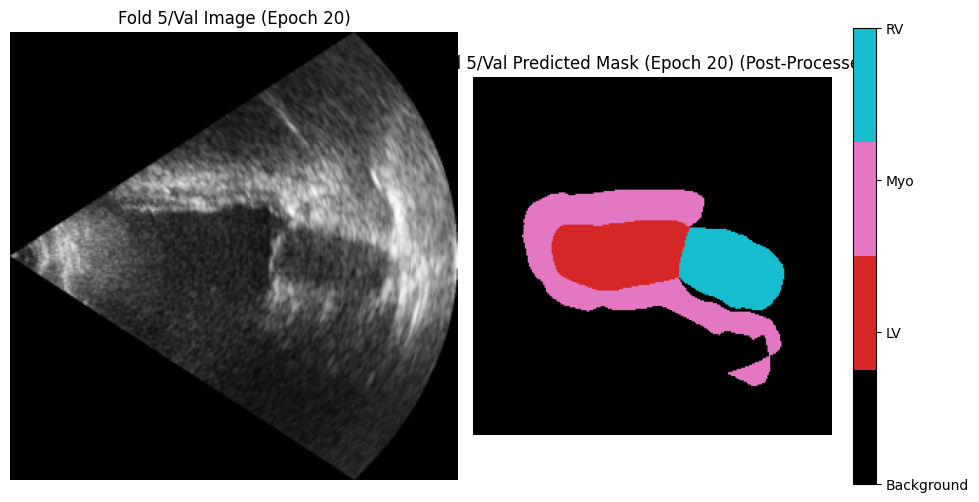

Fold 5/Epoch 20 Validation:   4%|▍         | 1/25 [00:02<00:59,  2.48s/it]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 5/Epoch 20 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.55it/s]


Fold 5/Epoch 20 Validation finished. Average Val Loss: 0.2425
  Fold 5/Overall Avg Val Dice: 0.7979, Overall Avg Val IoU: 0.6916
    LV Dice: 0.8499, IoU: 0.7636
    Myo Dice: 0.7367, IoU: 0.5999
    RV Dice: 0.8072, IoU: 0.7113
New best model saved! (Overall Dice: 0.7979) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_5/best_unet_temporal_fold5_model.pth

Fold 5/Epoch 21/50 - Training


Fold 5/Epoch 21 Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:72: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 5/Epoch 21 Training: 100%|██████████| 100/100 [01:08<00:00,  1.45it/s]


Fold 5/Epoch 21 Training finished. Average Train Loss: 0.1897
Fold 5 - Epoch 21 - Validation


Fold 5/Epoch 21 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.56it/s]


Fold 5/Epoch 21 Validation finished. Average Val Loss: 0.2432
  Fold 5/Overall Avg Val Dice: 0.8023, Overall Avg Val IoU: 0.7003
    LV Dice: 0.8646, IoU: 0.7894
    Myo Dice: 0.7380, IoU: 0.5989
    RV Dice: 0.8044, IoU: 0.7126
New best model saved! (Overall Dice: 0.8023) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_5/best_unet_temporal_fold5_model.pth

Fold 5/Epoch 22/50 - Training


Fold 5/Epoch 22 Training: 100%|██████████| 100/100 [01:09<00:00,  1.45it/s]


Fold 5/Epoch 22 Training finished. Average Train Loss: 0.1796
Fold 5 - Epoch 22 - Validation


Fold 5/Epoch 22 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.54it/s]


Fold 5/Epoch 22 Validation finished. Average Val Loss: 0.2966
  Fold 5/Overall Avg Val Dice: 0.7708, Overall Avg Val IoU: 0.6595
    LV Dice: 0.8214, IoU: 0.7287
    Myo Dice: 0.7021, IoU: 0.5594
    RV Dice: 0.7889, IoU: 0.6904

Fold 5/Epoch 23/50 - Training


Fold 5/Epoch 23 Training: 100%|██████████| 100/100 [01:10<00:00,  1.42it/s]


Fold 5/Epoch 23 Training finished. Average Train Loss: 0.1787
Fold 5 - Epoch 23 - Validation


Fold 5/Epoch 23 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.49it/s]


Fold 5/Epoch 23 Validation finished. Average Val Loss: 0.2267
  Fold 5/Overall Avg Val Dice: 0.7989, Overall Avg Val IoU: 0.6944
    LV Dice: 0.8549, IoU: 0.7713
    Myo Dice: 0.7413, IoU: 0.6050
    RV Dice: 0.8004, IoU: 0.7069

Fold 5/Epoch 24/50 - Training


Fold 5/Epoch 24 Training: 100%|██████████| 100/100 [01:10<00:00,  1.41it/s]


Fold 5/Epoch 24 Training finished. Average Train Loss: 0.1782
Fold 5 - Epoch 24 - Validation


Fold 5/Epoch 24 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.50it/s]


Fold 5/Epoch 24 Validation finished. Average Val Loss: 0.2634
  Fold 5/Overall Avg Val Dice: 0.7820, Overall Avg Val IoU: 0.6743
    LV Dice: 0.8481, IoU: 0.7662
    Myo Dice: 0.7335, IoU: 0.5943
    RV Dice: 0.7645, IoU: 0.6624

Fold 5/Epoch 25/50 - Training


Fold 5/Epoch 25 Training: 100%|██████████| 100/100 [01:10<00:00,  1.42it/s]


Fold 5/Epoch 25 Training finished. Average Train Loss: 0.1722
Fold 5 - Epoch 25 - Validation


Fold 5/Epoch 25 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.52it/s]


Fold 5/Epoch 25 Validation finished. Average Val Loss: 0.3122
  Fold 5/Overall Avg Val Dice: 0.7404, Overall Avg Val IoU: 0.6247
    LV Dice: 0.8346, IoU: 0.7462
    Myo Dice: 0.7397, IoU: 0.6000
    RV Dice: 0.6470, IoU: 0.5278

Fold 5/Epoch 26/50 - Training


Fold 5/Epoch 26 Training: 100%|██████████| 100/100 [01:12<00:00,  1.38it/s]


Fold 5/Epoch 26 Training finished. Average Train Loss: 0.1693
Fold 5 - Epoch 26 - Validation


Fold 5/Epoch 26 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.50it/s]


Fold 5/Epoch 26 Validation finished. Average Val Loss: 0.2309
  Fold 5/Overall Avg Val Dice: 0.7715, Overall Avg Val IoU: 0.6590
    LV Dice: 0.8635, IoU: 0.7715
    Myo Dice: 0.6435, IoU: 0.4913
    RV Dice: 0.8075, IoU: 0.7143

Fold 5/Epoch 27/50 - Training


Fold 5/Epoch 27 Training: 100%|██████████| 100/100 [01:11<00:00,  1.39it/s]


Fold 5/Epoch 27 Training finished. Average Train Loss: 0.1769
Fold 5 - Epoch 27 - Validation


Fold 5/Epoch 27 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.53it/s]


Fold 5/Epoch 27 Validation finished. Average Val Loss: 0.2134
  Fold 5/Overall Avg Val Dice: 0.8142, Overall Avg Val IoU: 0.7130
    LV Dice: 0.8588, IoU: 0.7814
    Myo Dice: 0.7633, IoU: 0.6260
    RV Dice: 0.8206, IoU: 0.7316
New best model saved! (Overall Dice: 0.8142) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_5/best_unet_temporal_fold5_model.pth

Fold 5/Epoch 28/50 - Training


Fold 5/Epoch 28 Training: 100%|██████████| 100/100 [01:10<00:00,  1.42it/s]


Fold 5/Epoch 28 Training finished. Average Train Loss: 0.1645
Fold 5 - Epoch 28 - Validation


Fold 5/Epoch 28 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.50it/s]


Fold 5/Epoch 28 Validation finished. Average Val Loss: 0.2194
  Fold 5/Overall Avg Val Dice: 0.8173, Overall Avg Val IoU: 0.7145
    LV Dice: 0.8690, IoU: 0.7926
    Myo Dice: 0.7739, IoU: 0.6391
    RV Dice: 0.8091, IoU: 0.7117
New best model saved! (Overall Dice: 0.8173) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_5/best_unet_temporal_fold5_model.pth

Fold 5/Epoch 29/50 - Training


Fold 5/Epoch 29 Training: 100%|██████████| 100/100 [01:12<00:00,  1.38it/s]


Fold 5/Epoch 29 Training finished. Average Train Loss: 0.1738
Fold 5 - Epoch 29 - Validation


Fold 5/Epoch 29 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.51it/s]


Fold 5/Epoch 29 Validation finished. Average Val Loss: 0.2105
  Fold 5/Overall Avg Val Dice: 0.8114, Overall Avg Val IoU: 0.7112
    LV Dice: 0.8783, IoU: 0.7999
    Myo Dice: 0.7636, IoU: 0.6351
    RV Dice: 0.7924, IoU: 0.6985

Fold 5/Epoch 30/50 - Training


Fold 5/Epoch 30 Training: 100%|██████████| 100/100 [01:11<00:00,  1.41it/s]


Fold 5/Epoch 30 Training finished. Average Train Loss: 0.1637
Fold 5 - Epoch 30 - Validation


Fold 5/Epoch 30 Validation:   0%|          | 0/25 [00:00<?, ?it/s]


    Fold 5/Visualizing a validation sample from Epoch 30 (True Mask vs Predicted Mask)...


/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


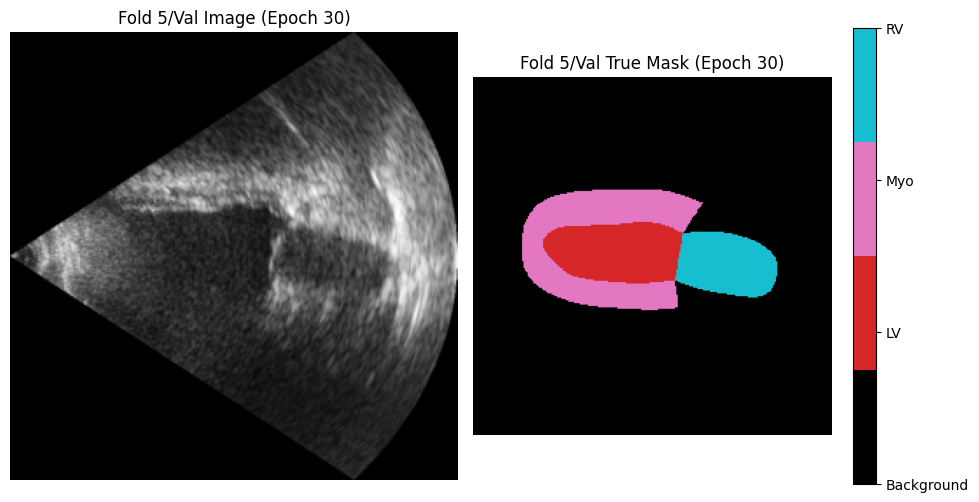

/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


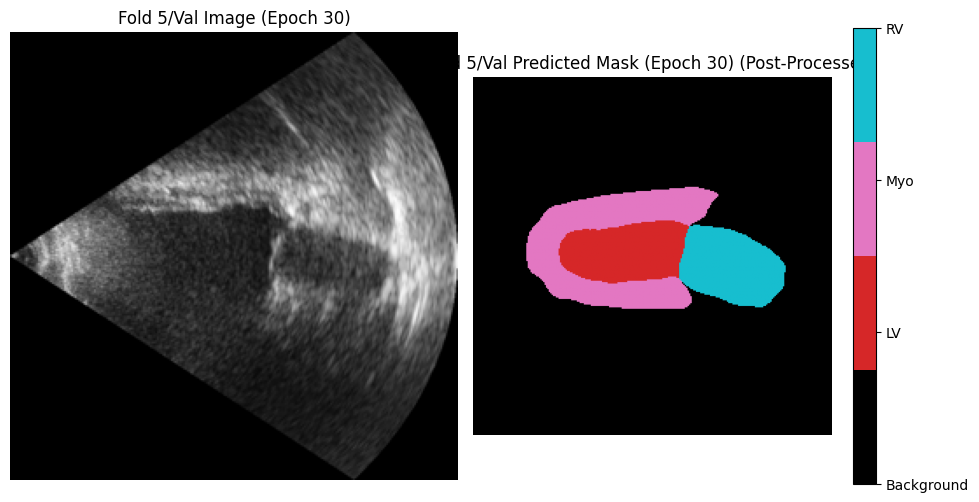

Fold 5/Epoch 30 Validation:   4%|▍         | 1/25 [00:02<01:03,  2.64s/it]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 5/Epoch 30 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.52it/s]


Fold 5/Epoch 30 Validation finished. Average Val Loss: 0.2095
  Fold 5/Overall Avg Val Dice: 0.8259, Overall Avg Val IoU: 0.7257
    LV Dice: 0.8709, IoU: 0.7941
    Myo Dice: 0.7769, IoU: 0.6448
    RV Dice: 0.8298, IoU: 0.7384
New best model saved! (Overall Dice: 0.8259) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_5/best_unet_temporal_fold5_model.pth

Fold 5/Epoch 31/50 - Training


Fold 5/Epoch 31 Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:72: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 5/Epoch 31 Training: 100%|██████████| 100/100 [01:11<00:00,  1.40it/s]


Fold 5/Epoch 31 Training finished. Average Train Loss: 0.1635
Fold 5 - Epoch 31 - Validation


Fold 5/Epoch 31 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.51it/s]


Fold 5/Epoch 31 Validation finished. Average Val Loss: 0.2099
  Fold 5/Overall Avg Val Dice: 0.8293, Overall Avg Val IoU: 0.7309
    LV Dice: 0.8899, IoU: 0.8128
    Myo Dice: 0.7779, IoU: 0.6515
    RV Dice: 0.8200, IoU: 0.7285
New best model saved! (Overall Dice: 0.8293) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_5/best_unet_temporal_fold5_model.pth

Fold 5/Epoch 32/50 - Training


Fold 5/Epoch 32 Training: 100%|██████████| 100/100 [01:10<00:00,  1.43it/s]


Fold 5/Epoch 32 Training finished. Average Train Loss: 0.1674
Fold 5 - Epoch 32 - Validation


Fold 5/Epoch 32 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.51it/s]


Fold 5/Epoch 32 Validation finished. Average Val Loss: 0.2214
  Fold 5/Overall Avg Val Dice: 0.8097, Overall Avg Val IoU: 0.7057
    LV Dice: 0.8461, IoU: 0.7609
    Myo Dice: 0.7629, IoU: 0.6298
    RV Dice: 0.8200, IoU: 0.7262

Fold 5/Epoch 33/50 - Training


Fold 5/Epoch 33 Training: 100%|██████████| 100/100 [01:10<00:00,  1.42it/s]


Fold 5/Epoch 33 Training finished. Average Train Loss: 0.1606
Fold 5 - Epoch 33 - Validation


Fold 5/Epoch 33 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.52it/s]


Fold 5/Epoch 33 Validation finished. Average Val Loss: 0.2062
  Fold 5/Overall Avg Val Dice: 0.8274, Overall Avg Val IoU: 0.7284
    LV Dice: 0.8769, IoU: 0.7973
    Myo Dice: 0.8026, IoU: 0.6786
    RV Dice: 0.8027, IoU: 0.7092

Fold 5/Epoch 34/50 - Training


Fold 5/Epoch 34 Training: 100%|██████████| 100/100 [01:09<00:00,  1.43it/s]


Fold 5/Epoch 34 Training finished. Average Train Loss: 0.1634
Fold 5 - Epoch 34 - Validation


Fold 5/Epoch 34 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.53it/s]


Fold 5/Epoch 34 Validation finished. Average Val Loss: 0.2365
  Fold 5/Overall Avg Val Dice: 0.7876, Overall Avg Val IoU: 0.6838
    LV Dice: 0.8505, IoU: 0.7675
    Myo Dice: 0.7041, IoU: 0.5628
    RV Dice: 0.8084, IoU: 0.7210

Fold 5/Epoch 35/50 - Training


Fold 5/Epoch 35 Training: 100%|██████████| 100/100 [01:10<00:00,  1.42it/s]


Fold 5/Epoch 35 Training finished. Average Train Loss: 0.1607
Fold 5 - Epoch 35 - Validation


Fold 5/Epoch 35 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.52it/s]


Fold 5/Epoch 35 Validation finished. Average Val Loss: 0.2486
  Fold 5/Overall Avg Val Dice: 0.8007, Overall Avg Val IoU: 0.7011
    LV Dice: 0.8343, IoU: 0.7606
    Myo Dice: 0.7485, IoU: 0.6138
    RV Dice: 0.8193, IoU: 0.7288

Fold 5/Epoch 36/50 - Training


Fold 5/Epoch 36 Training: 100%|██████████| 100/100 [01:09<00:00,  1.43it/s]


Fold 5/Epoch 36 Training finished. Average Train Loss: 0.1572
Fold 5 - Epoch 36 - Validation


Fold 5/Epoch 36 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.50it/s]


Fold 5/Epoch 36 Validation finished. Average Val Loss: 0.2101
  Fold 5/Overall Avg Val Dice: 0.8121, Overall Avg Val IoU: 0.7122
    LV Dice: 0.8709, IoU: 0.7905
    Myo Dice: 0.7270, IoU: 0.5941
    RV Dice: 0.8385, IoU: 0.7520

Fold 5/Epoch 37/50 - Training


Fold 5/Epoch 37 Training: 100%|██████████| 100/100 [01:10<00:00,  1.42it/s]


Fold 5/Epoch 37 Training finished. Average Train Loss: 0.1550
Fold 5 - Epoch 37 - Validation


Fold 5/Epoch 37 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.51it/s]


Fold 5/Epoch 37 Validation finished. Average Val Loss: 0.2366
  Fold 5/Overall Avg Val Dice: 0.8087, Overall Avg Val IoU: 0.7089
    LV Dice: 0.8635, IoU: 0.7889
    Myo Dice: 0.7696, IoU: 0.6418
    RV Dice: 0.7930, IoU: 0.6958

Fold 5/Epoch 38/50 - Training


Fold 5/Epoch 38 Training: 100%|██████████| 100/100 [01:10<00:00,  1.41it/s]


Fold 5/Epoch 38 Training finished. Average Train Loss: 0.1533
Fold 5 - Epoch 38 - Validation


Fold 5/Epoch 38 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.52it/s]


Fold 5/Epoch 38 Validation finished. Average Val Loss: 0.1866
  Fold 5/Overall Avg Val Dice: 0.8379, Overall Avg Val IoU: 0.7434
    LV Dice: 0.8980, IoU: 0.8259
    Myo Dice: 0.7704, IoU: 0.6463
    RV Dice: 0.8452, IoU: 0.7580
New best model saved! (Overall Dice: 0.8379) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_5/best_unet_temporal_fold5_model.pth

Fold 5/Epoch 39/50 - Training


Fold 5/Epoch 39 Training: 100%|██████████| 100/100 [01:11<00:00,  1.40it/s]


Fold 5/Epoch 39 Training finished. Average Train Loss: 0.1368
Fold 5 - Epoch 39 - Validation


Fold 5/Epoch 39 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.50it/s]


Fold 5/Epoch 39 Validation finished. Average Val Loss: 0.1798
  Fold 5/Overall Avg Val Dice: 0.8486, Overall Avg Val IoU: 0.7560
    LV Dice: 0.8984, IoU: 0.8269
    Myo Dice: 0.7901, IoU: 0.6700
    RV Dice: 0.8573, IoU: 0.7710
New best model saved! (Overall Dice: 0.8486) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_5/best_unet_temporal_fold5_model.pth

Fold 5/Epoch 40/50 - Training


Fold 5/Epoch 40 Training: 100%|██████████| 100/100 [01:10<00:00,  1.41it/s]


Fold 5/Epoch 40 Training finished. Average Train Loss: 0.1360
Fold 5 - Epoch 40 - Validation


Fold 5/Epoch 40 Validation:   0%|          | 0/25 [00:00<?, ?it/s]


    Fold 5/Visualizing a validation sample from Epoch 40 (True Mask vs Predicted Mask)...


/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


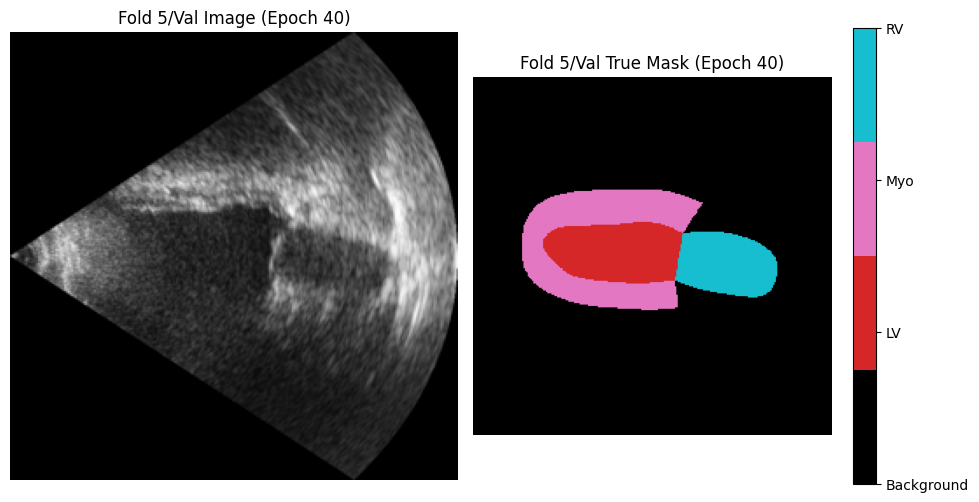

/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


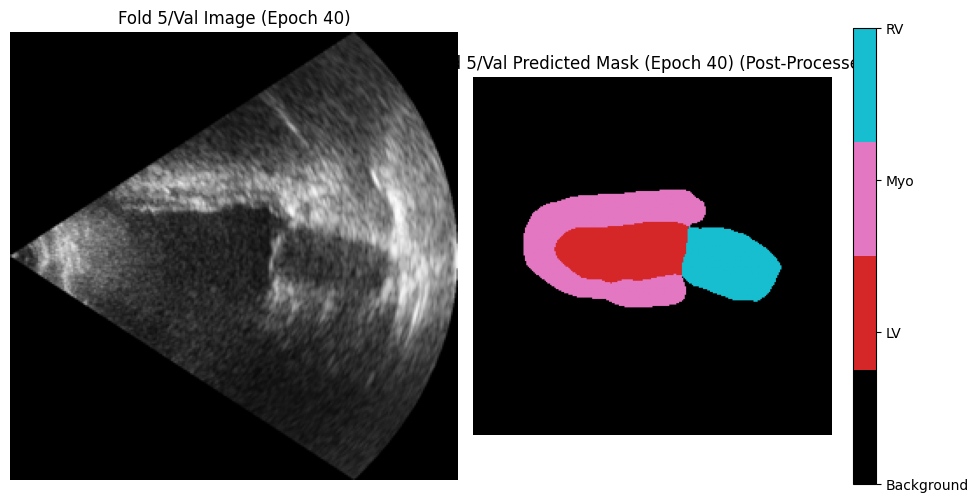

Fold 5/Epoch 40 Validation:   4%|▍         | 1/25 [00:02<01:01,  2.58s/it]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 5/Epoch 40 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.51it/s]


Fold 5/Epoch 40 Validation finished. Average Val Loss: 0.1818
  Fold 5/Overall Avg Val Dice: 0.8413, Overall Avg Val IoU: 0.7488
    LV Dice: 0.8968, IoU: 0.8248
    Myo Dice: 0.7844, IoU: 0.6627
    RV Dice: 0.8428, IoU: 0.7588

Fold 5/Epoch 41/50 - Training


Fold 5/Epoch 41 Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-14-3834079281.py:72: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 5/Epoch 41 Training: 100%|██████████| 100/100 [01:10<00:00,  1.43it/s]


Fold 5/Epoch 41 Training finished. Average Train Loss: 0.1322
Fold 5 - Epoch 41 - Validation


Fold 5/Epoch 41 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.51it/s]


Fold 5/Epoch 41 Validation finished. Average Val Loss: 0.1769
  Fold 5/Overall Avg Val Dice: 0.8459, Overall Avg Val IoU: 0.7549
    LV Dice: 0.8977, IoU: 0.8259
    Myo Dice: 0.7936, IoU: 0.6758
    RV Dice: 0.8465, IoU: 0.7630

Fold 5/Epoch 42/50 - Training


Fold 5/Epoch 42 Training: 100%|██████████| 100/100 [01:10<00:00,  1.41it/s]


Fold 5/Epoch 42 Training finished. Average Train Loss: 0.1327
Fold 5 - Epoch 42 - Validation


Fold 5/Epoch 42 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.52it/s]


Fold 5/Epoch 42 Validation finished. Average Val Loss: 0.1763
  Fold 5/Overall Avg Val Dice: 0.8458, Overall Avg Val IoU: 0.7547
    LV Dice: 0.8972, IoU: 0.8249
    Myo Dice: 0.7908, IoU: 0.6709
    RV Dice: 0.8495, IoU: 0.7682

Fold 5/Epoch 43/50 - Training


Fold 5/Epoch 43 Training: 100%|██████████| 100/100 [01:11<00:00,  1.40it/s]


Fold 5/Epoch 43 Training finished. Average Train Loss: 0.1333
Fold 5 - Epoch 43 - Validation


Fold 5/Epoch 43 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.53it/s]


Fold 5/Epoch 43 Validation finished. Average Val Loss: 0.1805
  Fold 5/Overall Avg Val Dice: 0.8438, Overall Avg Val IoU: 0.7523
    LV Dice: 0.8954, IoU: 0.8229
    Myo Dice: 0.7928, IoU: 0.6740
    RV Dice: 0.8431, IoU: 0.7601

Fold 5/Epoch 44/50 - Training


Fold 5/Epoch 44 Training: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Fold 5/Epoch 44 Training finished. Average Train Loss: 0.1329
Fold 5 - Epoch 44 - Validation


Fold 5/Epoch 44 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.51it/s]


Fold 5/Epoch 44 Validation finished. Average Val Loss: 0.1731
  Fold 5/Overall Avg Val Dice: 0.8499, Overall Avg Val IoU: 0.7593
    LV Dice: 0.9048, IoU: 0.8325
    Myo Dice: 0.7987, IoU: 0.6812
    RV Dice: 0.8462, IoU: 0.7643
New best model saved! (Overall Dice: 0.8499) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_5/best_unet_temporal_fold5_model.pth

Fold 5/Epoch 45/50 - Training


Fold 5/Epoch 45 Training: 100%|██████████| 100/100 [01:11<00:00,  1.41it/s]


Fold 5/Epoch 45 Training finished. Average Train Loss: 0.1317
Fold 5 - Epoch 45 - Validation


Fold 5/Epoch 45 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.51it/s]


Fold 5/Epoch 45 Validation finished. Average Val Loss: 0.1725
  Fold 5/Overall Avg Val Dice: 0.8466, Overall Avg Val IoU: 0.7570
    LV Dice: 0.8985, IoU: 0.8273
    Myo Dice: 0.7996, IoU: 0.6837
    RV Dice: 0.8418, IoU: 0.7600

Fold 5/Epoch 46/50 - Training


Fold 5/Epoch 46 Training: 100%|██████████| 100/100 [01:09<00:00,  1.43it/s]


Fold 5/Epoch 46 Training finished. Average Train Loss: 0.1298
Fold 5 - Epoch 46 - Validation


Fold 5/Epoch 46 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.53it/s]


Fold 5/Epoch 46 Validation finished. Average Val Loss: 0.1752
  Fold 5/Overall Avg Val Dice: 0.8454, Overall Avg Val IoU: 0.7544
    LV Dice: 0.8993, IoU: 0.8282
    Myo Dice: 0.7987, IoU: 0.6820
    RV Dice: 0.8381, IoU: 0.7530

Fold 5/Epoch 47/50 - Training


Fold 5/Epoch 47 Training: 100%|██████████| 100/100 [01:10<00:00,  1.42it/s]


Fold 5/Epoch 47 Training finished. Average Train Loss: 0.1305
Fold 5 - Epoch 47 - Validation


Fold 5/Epoch 47 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.51it/s]


Fold 5/Epoch 47 Validation finished. Average Val Loss: 0.1706
  Fold 5/Overall Avg Val Dice: 0.8543, Overall Avg Val IoU: 0.7640
    LV Dice: 0.9079, IoU: 0.8358
    Myo Dice: 0.8068, IoU: 0.6906
    RV Dice: 0.8484, IoU: 0.7656
New best model saved! (Overall Dice: 0.8543) to /content/drive/MyDrive/MyCardiacAIProject/unet_temporal_checkpoints/fold_5/best_unet_temporal_fold5_model.pth

Fold 5/Epoch 48/50 - Training


Fold 5/Epoch 48 Training: 100%|██████████| 100/100 [01:11<00:00,  1.40it/s]


Fold 5/Epoch 48 Training finished. Average Train Loss: 0.1269
Fold 5 - Epoch 48 - Validation


Fold 5/Epoch 48 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.51it/s]


Fold 5/Epoch 48 Validation finished. Average Val Loss: 0.1725
  Fold 5/Overall Avg Val Dice: 0.8504, Overall Avg Val IoU: 0.7606
    LV Dice: 0.9000, IoU: 0.8296
    Myo Dice: 0.8056, IoU: 0.6890
    RV Dice: 0.8455, IoU: 0.7632

Fold 5/Epoch 49/50 - Training


Fold 5/Epoch 49 Training: 100%|██████████| 100/100 [01:10<00:00,  1.42it/s]


Fold 5/Epoch 49 Training finished. Average Train Loss: 0.1270
Fold 5 - Epoch 49 - Validation


Fold 5/Epoch 49 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.52it/s]


Fold 5/Epoch 49 Validation finished. Average Val Loss: 0.1761
  Fold 5/Overall Avg Val Dice: 0.8476, Overall Avg Val IoU: 0.7562
    LV Dice: 0.9025, IoU: 0.8282
    Myo Dice: 0.8011, IoU: 0.6849
    RV Dice: 0.8392, IoU: 0.7555

Fold 5/Epoch 50/50 - Training


Fold 5/Epoch 50 Training: 100%|██████████| 100/100 [01:11<00:00,  1.39it/s]


Fold 5/Epoch 50 Training finished. Average Train Loss: 0.1291
Fold 5 - Epoch 50 - Validation


Fold 5/Epoch 50 Validation:   0%|          | 0/25 [00:00<?, ?it/s]


    Fold 5/Visualizing a validation sample from Epoch 50 (True Mask vs Predicted Mask)...


/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


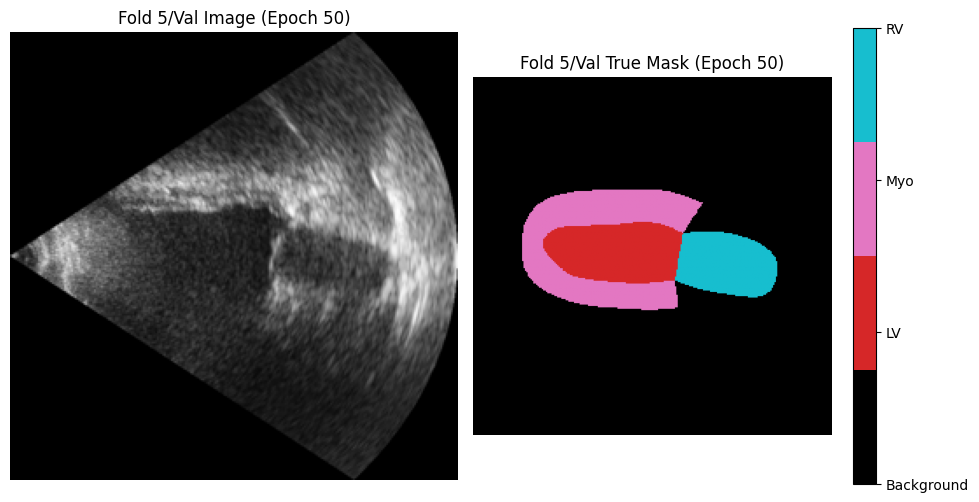

/tmp/ipython-input-11-2162615753.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', int(mask_np.max()) + 1)


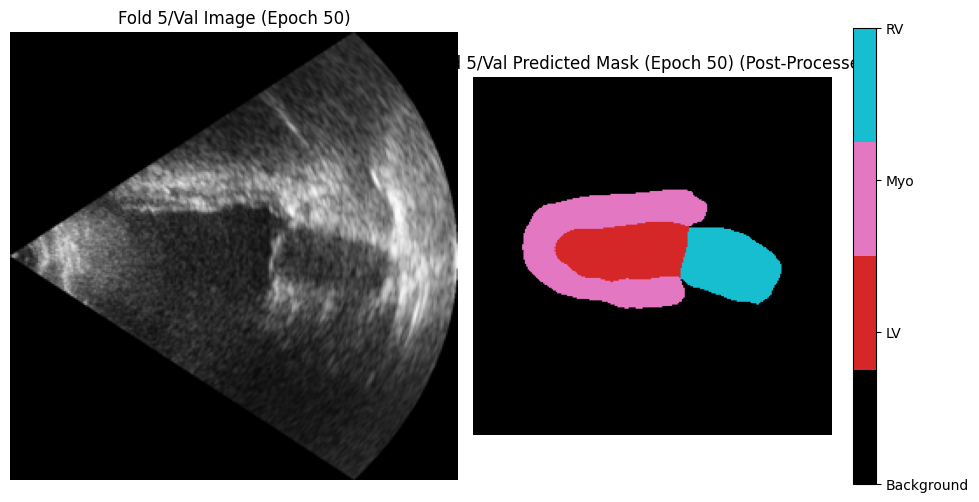

Fold 5/Epoch 50 Validation:   4%|▍         | 1/25 [00:02<01:02,  2.60s/it]/tmp/ipython-input-14-3834079281.py:103: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Fold 5/Epoch 50 Validation: 100%|██████████| 25/25 [00:16<00:00,  1.49it/s]

Fold 5/Epoch 50 Validation finished. Average Val Loss: 0.1730
  Fold 5/Overall Avg Val Dice: 0.8494, Overall Avg Val IoU: 0.7596
    LV Dice: 0.8976, IoU: 0.8260
    Myo Dice: 0.8010, IoU: 0.6845
    RV Dice: 0.8497, IoU: 0.7683

Fold 5/Training complete!


In [ ]:
print("\n--- Setting up Cross-Validation ---")

# Define base transform for all datasets
base_transform = transforms.Compose([
    ResizeImageAndMask((256, 256)), # Target image resolution (Height, Width)
])

# Initialize the full dataset once. is_train=False here is irrelevant as it's just for indexing.
full_camus_dataset_for_cv = CamusTemporalDataset(root_dir=data_path, transform=None, sequence_length=10, is_train=False)

if len(full_camus_dataset_for_cv.samples) == 0:
    raise ValueError("No samples found in the dataset for cross-validation. Please check data path and structure.")

# Set up K-Fold Cross-Validation
n_splits = 5 # Number of folds for cross-validation
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42) # Shuffle and fix random_state for reproducibility


all_fold_metrics = [] # To store detailed metrics

# Model Configuration Parameters
CONFIG_N_FEATURES_START = 16 # Corresponds to n_features_start in UNetTemporal
CONFIG_DEPTH_LEVELS = 3      # Corresponds to depth_levels in UNetTemporal


print(f"Starting {n_splits}-Fold Cross-Validation with:")
print(f"  Model: Initial Features={CONFIG_N_FEATURES_START}, Depth={CONFIG_DEPTH_LEVELS}")
print(f"  Sequence Length: {full_camus_dataset_for_cv.sequence_length}")
print(f"  Max Epochs per fold: {COMMON_NUM_EPOCHS}")
print(f"  Batch Size: {COMMON_BATCH_SIZE}")
print(f"  Initial Learning Rate: {COMMON_LR}")
print(f"  Early Stopping Patience: {COMMON_EARLY_STOPPING_PATIENCE}")


for fold_idx, (train_indices, val_indices) in enumerate(kf.split(range(len(full_camus_dataset_for_cv.samples)))):
    print(f"\n======== Starting Fold {fold_idx + 1}/{n_splits} ========")

    # Create dataset instances for current fold's train/val splits
    train_fold_dataset = CamusTemporalDataset(root_dir=data_path, transform=base_transform,
                                              sequence_length=full_camus_dataset_for_cv.sequence_length, is_train=True)
    train_fold_dataset = Subset(train_fold_dataset, train_indices)

    val_fold_dataset = CamusTemporalDataset(root_dir=data_path, transform=base_transform,
                                            sequence_length=full_camus_dataset_for_cv.sequence_length, is_train=False)
    val_fold_dataset = Subset(val_fold_dataset, val_indices)

    # Create DataLoaders for current fold
    train_loader = DataLoader(
        train_fold_dataset,
        batch_size=COMMON_BATCH_SIZE,
        shuffle=True,
        num_workers=2,
        collate_fn=custom_collate_fn,
        pin_memory=True
    )

    val_loader = DataLoader(
        val_fold_dataset,
        batch_size=COMMON_BATCH_SIZE,
        shuffle=False,
        num_workers=2,
        collate_fn=custom_collate_fn,
        pin_memory=True
    )
    print(f"Fold {fold_idx + 1}: Training DataLoader has {len(train_loader)} batches ({len(train_fold_dataset)} samples).")
    print(f"Fold {fold_idx + 1}: Validation DataLoader has {len(val_loader)} batches ({len(val_fold_dataset)} samples).")

    # Instantiate model, loss, optimizer, and scheduler for EACH fold
    model = UNetTemporal(n_channels=input_channels, n_classes=output_classes,
                         sequence_length=full_camus_dataset_for_cv.sequence_length,
                         n_features_start=CONFIG_N_FEATURES_START,
                         depth_levels=CONFIG_DEPTH_LEVELS)
    model.to(device)

    criterion = CombinedLoss(num_classes=output_classes, ce_weight=0.5, dice_weight=0.5)
    optimizer = optim.Adam(model.parameters(), lr=COMMON_LR)
    scheduler = ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=5, verbose=True)
    scaler = amp.GradScaler()

    # Define checkpoint directory for this fold
    fold_checkpoint_dir = os.path.join(CHECKPOINT_DIR, f"fold_{fold_idx+1}")
    os.makedirs(fold_checkpoint_dir, exist_ok=True)
    print(f"Checkpoints for Fold {fold_idx + 1} will be saved to: {fold_checkpoint_dir}")

    # Train the model for the current fold
    fold_results = train_model(train_loader, val_loader, model, criterion, optimizer, scheduler, scaler,
                               device, COMMON_NUM_EPOCHS, fold_checkpoint_dir, fold_idx=fold_idx,
                               output_classes=output_classes, early_stopping_patience=COMMON_EARLY_STOPPING_PATIENCE,
                               min_delta=COMMON_MIN_DELTA) # Pass min_delta

    all_fold_metrics.append(fold_results)

    # Store the best validation Dice and IoU for the current fold for final aggregation
    # The `train_model` function returns these now
    all_fold_dice_scores_per_class['LV'].append(fold_results['best_val_dice_per_class'][1])
    all_fold_dice_scores_per_class['Myo'].append(fold_results['best_val_dice_per_class'][2])
    all_fold_dice_scores_per_class['RV'].append(fold_results['best_val_dice_per_class'][3])

    all_fold_iou_scores_per_class['LV'].append(fold_results['best_val_iou_per_class'][1])
    all_fold_iou_scores_per_class['Myo'].append(fold_results['best_val_iou_per_class'][2])
    all_fold_iou_scores_per_class['RV'].append(fold_results['best_val_iou_per_class'][3])


# Cell 12: Final Cross-Validation Results

In [ ]:
print("\n--- Cross-Validation Complete ---")

print(f"Total folds completed: {COMMON_NUM_EPOCHS if 'COMMON_NUM_EPOCHS' in locals() else 'N/A'}. Oops! Should be `n_splits`.")
# Correcting the print:
print(f"Total folds completed: {n_splits}")

# Define class labels mapping for printing results
class_labels_for_print = {1: 'LV', 2: 'Myo', 3: 'RV'}

print("\nOverall Cross-Validation Results (Mean ± Std Dev on Test Sets):")

# Iterate through the foreground class names (LV, Myo, RV) to print aggregated results.
for class_idx in range(1, output_classes): # Loop through LV, Myo, RV
    class_name = class_labels_for_print.get(class_idx, f'Class_{class_idx}')

    # Retrieve all Dice scores for the current class from all folds
    dice_scores_for_class = all_fold_dice_scores_per_class[class_name]
    # Calculate the mean and standard deviation of Dice scores
    mean_dice = np.mean(dice_scores_for_class)
    std_dice = np.std(dice_scores_for_class)

    # Retrieve all IoU scores for the current class from all folds
    iou_scores_for_class = all_fold_iou_scores_per_class[class_name]
    # Calculate the mean and standard deviation of IoU scores
    mean_iou = np.mean(iou_scores_for_class)
    std_iou = np.std(iou_scores_for_class)

    # Print the formatted results (mean ± standard deviation).
    print(f"  {class_name} Dice: {mean_dice:.4f} ± {std_dice:.4f}")
    print(f"  {class_name} IoU: {mean_iou:.4f} ± {std_iou:.4f}")

print("\nTraining and evaluation process complete!")




--- Cross-Validation Complete ---
Total folds completed: 50. Oops! Should be `n_splits`.
Total folds completed: 5

Overall Cross-Validation Results (Mean ± Std Dev on Test Sets):
  LV Dice: 0.8629 ± 0.0498
  LV IoU: 0.7826 ± 0.0582
  Myo Dice: 0.7724 ± 0.0483
  Myo IoU: 0.6440 ± 0.0600
  RV Dice: 0.7636 ± 0.0940
  RV IoU: 0.6634 ± 0.0993

Training and evaluation process complete!
Consider trying different 'CONFIG_N_FEATURES_START' and 'CONFIG_DEPTH_LEVELS' for best results.


# Cell 13: Plotting Aggregated Metrics from All Folds


--- Plotting Aggregated Metrics from All Folds ---


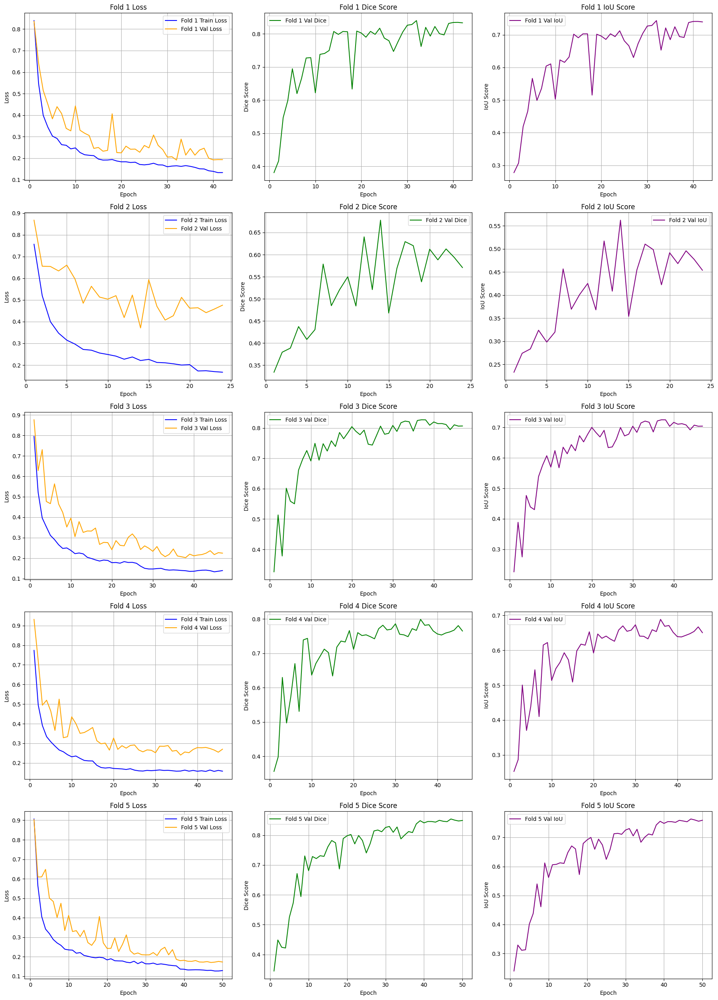


Individual fold learning curves displayed above.


In [ ]:
print("\n--- Plotting Aggregated Metrics from All Folds ---")

# Determine the number of rows needed for subplots (one row per fold)
num_rows = len(all_fold_metrics)
if num_rows == 0:
    print("No fold metrics available to plot. Please ensure cross-validation completed successfully.")
else:
    # Create a figure with subplots: 3 columns (Loss, Dice, IoU) and `num_rows` rows
    # Figure height adjusted dynamically based on the number of folds for better visualization.
    plt.figure(figsize=(18, 5 * num_rows)) # 18 inches wide, 5 inches height per row

    # Iterate through the results of each fold and plot their learning curves
    for fold_idx, metrics in enumerate(all_fold_metrics):
        # Determine the range of epochs for which data is available for this fold
        # This accounts for early stopping, where not all `COMMON_NUM_EPOCHS` might have been run.
        epochs_range = range(1, len(metrics['train_losses']) + 1)

        #Plot Training & Validation Loss for the current fold
        # plt.subplot(rows, columns, plot_number)`
        plt.subplot(num_rows, 3, fold_idx * 3 + 1)
        plt.plot(epochs_range, metrics['train_losses'], label=f'Fold {fold_idx+1} Train Loss', color='blue')
        plt.plot(epochs_range, metrics['val_losses'], label=f'Fold {fold_idx+1} Val Loss', color='orange')
        plt.title(f'Fold {fold_idx+1} Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True) # Add grid for better readability

        #Plot Overall Average Dice Score for the current fold
        plt.subplot(num_rows, 3, fold_idx * 3 + 2)
        plt.plot(epochs_range, metrics['val_avg_dice_scores'], label=f'Fold {fold_idx+1} Val Dice', color='green')
        plt.title(f'Fold {fold_idx+1} Dice Score')
        plt.xlabel('Epoch')
        plt.ylabel('Dice Score')
        plt.legend()
        plt.grid(True)

        # Plot Overall Average IoU Score for the current fold -
        plt.subplot(num_rows, 3, fold_idx * 3 + 3)
        plt.plot(epochs_range, metrics['val_avg_iou_scores'], label=f'Fold {fold_idx+1} Val IoU', color='purple')
        plt.title(f'Fold {fold_idx+1} IoU Score')
        plt.xlabel('Epoch')
        plt.ylabel('IoU Score')
        plt.legend()
        plt.grid(True)

    plt.tight_layout()
    plt.show()

print("\nIndividual fold learning curves displayed above.")
